Traffic Signs Classification
---

The main goal of this project is to perform Traffic Sign Classification from cropped images of traffic signs such speed limits, stop sign, and right turn ahead to name a few. This sort of classification is performed very commonly in the autonomous vehicle industry. The aim of this project is to implement Convolution Neural Network based deep learning algorithms, benchmark their performance, and produce a high performing model.

In [ ]:
# Importing Standard Libraries

# basic packages
import numpy as np
import pandas as pd
from tqdm import tqdm
from random import randint
from timeit import default_timer as timer
import matplotlib.pyplot as plt
import time
from imutils import paths
import cv2
import glob
import h5py
import imutils
import matplotlib.pyplot as plt
import os
import pickle
import progressbar
import random

# sklearn functions
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle

# keras & tf functions
import tensorflow as tf
from tensorflow.keras.layers import InputLayer
from tensorflow.keras import backend
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1
from tensorflow.keras.utils import to_categorical

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
DATA_DIR = "/content/drive/My Drive/Colab Notebooks (1)/Data/Data/traffic-signs-preprocessed/"


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Dataset

#### Download dataset

In [ ]:
# Load dataset from kaggle
# https://www.kaggle.com/valentynsichkar/traffic-signs-preprocessed?select=datasets_preparing.py

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

# Load dataset from kaggle
!kaggle datasets download -d valentynsichkar/traffic-signs-preprocessed
# Unzip dataset
!unzip \*.zip  && rm *.zip

# Move dataset to Data folder
import shutil
for directory in os.listdir():
    if ('.pickle' in directory) or ('.csv' in directory)  or ('.py' in directory):
        directory = '/content/' + directory
        #print(directory)
        shutil.move(directory, DATA_DIR) 

100% 4.16G/4.16G [00:54<00:00, 57.1MB/s]
100% 4.16G/4.16G [00:54<00:00, 82.1MB/s]
Archive:  traffic-signs-preprocessed.zip
  inflating: data0.pickle            
  inflating: data1.pickle            
  inflating: data2.pickle            
  inflating: data3.pickle            
  inflating: data4.pickle            
  inflating: data5.pickle            
  inflating: data6.pickle            
  inflating: data7.pickle            
  inflating: data8.pickle            
  inflating: datasets_preparing.py   
  inflating: label_names.csv         
  inflating: labels.pickle           
  inflating: mean_image_gray.pickle  
  inflating: mean_image_rgb.pickle   
  inflating: std_gray.pickle         
  inflating: std_rgb.pickle          
  inflating: test.pickle             
  inflating: train.pickle            
  inflating: valid.pickle            


### Load data

In [ ]:
# Load augmented data images
data = pickle.load(open(DATA_DIR + 'data_aug_1.pickle', 'rb'))

# Extract Train Images
train_images = data['images']
train_labels = data['labels']

# Load validation and test files
valid = pickle.load(open(DATA_DIR + 'valid.pickle', 'rb'))
test = pickle.load(open(DATA_DIR + 'test.pickle', 'rb'))
labels = pd.read_csv(DATA_DIR + 'label_names.csv')

# Extract validation and test image and label sets
valid_images = valid['features']
valid_labels = valid['labels']
test_images = test['features']
test_labels = test['labels']

# Normalize validation and test set
valid_images = preprocess_data(valid_images,norm_255=True)
test_images = preprocess_data(test_images,norm_255=True)

In [ ]:
# Reading Labels from csv
# Contains class id and traffic sign names
labels = pd.read_csv(DATA_DIR + 'label_names.csv')
labels

,ClassId,SignName
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)
5,5,Speed limit (80km/h)
6,6,End of speed limit (80km/h)
7,7,Speed limit (100km/h)
8,8,Speed limit (120km/h)
9,9,No passing


In [ ]:
# Setting model parameters
BATCH_SIZE = 128
NUM_CLASSES = 43

In [ ]:
from sklearn.utils import shuffle

# Shuffle
# train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
valid_images ,valid_labels = shuffle(valid_images, valid_labels, random_state=147865452)
test_images ,test_labels = shuffle(test_images, test_labels, random_state=147865452)


In [ ]:
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)

(86430, 32, 32, 3)
(4410, 32, 32, 3)
(12630, 32, 32, 3)


### Visualization

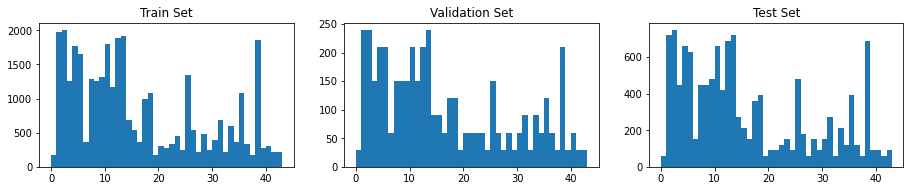

In [ ]:
# Plotting a histogram of all labels in Train, Validation and Test Sets

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(train_labels, bins) 
ax[0].set_title('Train Set')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass



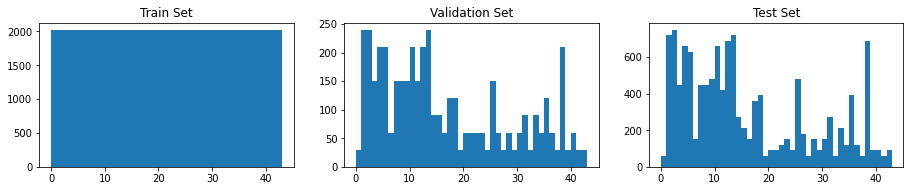

In [ ]:
# Plotting a histogram of all labels in Train, Validation and Test Sets from the augmented data provided the dataset
import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# data = pickle.load(open(DATA_DIR + 'data0.pickle', 'rb'))

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(data['y_train'], bins) 
ax[0].set_title('Train Set')
ax[1].hist(data['y_validation'], bins) 
ax[1].set_title('Validation Set')
ax[2].hist(data['y_test'], bins) 
ax[2].set_title('Test Set')
pass


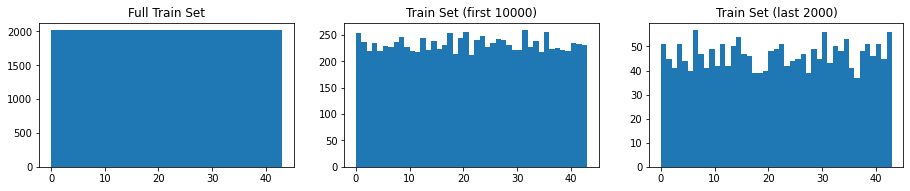

In [ ]:
# Plotting a histogram of histogram equalized train set

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# data = pickle.load(open(DATA_DIR + 'data0.pickle', 'rb'))

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(train_labels, bins) 
ax[0].set_title('Full Train Set')
ax[1].hist(train_labels[:10000], bins) 
ax[1].set_title('Train Set (first 10000)')
ax[2].hist(train_labels[-2000:], bins) 
ax[2].set_title('Train Set (last 2000)')
pass


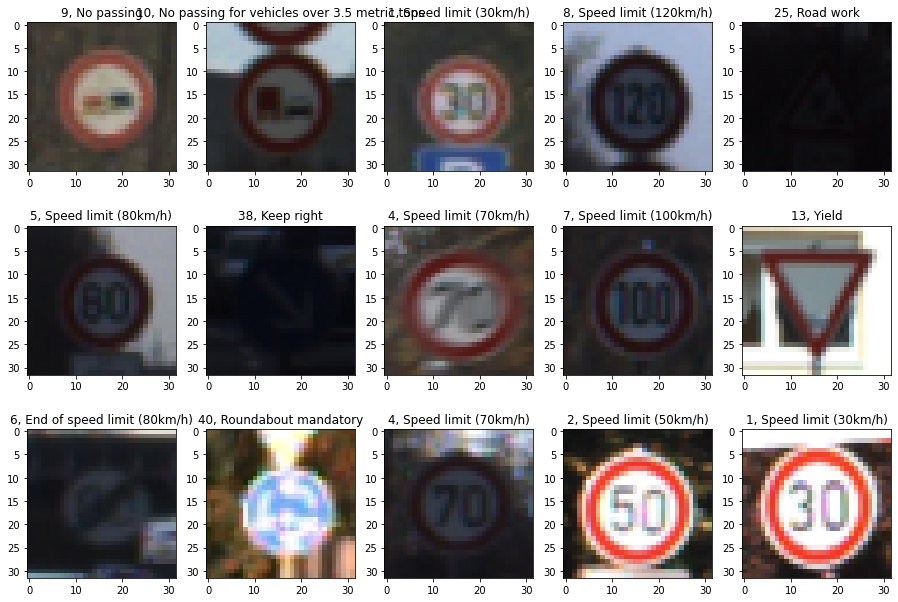

In [ ]:
# Print Random images from train set

f,ax = plt.subplots(3,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,3,1):

    for j in range(0,5,1):
        rndnum = randint(0,train_images.shape[0]-1)
        picture = train_images[rndnum]
        ax[i,j].imshow(picture)
        ax[i,j].set_title(str(train_labels[rndnum]) + ', ' + labels['SignName'][train_labels[rndnum]])


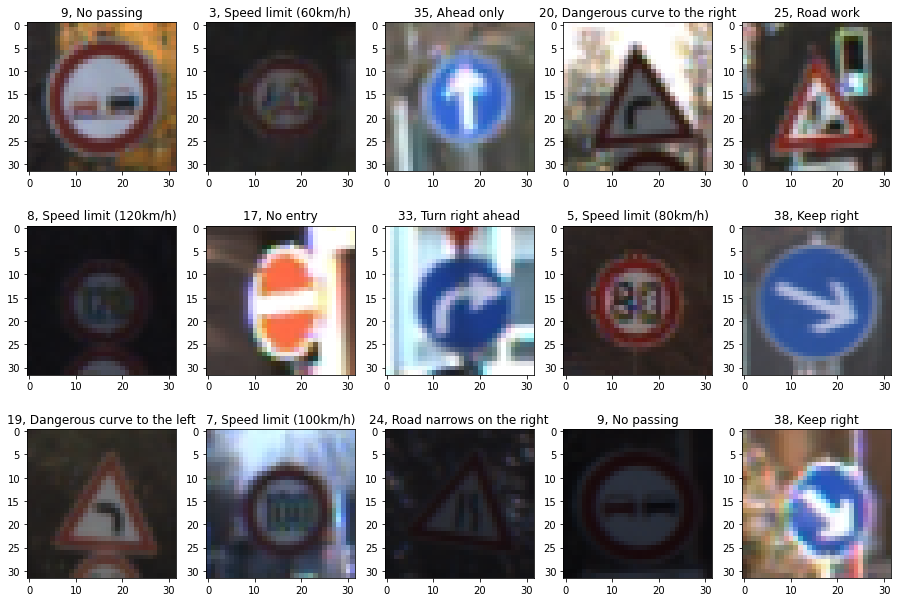

In [ ]:
# Print Random images from validation set

f,ax = plt.subplots(3,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,3,1):

    for j in range(0,5,1):
        rndnum = randint(0,valid_images.shape[0]-1)
        picture = valid_images[rndnum]
        ax[i,j].imshow(picture)
        ax[i,j].set_title(str(valid_labels[rndnum]) + ', ' + labels['SignName'][valid_labels[rndnum]])


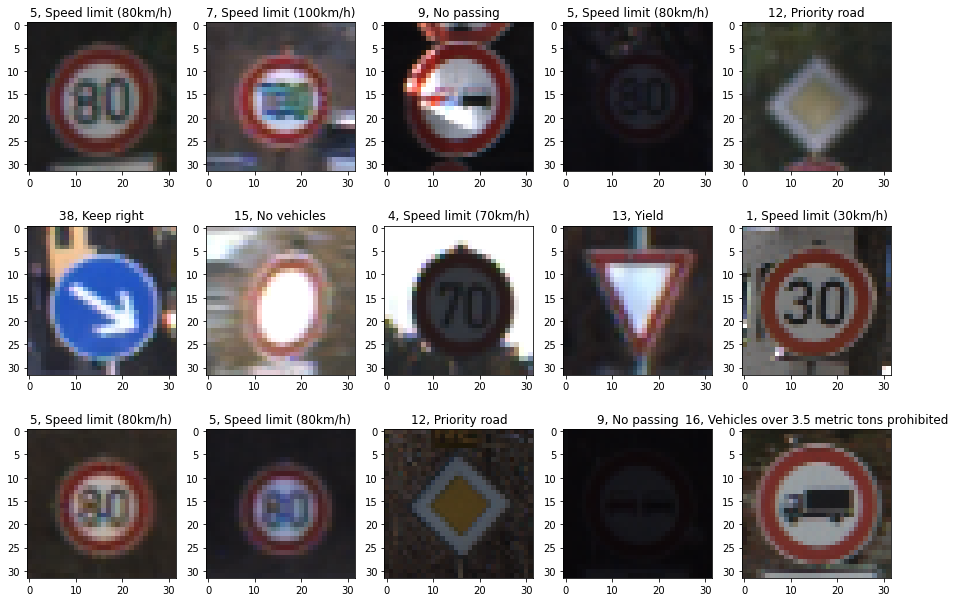

In [ ]:
# Print Random images from test set

f,ax = plt.subplots(3,5) 
f.subplots_adjust(0,0,2,2)

for i in range(0,3,1):

    for j in range(0,5,1):
        rndnum = randint(0,test_images.shape[0]-1)
        picture = test_images[rndnum]
        ax[i,j].imshow(picture)
        ax[i,j].set_title(str(test_labels[rndnum]) + ', ' + labels['SignName'][test_labels[rndnum]])


### Preprocessing

In [ ]:
# This cell defines functions used for preprocessing, taken from the dataset
# Some functions were modified

def cal_mean_std(d,colour,arg):
    # Preparing 'mean image'
    # Subtracting the dataset by 'mean image' serves to center the data
    # We CALCULATE 'mean image' ONLY FROM TRAINING dataset
    mean_image = np.mean(d, axis=0)  # numpy.ndarray (3, 32, 32)

    # Saving calculated 'mean_image' into 'pickle' file
    # We will use it when preprocess input data for classifying
    dictionary = {'mean_image_' + colour: mean_image}
    with open(DATA_DIR + 'mean_image_' + arg + '_' + colour + '.pickle', 'wb') as f_mean_image:
        pickle.dump(dictionary, f_mean_image)

    # Preparing 'std image'
    std = np.std(d, axis=0)  # numpy.ndarray (3, 32, 32)
    # Saving calculated 'std' into 'pickle' file
    # We will use it when preprocess input data for classifying
    dictionary = {'std_' + colour: std}
    with open(DATA_DIR + 'std_' + arg + '_' + colour + '.pickle', 'wb') as f_std:
        pickle.dump(dictionary, f_std)


# Defining function for preprocessing loaded data
def preprocess_data(d, lhe=False, norm_255=False, find_mean_std=False, mean_norm=False, std_norm=False,
                    transpose=False, colour='rgb', arg=''):

    # Applying Local Histogram Equalization
    if lhe:
        # Function map applies first argument to all elements of the second argument
        # First argument in our case is a function
        # Second argument in our case is np array
        # We need to slice it in order to pass into the function only (32, 32) and not (1, 32, 32)
        # Also, map functions applies to first argument all images of the second argument
        # In our case it is a number of d['x_train'].shape[0]
        # Result we wrap with list and then list convert to np.array
        # And reshaping it to make it again 4D tensor

        d = list(map(local_histogram_equalization, d[:, 0, :, :].astype(np.uint8)))
        d = np.array(d)
        d = d.reshape(d.shape[0], 1, 32, 32)
        d = d.astype(np.float32)

    # Applying /255.0 Normalization
    if norm_255:
        # Normalizing whole data by dividing /255.0
        d = d.astype(np.float32) / 255.0

    if find_mean_std:
        cal_mean_std(d,colour,arg)

    # Applying Mean Normalization
    if mean_norm:
        # Normalizing data by subtracting with 'mean image'
        # Getting saved data for 'mean image'
        # Opening file for reading in binary mode
        with open(DATA_DIR + 'mean_image_' + arg + '_' + colour + '.pickle', 'rb') as f:
            mean_image = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3
        # d = d.astype(np.float32)
        d -= mean_image['mean_image_' + colour]
        # d = d.astype(np.unit8)

    # Applying STD Normalization
    if std_norm:
        # Normalizing data by dividing with 'standard deviation'
        # Getting saved data for 'std image'
        # Opening file for reading in binary mode
        with open(DATA_DIR + 'std_' + arg + '_' + colour + '.pickle', 'rb') as f:
            std = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3

        # Don't forget to change names for mean and std files when preprocessing for grayscale purposes
        # d = d.astype(np.float32)
        d /= std['std_' + colour]
        # d.astype(np.unit8)

    # WARNING!
    # Do not make transpose starting from data1
    # As data0 was already transposed
    if transpose:
        # Transposing every dataset to make channels come first
        d = d.transpose(0, 3, 1, 2)  # (86989, 3, 32, 32)

    # Returning preprocessed data
    return d


The three cells below were only used to test the preprocessing function defined above.

Image size from dataset
(86430, 32, 32, 3)
(4410, 32, 32, 3)
(12630, 32, 32, 3)

Label: 24, Road narrows on the right


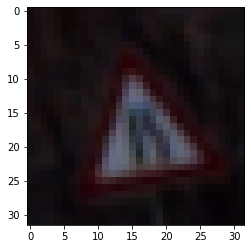

In [ ]:
# Testing preprocessing function

# train_images = preprocess_data(preprocess_data(train_images, transpose='True'), transpose='True')
valid_images = preprocess_data(valid_images, norm_255=True)
test_images = preprocess_data(test_images, norm_255=True)
print('Image size from dataset')
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)

print('\nLabel: ' + str(train_labels[1000]) + ', ' + labels['SignName'][train_labels[1000]])
plt.imshow(train_images[1000])


Image size from dataset
(86989, 3, 32, 32)
(4410, 3, 32, 32)
(12630, 3, 32, 32)
Modified image from dataset
(86989, 32, 32, 3)
(4410, 32, 32, 3)
(12630, 32, 32, 3)

Label: 9, No passing


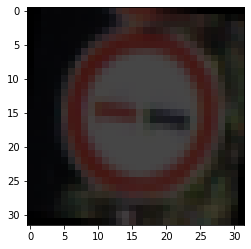

In [ ]:
# Testing preprocessing function

# data = pickle.load(open(DATA_DIR + 'data0.pickle', 'rb'))
# train_images = data['x_train']
print('Image size from dataset')
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)
# train_images = preprocess_data(preprocess_data(train_images, transpose='True'), transpose='True')
valid_images = preprocess_data(preprocess_data(valid_images, transpose='True'), transpose='True')
test_images = preprocess_data(preprocess_data(test_images, transpose='True'), transpose='True')
print('Modified image from dataset')
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)

print('\nLabel: ' + str(train_labels[1000]) + ', ' + labels['SignName'][train_labels[1000]])
plt.imshow(train_images[1000])


In [ ]:
# Testing preprocessing function
temp = preprocess_data(train_images, transpose=True)
temp.shape

(86989, 3, 32, 32)

### Data Augmentation

This section is divided in two parts. 
* The first part compares different data augmentation methods.
* The second part applies those augments to perform histogram equalization and stores the new image set in the dataset.

The first few cells below loads unaugmented train set, plots histogram distribution pre-augmentation, and prints images with bounding boxes to check if cropping is required.

In [ ]:
# Loading images from dataset 1


train = pickle.load(open(DATA_DIR + 'train.pickle', 'rb'))
valid = pickle.load(open(DATA_DIR + 'valid.pickle', 'rb'))
test = pickle.load(open(DATA_DIR + 'test.pickle', 'rb'))
# labels = pickle.load(open(DATA_DIR + 'labels.pickle', 'rb'))
labels = pd.read_csv(DATA_DIR + 'label_names.csv')

# Extract image and label sets
train_images = train['features']
train_labels = train['labels']
valid_images = valid['features']
valid_labels = valid['labels']
test_images = test['features']
test_labels = test['labels']

train_coords = train['coords']
train_size = train['sizes']

# Shuffle
# train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
valid_images ,valid_labels = shuffle(valid_images, valid_labels, random_state=147865452)
test_images ,test_labels = shuffle(test_images, test_labels, random_state=147865452)


In [ ]:
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)

(34799, 32, 32, 3)
(4410, 32, 32, 3)
(12630, 32, 32, 3)


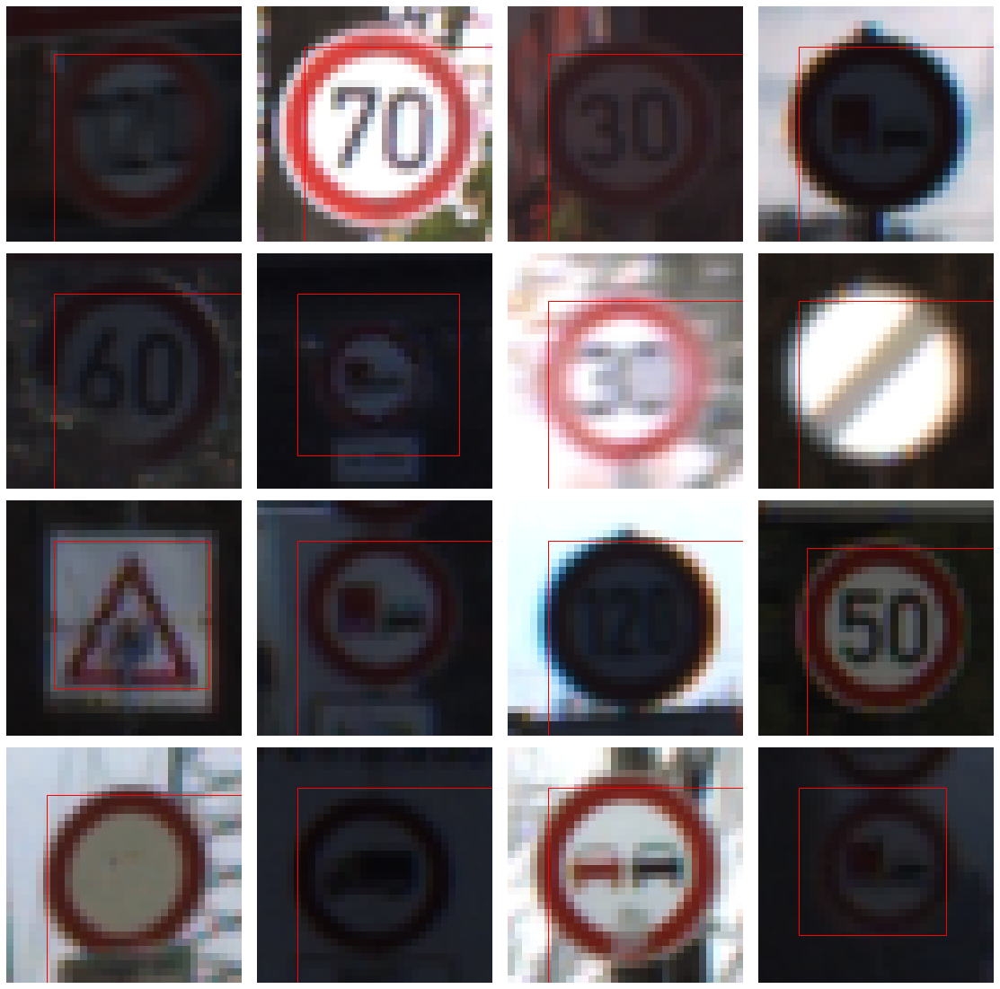

In [ ]:
# Plotting 16 random train set with bounding boxes

import matplotlib.patches as patches
def bbox_to_rect(bbox, color):
    """Convert bounding box to matplotlib format."""
    # Convert the bounding box (top-left x, top-left y, bottom-right x,
    # bottom-right y) format to matplotlib format: ((upper-left x,
    # upper-left y), width, height)

    # Getting current bounding box coordinates, its width and height
    # x_center, y_center = int(float(bbox[1]) * w), int(float(bbox[2]) * h)
    # box_width, box_height = int(float(bbox[3]) * w), int(float(bbox[4]) * h)

    # Now, from YOLO data format, we can get top left corner coordinates
    # that are x_min and y_min
    x_min = bbox[1]
    y_min = bbox[2]

    return patches.Rectangle(xy=(x_min, y_min), width=bbox[3]-bbox[1], height=bbox[4]-bbox[2],
        fill=False, edgecolor=color, linewidth=1)


h, w = train_images.shape[1:3]
num = randint(0,train_images.shape[0]-1)

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(4, 4)
gs1.update(wspace=0.001, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(16):
    # i = i + 1 # grid spec indexes from 0

    num = randint(0,train_images.shape[0]-1)
    ax1 = plt.subplot(gs1[i])
    ax1.imshow(train_images[num])
    bbox = np.array([0, train_coords[num][0], train_coords[num][1], train_coords[num][2], train_coords[num][3]])
    # rect = bbox_to_rect(bboxes[0],'r')
    # plt.gca().add_patch(rect)

    # if np.atleast_2d(bboxes[num]).shape[0] == 1:
    rect = bbox_to_rect(bbox,'r')
    ax1.add_patch(rect)

    plt.axis('off')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')


The images above indicate that no cropping is required since the images only contain the traffic signs and the bounding boxes provided cut through the signs sometimes.

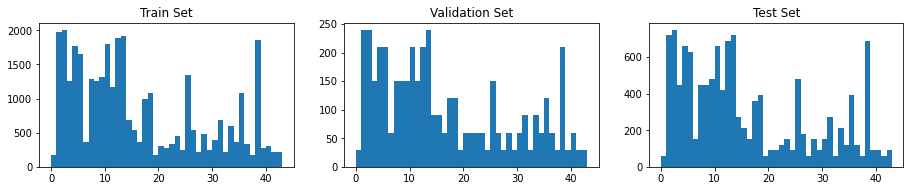

In [ ]:
# Printing Distribution of dataset

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(train_labels, bins) 
ax[0].set_title('Train Set')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass



In [ ]:
# Find number of datapoints for each label with start and end indices

num = 1
train_labels.tolist().index(num)
indices = np.where(train_labels==num)
print('Number of datapoints with class 1: ' + str(np.size(indices,axis=1)))
print('Starting from index ' + str(train_labels.tolist().index(num)) + ' to ' + str(train_labels.tolist().index(num) + np.size(indices,axis=1)))

# Max number of data points for any label
maxSize = 0
for num in range(0,43,1):
    if maxSize < np.size(np.where(train_labels==num),axis=1):
        maxSize = np.size(np.where(train_labels==num),axis=1)
        maxNum = num
print('Max number of datapoints (' + str(maxSize) + ') in class ' + str(maxNum))

Number of datapoints with class 1: 1980
Starting from index 2220 to 4200
Max number of datapoints (2010) in class 2


#### Part 1: Comparision of Augments

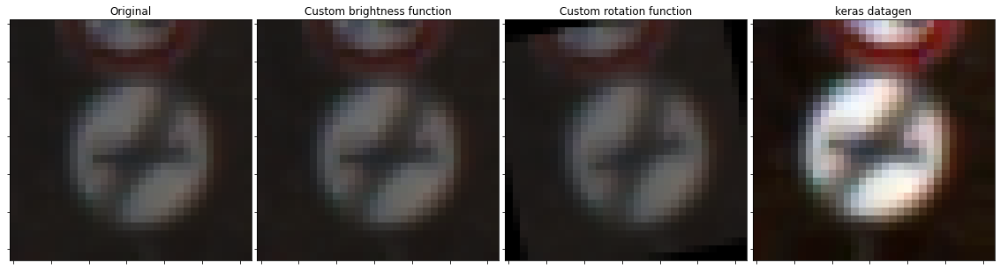

In [ ]:
# Comparing custom data augmentation functions with keras functions




import matplotlib.gridspec as gridspec

imgIndex = 0
samples = expand_dims(train_images[imgIndex], 0)
datagen = ImageDataGenerator(rotation_range=15,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2)
it = datagen.flow(samples, batch_size=1)
batch = it.next()


imageList = [train_images[imgIndex],
             brightness_changing(train_images[imgIndex]),
             rotation_changing(train_images[imgIndex]),
             batch[0].astype('uint8')]
labelList = ['Original',
             'Custom brightness function',
             'Custom rotation function',
             'keras datagen']

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(1, 4)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(4):
   # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    picture = imageList[index]
    ax1.imshow(picture)
    ax1.set_title(labelList[index])
    index += 1
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')

plt.show()

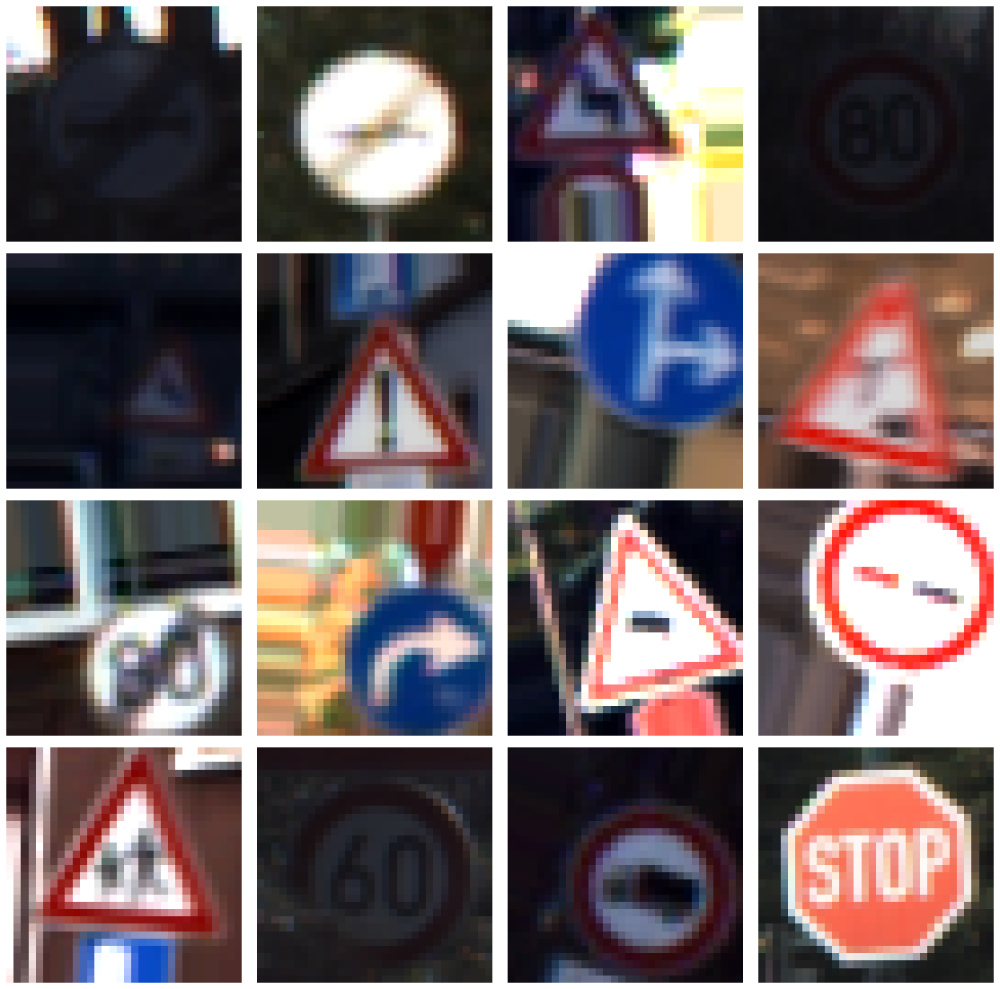

In [ ]:
# Plotting train set augmented by keras with nearest fill



import matplotlib.gridspec as gridspec

h, w = train_images.shape[1:3]
num = randint(0,train_images.shape[0]-1)

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(4, 4)
gs1.update(wspace=0.001, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(16):
    # i = i + 1 # grid spec indexes from 0

    num = randint(0,train_images.shape[0]-1)
    ax1 = plt.subplot(gs1[i])
    ax1.imshow(train_images[num])
    plt.axis('off')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
plt.show()

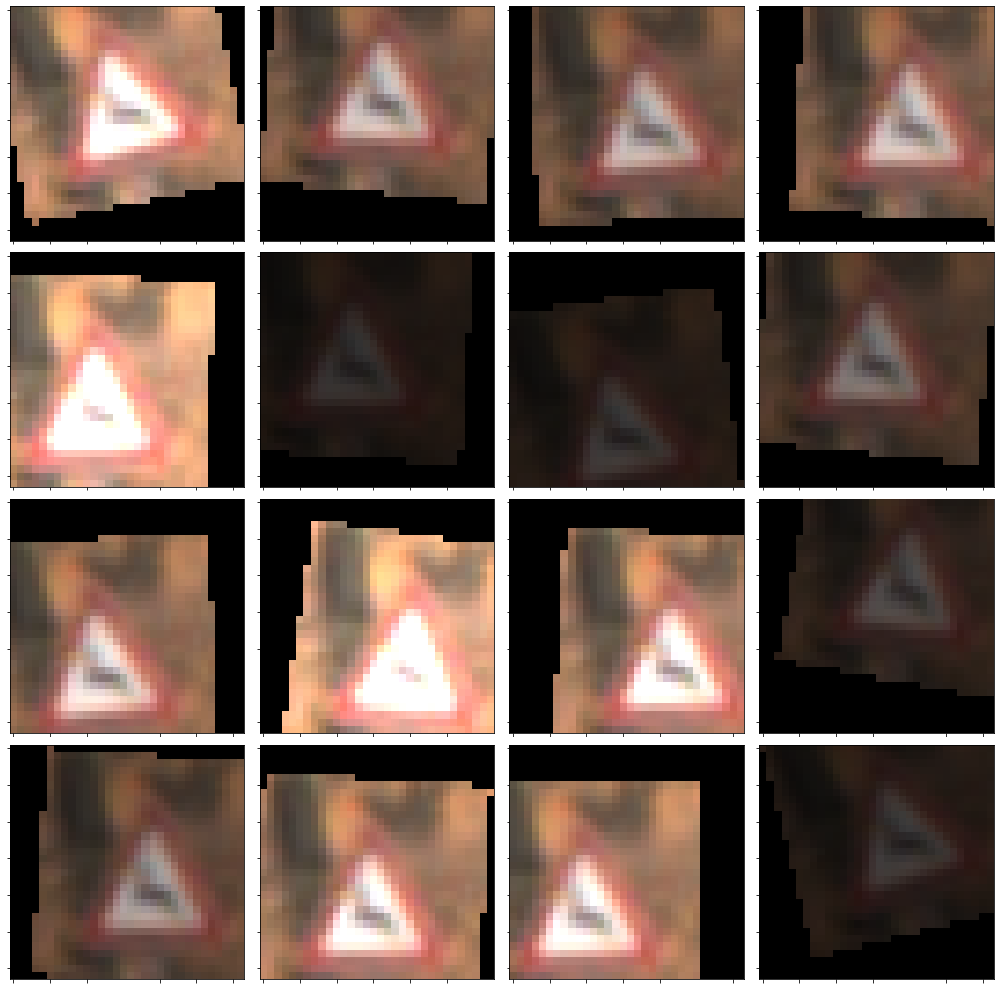

In [ ]:
# Plotting random combinations of augmented image with keras with zero fill

import matplotlib.gridspec as gridspec

imgIndex = 300
samples = expand_dims(train_images[imgIndex], 0)
datagen = ImageDataGenerator(rotation_range=15,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2, fill_mode='constant', cval=0)
it = datagen.flow(samples, batch_size=1)
batch = it.next()

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(4, 4)
gs1.update(wspace=0.001, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(16):
    # i = i + 1 # grid spec indexes from 0
    batch = it.next()
    ax1 = plt.subplot(gs1[i])
    picture = batch[0].astype('uint8')
    ax1.imshow(picture)
    index += 1
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')

plt.show()

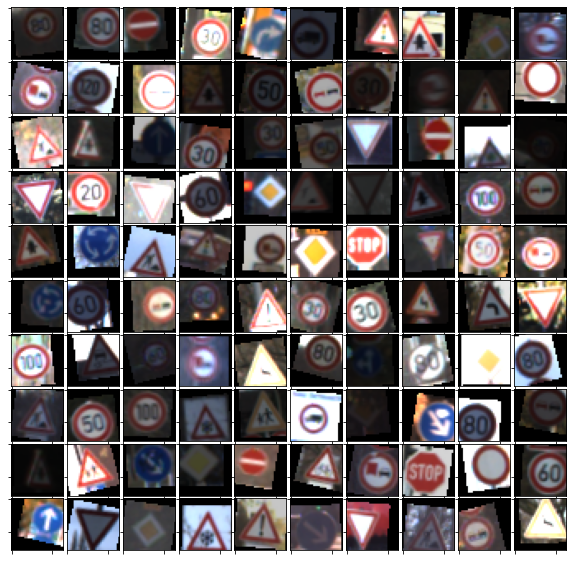

In [ ]:
# Randomly augmenting 100 images with keras with zero fill and visualizing



import matplotlib.gridspec as gridspec

imgIndex = 0
# samples = expand_dims(train_images[imgIndex], 0)
samples = train_images
datagen = ImageDataGenerator(rotation_range=15,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2, fill_mode='constant', cval=0)
it = datagen.flow(samples, batch_size=1)
batch = it.next()

plt.figure(figsize = (10,10))
gs1 = gridspec.GridSpec(10, 10)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(100):
    # i = i + 1 # grid spec indexes from 0
    batch = it.next()
    ax1 = plt.subplot(gs1[i])
    picture = batch[0].astype('uint8')
    ax1.imshow(picture)
    index += 1
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')

plt.show()

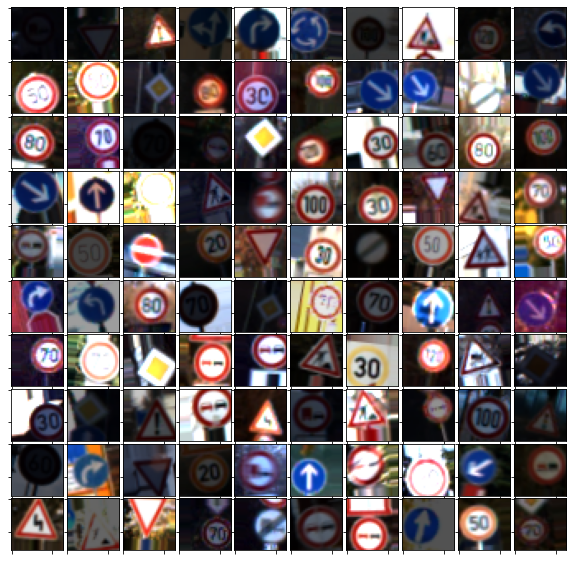

In [ ]:
# Randomly augmenting 100 images with keras with nearest fill and visualizing




import matplotlib.gridspec as gridspec

imgIndex = 0
# samples = expand_dims(train_images[imgIndex], 0)
samples = train_images
datagen = ImageDataGenerator(rotation_range=15,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2)
it = datagen.flow(samples, batch_size=1)
batch = it.next()

plt.figure(figsize = (10,10))
gs1 = gridspec.GridSpec(10, 10)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(100):
    # i = i + 1 # grid spec indexes from 0
    batch = it.next()
    ax1 = plt.subplot(gs1[i])
    picture = batch[0].astype('uint8')
    ax1.imshow(picture)
    index += 1
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')

plt.show()

Based on the augments tested above applying augments with zero fill results in sharp zero edges in the augmented images. This could potentially throw the model off as it may not be able to differentiate between which edges are important and which are not.

Also, its better to avoid horizonal shift and vertical shift augments since when using nearest fill they end up adding curves or edges that should habe not been there. For instance, in the image shown below (taken from the last cell above); nearest fill adds almost a second complete circular sign that should not be there.

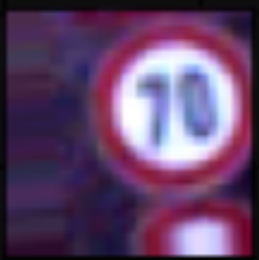

Horizontal and Vertical flip augments were avoided since most traffic signs indicate a direction.

#### Part 2: Augments

A set of 6 augments were made and saved for testing. The table below defines each augment. These augments were then tested on a LeNet CNN.

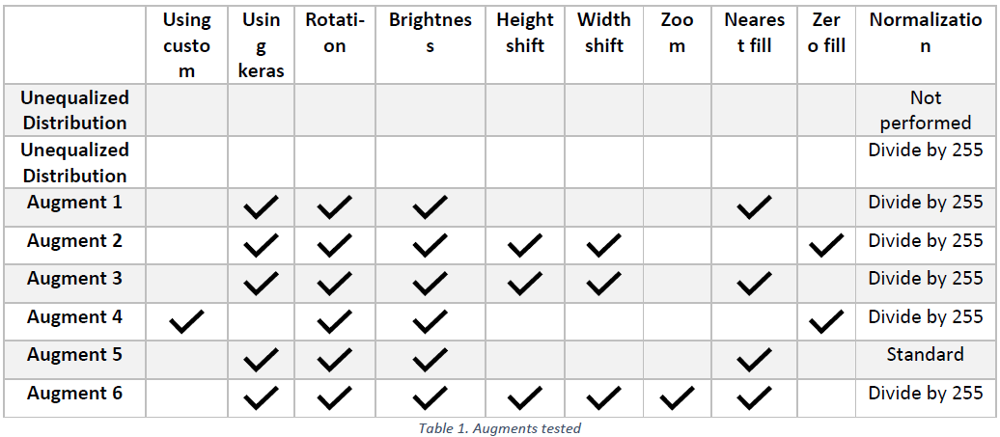

The six sub-sections below create and save augmented train set.

##### Augment 1

In [ ]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

# create image data augmentation generator
datagen = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

# Create augmented images
imageGen = []
labelGen = []
for num in range(0,43,1):
    if np.size(np.where(train_labels==num),axis=1) < maxSize:
        print('[INFO] Augementing images for label: ' + '[' + str(num) + '] ' + labels['SignName'][num])
        indices = np.where(train_labels==num)
        # train_labels[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]

        # Prepare data to sample
        data = train_images[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]
        samples = data
        # prepare iterator
        it = datagen.flow(samples, batch_size=1)
        # generate batch of images

        count = 0
        # Generate images to equilize histogram
        for epoch in range(maxSize - np.size(np.where(train_labels==num),axis=1)):
            count += 1
            batch = it.next()
            imageGen.append(np.squeeze(batch.astype('uint8')))
            labelGen.append(num)

        print('[INFO] Generated ' + str(count) + ' images')

imageGen = np.array(imageGen)
labelGen = np.array(labelGen)

[INFO] Augementing images for label: [0] Speed limit (20km/h)
[INFO] Generated 1830 images
[INFO] Augementing images for label: [1] Speed limit (30km/h)
[INFO] Generated 30 images
[INFO] Augementing images for label: [3] Speed limit (60km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [4] Speed limit (70km/h)
[INFO] Generated 240 images
[INFO] Augementing images for label: [5] Speed limit (80km/h)
[INFO] Generated 360 images
[INFO] Augementing images for label: [6] End of speed limit (80km/h)
[INFO] Generated 1650 images
[INFO] Augementing images for label: [7] Speed limit (100km/h)
[INFO] Generated 720 images
[INFO] Augementing images for label: [8] Speed limit (120km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [9] No passing
[INFO] Generated 690 images
[INFO] Augementing images for label: [10] No passing for vehicles over 3.5 metric tons
[INFO] Generated 210 images
[INFO] Augementing images for label: [11] Right-of-way at the next intersec

In [ ]:
X = train_images
X = np.concatenate((X,imageGen), axis=0)
print('Shape of train image set : ' + str(X.shape))

y = train_labels
y = np.concatenate((y,labelGen))
print('Shape of train lebel set : ' + str(y.shape))

Shape of train image set : (86430, 32, 32, 3)
Shape of train lebel set : (86430,)


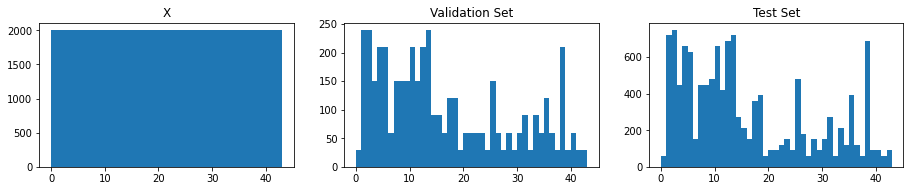

In [ ]:
# Printing Distribution

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass


In [ ]:
from sklearn.utils import shuffle
import pickle

# Normalize and shuffle data
X = preprocess_data(X, norm_255=True)
X, y = shuffle(X, y, random_state=147865452)

# Save augmented data
dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_1.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

##### Augment 2

In [ ]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

# create image data augmentation generator
datagen = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2, fill_mode='constant', cval=0)

# Create augmented images
imageGen = []
labelGen = []
for num in range(0,43,1):
    if np.size(np.where(train_labels==num),axis=1) < maxSize:
        print('[INFO] Augementing images for label: ' + '[' + str(num) + '] ' + labels['SignName'][num])
        indices = np.where(train_labels==num)
        # train_labels[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]

        # Prepare data to sample
        data = train_images[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]
        samples = data
        # prepare iterator
        it = datagen.flow(samples, batch_size=1)
        # generate batch of images

        count = 0

        # Generate images to equilize histogram
        for epoch in range(maxSize - np.size(np.where(train_labels==num),axis=1)):
            count += 1
            batch = it.next()
            imageGen.append(np.squeeze(batch.astype('uint8')))
            labelGen.append(num)

        print('[INFO] Generated ' + str(count) + ' images')

imageGen = np.array(imageGen)
labelGen = np.array(labelGen)

[INFO] Augementing images for label: [0] Speed limit (20km/h)
[INFO] Generated 1830 images
[INFO] Augementing images for label: [1] Speed limit (30km/h)
[INFO] Generated 30 images
[INFO] Augementing images for label: [3] Speed limit (60km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [4] Speed limit (70km/h)
[INFO] Generated 240 images
[INFO] Augementing images for label: [5] Speed limit (80km/h)
[INFO] Generated 360 images
[INFO] Augementing images for label: [6] End of speed limit (80km/h)
[INFO] Generated 1650 images
[INFO] Augementing images for label: [7] Speed limit (100km/h)
[INFO] Generated 720 images
[INFO] Augementing images for label: [8] Speed limit (120km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [9] No passing
[INFO] Generated 690 images
[INFO] Augementing images for label: [10] No passing for vehicles over 3.5 metric tons
[INFO] Generated 210 images
[INFO] Augementing images for label: [11] Right-of-way at the next intersec

Shape of train image set : (86430, 32, 32, 3)
Shape of train lebel set : (86430,)


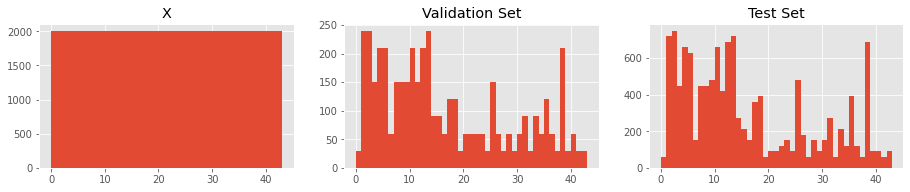

In [ ]:
from sklearn.utils import shuffle
import pickle

X = train_images
X = np.concatenate((X,imageGen), axis=0)
print('Shape of train image set : ' + str(X.shape))

y = train_labels
y = np.concatenate((y,labelGen))
print('Shape of train lebel set : ' + str(y.shape))

# Printing Distribution

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass

# Normalize and shuffle data
X = preprocess_data(X, norm_255=True)
X, y = shuffle(X, y, random_state=147865452)

dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_2.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

##### Augment 3

In [ ]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

# create image data augmentation generator
datagen = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8], height_shift_range=0.2, width_shift_range=0.2)

# Create augmented images
imageGen = []
labelGen = []
for num in range(0,43,1):
    if np.size(np.where(train_labels==num),axis=1) < maxSize:
        print('[INFO] Augementing images for label: ' + '[' + str(num) + '] ' + labels['SignName'][num])
        indices = np.where(train_labels==num)
        # train_labels[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]

        # Prepare data to sample
        data = train_images[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]
        samples = data
        # prepare iterator
        it = datagen.flow(samples, batch_size=1)
        # generate batch of images

        count = 0

        # Generate images to equilize histogram
        for epoch in range(maxSize - np.size(np.where(train_labels==num),axis=1)):
            count += 1
            batch = it.next()
            imageGen.append(np.squeeze(batch.astype('uint8')))
            labelGen.append(num)

        print('[INFO] Generated ' + str(count) + ' images')

imageGen = np.array(imageGen)
labelGen = np.array(labelGen)

[INFO] Augementing images for label: [0] Speed limit (20km/h)
[INFO] Generated 1830 images
[INFO] Augementing images for label: [1] Speed limit (30km/h)
[INFO] Generated 30 images
[INFO] Augementing images for label: [3] Speed limit (60km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [4] Speed limit (70km/h)
[INFO] Generated 240 images
[INFO] Augementing images for label: [5] Speed limit (80km/h)
[INFO] Generated 360 images
[INFO] Augementing images for label: [6] End of speed limit (80km/h)
[INFO] Generated 1650 images
[INFO] Augementing images for label: [7] Speed limit (100km/h)
[INFO] Generated 720 images
[INFO] Augementing images for label: [8] Speed limit (120km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [9] No passing
[INFO] Generated 690 images
[INFO] Augementing images for label: [10] No passing for vehicles over 3.5 metric tons
[INFO] Generated 210 images
[INFO] Augementing images for label: [11] Right-of-way at the next intersec

In [ ]:
X = train_images
X = np.concatenate((X,imageGen), axis=0)
print('Shape of train image set : ' + str(X.shape))

y = train_labels
y = np.concatenate((y,labelGen))
print('Shape of train lebel set : ' + str(y.shape))

Shape of train image set : (86430, 32, 32, 3)
Shape of train lebel set : (86430,)


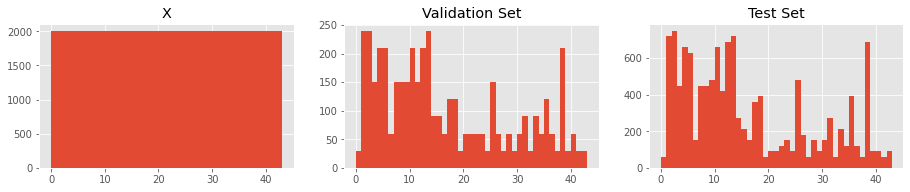

In [ ]:
from sklearn.utils import shuffle
import pickle

# Printing Distribution

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass

# Normalize and shuffle data
X = preprocess_data(X, norm_255=True)
X, y = shuffle(X, y, random_state=147865452)

dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_3.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

##### Augment 4

In [ ]:
from tqdm import tqdm

# Custom functions for changing brightness and image rotation

# Defining function for changing brightness
def brightness_changing(image):
    # Converting firstly image from RGB to HSV
    image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # Defining random value for changing brightness
    random_brightness = 0.25 + np.random.uniform()
    # Implementing changing of Value channel of HSV image
    image_hsv[:, :, 2] = image_hsv[:, :, 2] * random_brightness
    # Converting HSV changed image to RGB
    image_rgb = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
    # Returning image with changed brightness
    return image_rgb

# Defining function for changing rotation of image
def rotation_changing(image):
    # Defining angle range
    angle_range = 25
    # Defining angle rotation
    angle_rotation = np.random.uniform(angle_range) - angle_range / 2
    # Getting shape of image
    rows, columns, channels = image.shape
    # Implementing rotation
    # Calculating Affine Matrix
    affine_matrix = cv2.getRotationMatrix2D((columns / 2, rows / 2), angle_rotation, 1)
    # Warping original image with Affine Matrix
    rotated_image = cv2.warpAffine(image, affine_matrix, (columns, rows))
    # Returning rotated image
    return rotated_image

# Defining function for transformation: brightness + rotation
def transformation_brightness_rotation(image):
    return brightness_changing(rotation_changing(image))

# Defining function for equalization training dataset
def equalize_training_dataset(x_train, y_train):
    # Getting number of examples for every label
    number_of_examples_for_every_label = np.bincount(y_train)
    # Calculating total amount of unique labels
    number_of_labels = np.arange(len(number_of_examples_for_every_label))

    # Iterating over all number of labels
    # Showing progress ber with 'tqdm'
    for i in tqdm(number_of_labels):
        # Calculating how many examples is needed to add for current label
        # 'np.mean(number_of_examples_for_every_label)' - average number over examples for every label
        number_of_examples_to_add = int(np.mean(number_of_examples_for_every_label) * 2.5) - \
                                    number_of_examples_for_every_label[i]

        # Defining temporary arrays for collecting new images
        x_temp = []
        y_temp = []

        # Getting random image from current label
        # Transforming it and adding to the temporary arrays
        for j in range(number_of_examples_to_add):
            getting_random_image = random_image(x_train, y_train, i)
            x_temp.append(transformation_brightness_rotation(getting_random_image))
            y_temp.append(i)

        x_train = np.append(x_train, np.array(x_temp), axis=0)
        y_train = np.append(y_train, np.array(y_temp), axis=0)

    return x_train, y_train

# Defining function for getting random image of one label
def random_image(x_train, y_train, y_number):
    # Getting indexes of needed 'y_number' from 'y_train'
    # Defining True - False array
    image_indexes = np.where(y_train == y_number)
    # Getting random index of needed label
    # 'np.bincount(y_train)' - array with number of examples for every label
    # 'np.bincount(y_train)[y_number] - 1' - number of examples for 'y_number' label
    random_index = np.random.randint(0, np.bincount(y_train)[y_number] - 1)
    # Returning random image from 'x_train'
    # 'x_train[image_indexes]' - returns array with only 'y_number' label
    # 'x_train[image_indexes][random_index]' - random image of needed label
    return x_train[image_indexes][random_index]

100%|██████████| 43/43 [00:33<00:00,  1.27it/s]


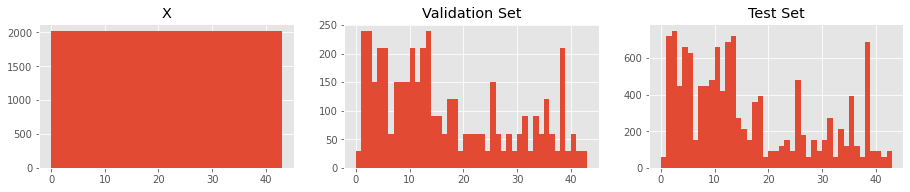

In [ ]:
from sklearn.utils import shuffle
import pickle

# Equilize distribution
X, y = equalize_training_dataset(train_images,train_labels)

# Printing Distribution
import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets
f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass

# Normalize and shuffle data
X = preprocess_data(X, norm_255=True)
X, y = shuffle(X, y, random_state=147865452)

dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_4.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

##### Augment 5

In [ ]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

# create image data augmentation generator
datagen = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

# Create augmented images
imageGen = []
labelGen = []
for num in range(0,43,1):
    if np.size(np.where(train_labels==num),axis=1) < maxSize:
        print('[INFO] Augementing images for label: ' + '[' + str(num) + '] ' + labels['SignName'][num])
        indices = np.where(train_labels==num)
        # train_labels[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]

        # Prepare data to sample
        data = train_images[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]
        samples = data
        # prepare iterator
        it = datagen.flow(samples, batch_size=1)
        # generate batch of images

        count = 0

        # Generate images to equilize histogram
        for epoch in range(maxSize - np.size(np.where(train_labels==num),axis=1)):
            count += 1
            batch = it.next()
            imageGen.append(np.squeeze(batch.astype('uint8')))
            labelGen.append(num)

        print('[INFO] Generated ' + str(count) + ' images')

imageGen = np.array(imageGen)
labelGen = np.array(labelGen)

[INFO] Augementing images for label: [0] Speed limit (20km/h)
[INFO] Generated 1830 images
[INFO] Augementing images for label: [1] Speed limit (30km/h)
[INFO] Generated 30 images
[INFO] Augementing images for label: [3] Speed limit (60km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [4] Speed limit (70km/h)
[INFO] Generated 240 images
[INFO] Augementing images for label: [5] Speed limit (80km/h)
[INFO] Generated 360 images
[INFO] Augementing images for label: [6] End of speed limit (80km/h)
[INFO] Generated 1650 images
[INFO] Augementing images for label: [7] Speed limit (100km/h)
[INFO] Generated 720 images
[INFO] Augementing images for label: [8] Speed limit (120km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [9] No passing
[INFO] Generated 690 images
[INFO] Augementing images for label: [10] No passing for vehicles over 3.5 metric tons
[INFO] Generated 210 images
[INFO] Augementing images for label: [11] Right-of-way at the next intersec

In [ ]:
X = train_images
X = np.concatenate((X,imageGen), axis=0)
print('Shape of train image set : ' + str(X.shape))

y = train_labels
y = np.concatenate((y,labelGen))
print('Shape of train lebel set : ' + str(y.shape))

Shape of train image set : (86430, 32, 32, 3)
Shape of train lebel set : (86430,)


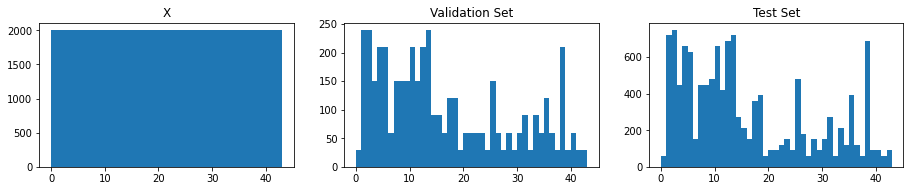

In [ ]:
# Printing Distribution

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass


In [ ]:
X = preprocess_data(X, find_mean_std=True, arg='aug5')

with open(DATA_DIR + 'mean_image_aug5_rgb.pickle', 'rb') as f:
    mean_image = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3

mean_image['mean_image_rgb'].shape


with open(DATA_DIR + 'std_aug5_rgb.pickle', 'rb') as f:
    std = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3
std['std_rgb'].shape


X = X-mean_image['mean_image_rgb']
X = X/std['std_rgb']

In [ ]:
from sklearn.utils import shuffle
import pickle

# Normalize and shuffle data
X, y = shuffle(X, y, random_state=147865452)

# Save augmented data
dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_5.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

##### Augment 6

In [ ]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

# create image data augmentation generator
datagen = ImageDataGenerator(rotation_range=25,brightness_range=[0.2,1.8],zoom_range=0.2, height_shift_range=0.2, width_shift_range=0.2)

# Create augmented images
imageGen = []
labelGen = []
for num in range(0,43,1):
    if np.size(np.where(train_labels==num),axis=1) < maxSize:
        print('[INFO] Augementing images for label: ' + '[' + str(num) + '] ' + labels['SignName'][num])
        indices = np.where(train_labels==num)
        # train_labels[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]

        # Prepare data to sample
        data = train_images[train_labels.tolist().index(num):train_labels.tolist().index(num)+np.size(indices,axis=1)]
        samples = data
        # prepare iterator
        it = datagen.flow(samples, batch_size=1)
        # generate batch of images

        count = 0

        # Generate images to equilize histogram
        for epoch in range(maxSize - np.size(np.where(train_labels==num),axis=1)):
            count += 1
            batch = it.next()
            imageGen.append(np.squeeze(batch.astype('uint8')))
            labelGen.append(num)

        print('[INFO] Generated ' + str(count) + ' images')

imageGen = np.array(imageGen)
labelGen = np.array(labelGen)

[INFO] Augementing images for label: [0] Speed limit (20km/h)
[INFO] Generated 1830 images
[INFO] Augementing images for label: [1] Speed limit (30km/h)
[INFO] Generated 30 images
[INFO] Augementing images for label: [3] Speed limit (60km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [4] Speed limit (70km/h)
[INFO] Generated 240 images
[INFO] Augementing images for label: [5] Speed limit (80km/h)
[INFO] Generated 360 images
[INFO] Augementing images for label: [6] End of speed limit (80km/h)
[INFO] Generated 1650 images
[INFO] Augementing images for label: [7] Speed limit (100km/h)
[INFO] Generated 720 images
[INFO] Augementing images for label: [8] Speed limit (120km/h)
[INFO] Generated 750 images
[INFO] Augementing images for label: [9] No passing
[INFO] Generated 690 images
[INFO] Augementing images for label: [10] No passing for vehicles over 3.5 metric tons
[INFO] Generated 210 images
[INFO] Augementing images for label: [11] Right-of-way at the next intersec

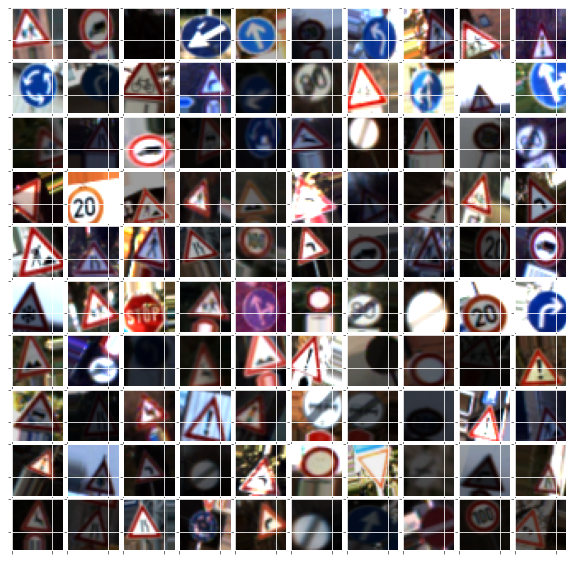

In [ ]:
# Randomly augmenting 100 images with keras with zero fill and visualizing
import matplotlib.gridspec as gridspec

plt.figure(figsize = (10,10))
gs1 = gridspec.GridSpec(10, 10)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

index = 0
for i in range(100):
    # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    num = randint(0,len(imageGen)-1)
    picture = imageGen[num]
    ax1.imshow(picture)
    index += 1
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')

plt.show()

In [ ]:
X = train_images
X = np.concatenate((X,imageGen), axis=0)
print('Shape of train image set : ' + str(X.shape))

y = train_labels
y = np.concatenate((y,labelGen))
print('Shape of train lebel set : ' + str(y.shape))


from sklearn.utils import shuffle
import pickle

# Normalize and shuffle data
X = preprocess_data(X, norm_255=True)
X, y = shuffle(X, y, random_state=147865452)


Shape of train image set : (86430, 32, 32, 3)
Shape of train lebel set : (86430,)


In [ ]:
del train_images
del train_labels

train_images = X
train_labels = y

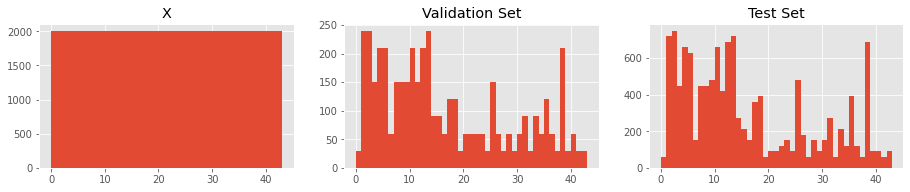

In [ ]:
# Printing Distribution

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(y, bins) 
ax[0].set_title('X')
ax[1].hist(valid_labels, bins) 
ax[1].set_title('Validation Set')
ax[2].hist(test_labels, bins) 
ax[2].set_title('Test Set')
pass


In [ ]:
# Save augmented data
dictionary = {'images': X,
              'labels': y}

with open(DATA_DIR + 'data_aug_6.pickle', 'wb') as handle:
    pickle.dump(dictionary, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Bechmarking Architectures
---

* LeNet
* MiniVGG
* VGG16
* VGG19
* MiniGoogLeNet
* ResNet50
* ResNet101
* DenseNet121
* DenseNet201

All type of augments will be tested on LeNet and then the best performing augmented train set data will be used for training deeper networks.

#### LeNet

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class LeNetReg:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer with 20 5x5 filters and a 2x2 max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer with 50 5x5 filters and a 2x2 max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        model.add(Dropout(0.5))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


##### Testing Augments

The following cells test all the variations of train set that were presented in the table in *Part2: Augments* section

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 2s 10ms/step - loss: 1.9042 - accuracy: 0.6302 - val_loss: 0.7207 - val_accuracy: 0.7955
Epoch 2/20
235/235 [==============================] - 2s 9ms/step - loss: 0.3006 - accuracy: 0.9174 - val_loss: 0.5390 - val_accuracy: 0.8803
Epoch 3/20
235/235 [==============================] - 2s 9ms/step - loss: 0.1545 - accuracy: 0.9582 - val_loss: 0.4452 - val_accuracy: 0.8937
Epoch 4/20
235/235 [==============================] - 2s 9ms/step - loss: 0.1108 - accuracy: 0.9680 - val_loss: 0.4969 - val_accuracy: 0.8875
Epoch 5/20
235/235 [==============================] - 2s 9ms/step - loss: 0.0985 - accuracy: 0.9719 - val_loss: 0.5273 - val_accuracy: 0.8909
Epoch 6/20
235/235 [==============================] - 2s 9ms/step - loss: 0.0873 - accuracy: 0.9751 - val_loss: 0.4510 - val_accuracy: 0.9136
Epoch 7/20
235/235 [==============================] - 2s 9ms/step - loss: 0.0813 - accuracy: 0.9773 - val_loss: 0.4857 -

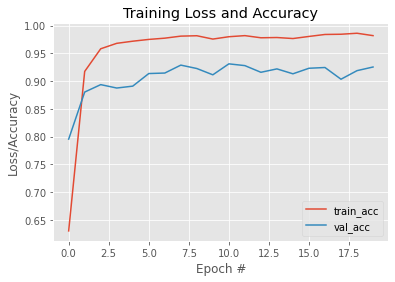

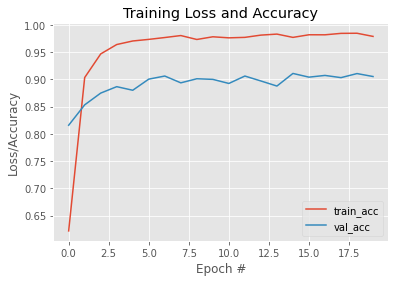

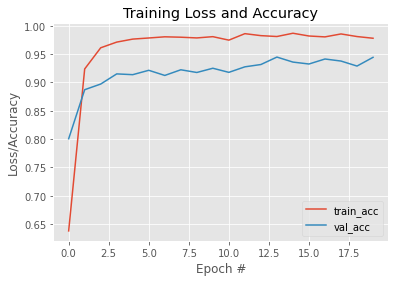

In [ ]:
# 1) With unequalized train data, unnormalized data

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 11ms/step - loss: 1.5886 - accuracy: 0.5504 - val_loss: 0.5924 - val_accuracy: 0.8247
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 0.2830 - accuracy: 0.9142 - val_loss: 0.4119 - val_accuracy: 0.8626
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1203 - accuracy: 0.9643 - val_loss: 0.2930 - val_accuracy: 0.9054
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0688 - accuracy: 0.9801 - val_loss: 0.2482 - val_accuracy: 0.9263
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0472 - accuracy: 0.9871 - val_loss: 0.2761 - val_accuracy: 0.9367
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0339 - accuracy: 0.9908 - val_loss: 0.2534 - val_accuracy: 0.9342
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0268 - accuracy: 0.9923 - val_loss: 0.

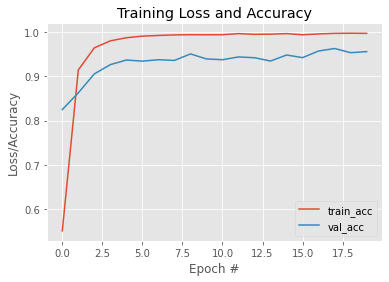

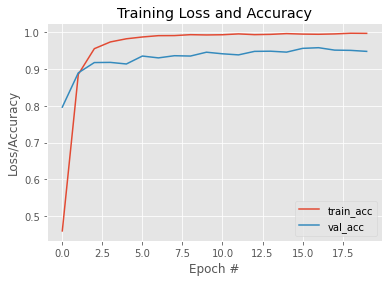

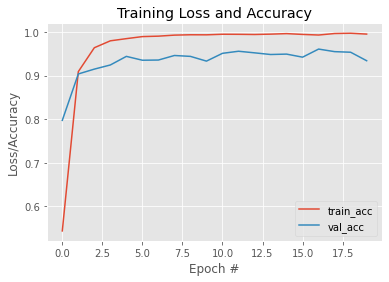

In [ ]:
# 2) With unequalized train data scaled

train_images = preprocess_data(train_images,norm_255=True)
valid_images = preprocess_data(valid_images,norm_255=True)
test_images = preprocess_data(test_images,norm_255=True)

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 11ms/step - loss: 1.6725 - accuracy: 0.5282 - val_loss: 0.7361 - val_accuracy: 0.7798
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 0.3232 - accuracy: 0.8995 - val_loss: 0.4861 - val_accuracy: 0.8671
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1441 - accuracy: 0.9572 - val_loss: 0.4434 - val_accuracy: 0.8925
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0870 - accuracy: 0.9734 - val_loss: 0.4140 - val_accuracy: 0.9120
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0660 - accuracy: 0.9806 - val_loss: 0.3535 - val_accuracy: 0.9095
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0431 - accuracy: 0.9870 - val_loss: 0.3239 - val_accuracy: 0.9295
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0360 - accuracy: 0.9892 - val_loss: 0.

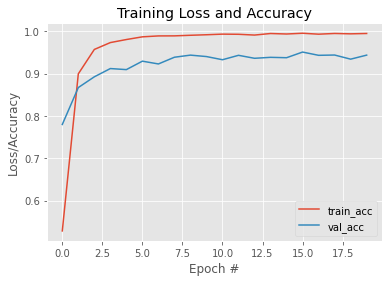

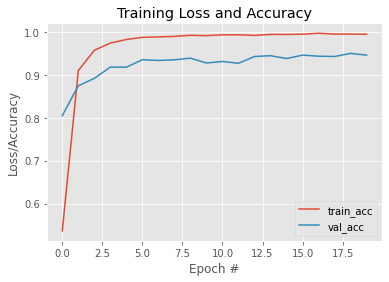

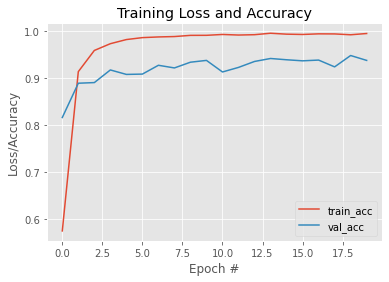

In [ ]:
# 3) With equalized train data with keras (rot, brightness, nearest fill)


data = pickle.load(open(DATA_DIR + 'data_aug_1.pickle', 'rb'))
train_images = data['images']
train_labels = data['labels']

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 11ms/step - loss: 2.5701 - accuracy: 0.2555 - val_loss: 1.3721 - val_accuracy: 0.5746
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 1.1416 - accuracy: 0.6362 - val_loss: 0.7349 - val_accuracy: 0.7780
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.5672 - accuracy: 0.8209 - val_loss: 0.5823 - val_accuracy: 0.8190
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.3243 - accuracy: 0.8960 - val_loss: 0.4992 - val_accuracy: 0.8669
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.2023 - accuracy: 0.9382 - val_loss: 0.4823 - val_accuracy: 0.8812
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1429 - accuracy: 0.9548 - val_loss: 0.4306 - val_accuracy: 0.9002
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1081 - accuracy: 0.9665 - val_loss: 0.

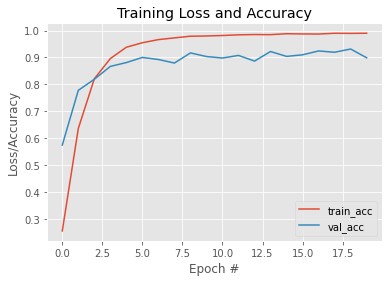

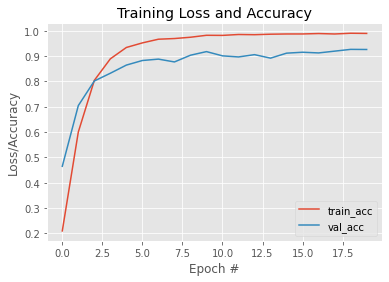

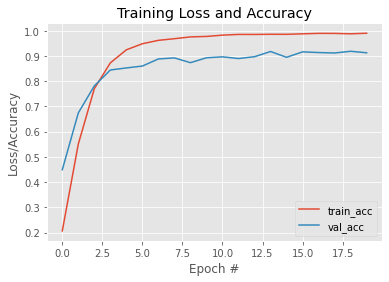

In [ ]:
# 4) With equalized train data with keras (rot, brightness, height shift, width shift, zero fill)

data = pickle.load(open(DATA_DIR + 'data_aug_2.pickle', 'rb'))
train_images = data['images']
train_labels = data['labels']

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 2s 10ms/step - loss: 2.5911 - accuracy: 0.2494 - val_loss: 1.4076 - val_accuracy: 0.5850
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 1.1230 - accuracy: 0.6488 - val_loss: 0.7587 - val_accuracy: 0.7603
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.5350 - accuracy: 0.8337 - val_loss: 0.6968 - val_accuracy: 0.7937
Epoch 4/20
235/235 [==============================] - 2s 9ms/step - loss: 0.2911 - accuracy: 0.9098 - val_loss: 0.5353 - val_accuracy: 0.8553
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1813 - accuracy: 0.9419 - val_loss: 0.4812 - val_accuracy: 0.8612
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1276 - accuracy: 0.9600 - val_loss: 0.4327 - val_accuracy: 0.8814
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0930 - accuracy: 0.9718 - val_loss: 0.4

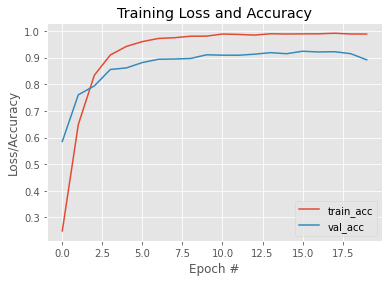

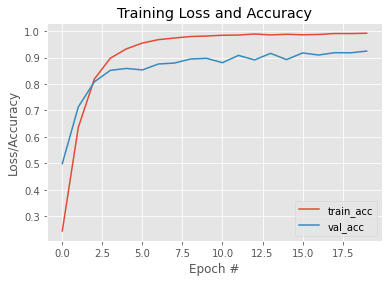

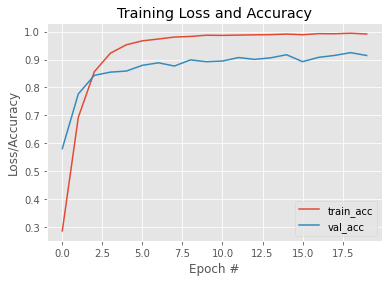

In [ ]:
# 5) With equalized train data with keras (rot, brightness, height shift, width shift, nearest fill)

data = pickle.load(open(DATA_DIR + 'data_aug_3.pickle', 'rb'))
train_images = data['images']
train_labels = data['labels']

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 13ms/step - loss: 1.8157 - accuracy: 0.4839 - val_loss: 0.6160 - val_accuracy: 0.8136
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 0.3563 - accuracy: 0.8932 - val_loss: 0.4362 - val_accuracy: 0.8873
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1565 - accuracy: 0.9540 - val_loss: 0.3558 - val_accuracy: 0.9107
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0916 - accuracy: 0.9728 - val_loss: 0.3342 - val_accuracy: 0.9333
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0677 - accuracy: 0.9799 - val_loss: 0.2921 - val_accuracy: 0.9349
Epoch 6/20
235/235 [==============================] - 3s 11ms/step - loss: 0.0493 - accuracy: 0.9861 - val_loss: 0.2287 - val_accuracy: 0.9388
Epoch 7/20
235/235 [==============================] - 3s 11ms/step - loss: 0.0351 - accuracy: 0.9896 - val_loss: 0.

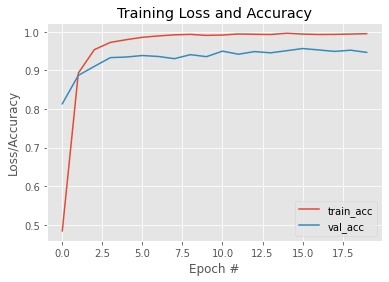

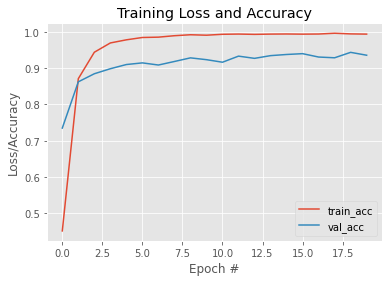

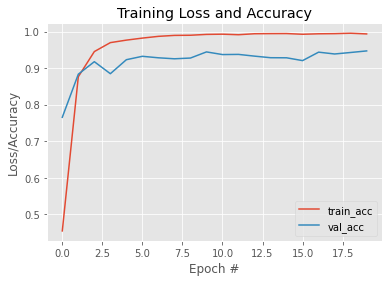

In [ ]:
# 6) With equalized train data with custom functions (rot, brightness, zero fill)

data = pickle.load(open(DATA_DIR + 'data_aug_4.pickle', 'rb'))
train_images = data['images']
train_labels = data['labels']

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 12ms/step - loss: 1.3057 - accuracy: 0.6297 - val_loss: 0.5265 - val_accuracy: 0.8494
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 0.2311 - accuracy: 0.9278 - val_loss: 0.3888 - val_accuracy: 0.8873
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1255 - accuracy: 0.9606 - val_loss: 0.3298 - val_accuracy: 0.8995
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0779 - accuracy: 0.9753 - val_loss: 0.2678 - val_accuracy: 0.9247
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0602 - accuracy: 0.9818 - val_loss: 0.2703 - val_accuracy: 0.9206
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0578 - accuracy: 0.9830 - val_loss: 0.2609 - val_accuracy: 0.9333
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.0430 - accuracy: 0.9867 - val_loss: 0.

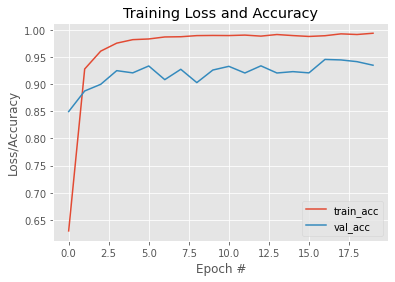

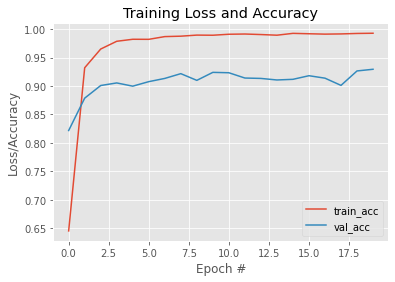

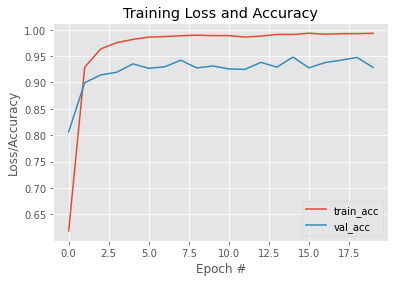

In [ ]:
# 7) With equalized train data with keras (rot, brightness, nearest fill)

# Load Augmented Train Set
data = pickle.load(open(DATA_DIR + 'data_aug_5.pickle', 'rb'))
train_images = data['images']
train_labels = data['labels']

# Standard Normalized
# Load mean and std data
with open(DATA_DIR + 'mean_image_aug5_rgb.pickle', 'rb') as f:
    mean_image = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3

with open(DATA_DIR + 'std_aug5_rgb.pickle', 'rb') as f:
    std = pickle.load(f, encoding='latin1')  # dictionary type, we use 'latin1' for python3

valid = pickle.load(open(DATA_DIR + 'valid.pickle', 'rb'))
test = pickle.load(open(DATA_DIR + 'test.pickle', 'rb'))
# labels = pd.read_csv(DATA_DIR + 'label_names.csv')

# Extract validation and test image and label sets
valid_images = valid['features']
valid_labels = valid['labels']
test_images = test['features']
test_labels = test['labels']

# Normalize Validation and Test set
valid_images = valid_images-mean_image['mean_image_rgb']
valid_images = valid_images/std['std_rgb']
test_images = test_images-mean_image['mean_image_rgb']
test_images = test_images/std['std_rgb']

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:30000], train_labels[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

[INFO] training network...
Epoch 1/20
235/235 [==============================] - 3s 11ms/step - loss: 2.6409 - accuracy: 0.2408 - val_loss: 1.6545 - val_accuracy: 0.4753
Epoch 2/20
235/235 [==============================] - 2s 10ms/step - loss: 1.2942 - accuracy: 0.5993 - val_loss: 1.0970 - val_accuracy: 0.6601
Epoch 3/20
235/235 [==============================] - 2s 10ms/step - loss: 0.7252 - accuracy: 0.7713 - val_loss: 0.8530 - val_accuracy: 0.7388
Epoch 4/20
235/235 [==============================] - 2s 10ms/step - loss: 0.4471 - accuracy: 0.8616 - val_loss: 0.6789 - val_accuracy: 0.7991
Epoch 5/20
235/235 [==============================] - 2s 10ms/step - loss: 0.2776 - accuracy: 0.9121 - val_loss: 0.6598 - val_accuracy: 0.8236
Epoch 6/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1992 - accuracy: 0.9374 - val_loss: 0.5531 - val_accuracy: 0.8406
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1548 - accuracy: 0.9516 - val_loss: 0.

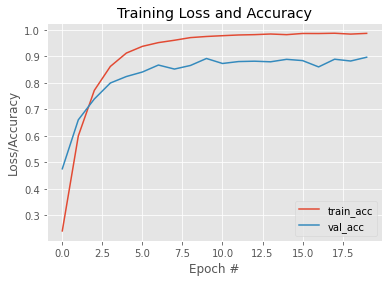

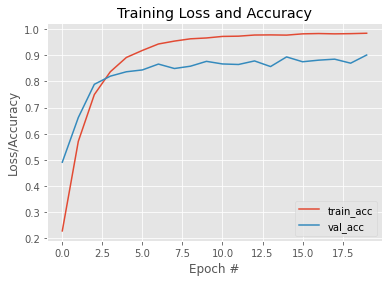

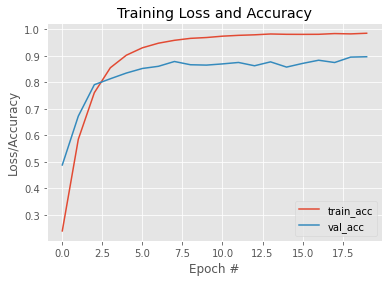

In [ ]:
# 8) With equalized train data with keras (rot, brightness, height shift, width shift, zoom, nearest fill)

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    y = to_categorical(y, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(X[:30000], y[:30000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    y = y.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

##### Comparison

| Data | Validation Set Accuracy (Runs:1,2,3) | Test Set Accuracy (Runs:1,2,3)|
|---|---|---|
|Unequalized|92.5, 90.5, 94.4|91, 92, 92|
|Unequalized and normalized|95.58, 95, 93.42|94, 94, 93|
|Augment 1|96, 95, 94.26|93, 94, 93|
|Augment 2|93, 92, 91|90, 93, 91|
|Augment 3|92, 92.5, 9.4|91, 93, 93|
|Augment 4|95, 94, 94.7|94, 92, 93|
|Augment 5|94, 92, 94.7|92, 92, 93|
|Augment 6|89.6, 90.14, 89.66|90, 90, 89|

Unequalized normalized and Augment 1 seem to perform the best. Selecting Augment 1 for further training since bias could be a problem with deeper networks.

[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 15ms/step - loss: 3.0801 - accuracy: 0.1752 - val_loss: 2.1344 - val_accuracy: 0.4422
Epoch 2/20
79/79 [==============================] - 1s 11ms/step - loss: 1.2156 - accuracy: 0.6352 - val_loss: 0.9449 - val_accuracy: 0.7444
Epoch 3/20
79/79 [==============================] - 1s 11ms/step - loss: 0.5767 - accuracy: 0.8223 - val_loss: 0.6230 - val_accuracy: 0.8224
Epoch 4/20
79/79 [==============================] - 1s 11ms/step - loss: 0.3363 - accuracy: 0.8954 - val_loss: 0.5518 - val_accuracy: 0.8279
Epoch 5/20
79/79 [==============================] - 1s 11ms/step - loss: 0.2433 - accuracy: 0.9251 - val_loss: 0.4530 - val_accuracy: 0.8587
Epoch 6/20
79/79 [==============================] - 1s 11ms/step - loss: 0.1735 - accuracy: 0.9464 - val_loss: 0.4491 - val_accuracy: 0.8739
Epoch 7/20
79/79 [==============================] - 1s 11ms/step - loss: 0.1253 - accuracy: 0.9636 - val_loss: 0.3736 - val_acc

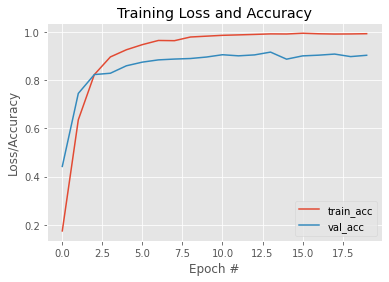

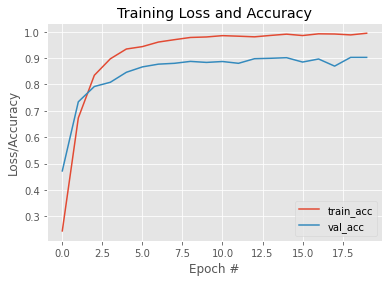

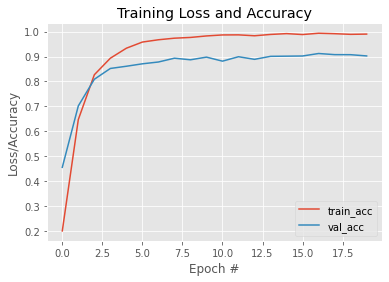

In [ ]:
# Re-testing for Augment 1

for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

#### MiniVGG

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes):
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        return model

[INFO] training network...
Epoch 1/20
79/79 [==============================] - 2s 19ms/step - loss: 1.9992 - accuracy: 0.4810 - val_loss: 3.6065 - val_accuracy: 0.0755
Epoch 2/20
79/79 [==============================] - 1s 15ms/step - loss: 0.4464 - accuracy: 0.8639 - val_loss: 3.5616 - val_accuracy: 0.1422
Epoch 3/20
79/79 [==============================] - 1s 15ms/step - loss: 0.2245 - accuracy: 0.9339 - val_loss: 3.7290 - val_accuracy: 0.1381
Epoch 4/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1298 - accuracy: 0.9654 - val_loss: 2.9372 - val_accuracy: 0.3102
Epoch 5/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0892 - accuracy: 0.9747 - val_loss: 1.6945 - val_accuracy: 0.6127
Epoch 6/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0641 - accuracy: 0.9826 - val_loss: 0.7243 - val_accuracy: 0.7914
Epoch 7/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0773 - accuracy: 0.9771 - val_loss: 0.5227 - val_acc

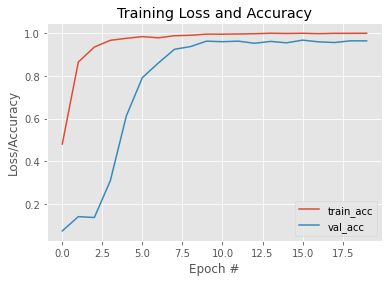

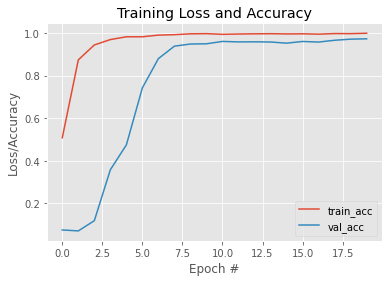

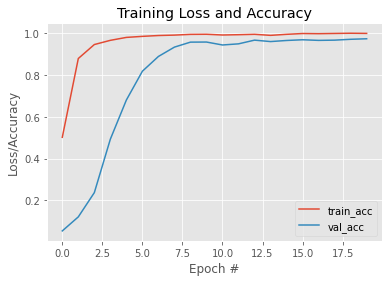

In [ ]:
for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

#### VGG16

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class VGGNet16:
    def build(height, width, depth, classes):
        model = Sequential(name = 'VGGNet16')
        
        # conv 1
        model.add(Conv2D(64, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 2
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 3
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 4
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 5
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 6
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 7
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 8
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 9
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 10
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 11
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 12
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 13
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        # fc 14
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 15
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 16
        model.add(Dense(1000))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

[INFO] training network...
Epoch 1/40
79/79 [==============================] - 6s 82ms/step - loss: 4.1126 - accuracy: 0.0709 - val_loss: 5.5500 - val_accuracy: 0.0238
Epoch 2/40
79/79 [==============================] - 6s 78ms/step - loss: 3.0488 - accuracy: 0.1498 - val_loss: 4.6250 - val_accuracy: 0.0544
Epoch 3/40
79/79 [==============================] - 6s 79ms/step - loss: 2.3539 - accuracy: 0.2802 - val_loss: 3.6884 - val_accuracy: 0.0859
Epoch 4/40
79/79 [==============================] - 6s 79ms/step - loss: 1.9292 - accuracy: 0.3974 - val_loss: 3.4524 - val_accuracy: 0.1943
Epoch 5/40
79/79 [==============================] - 6s 79ms/step - loss: 1.2614 - accuracy: 0.5902 - val_loss: 2.2925 - val_accuracy: 0.3787
Epoch 6/40
79/79 [==============================] - 6s 79ms/step - loss: 0.9832 - accuracy: 0.6863 - val_loss: 1.2928 - val_accuracy: 0.6234
Epoch 7/40
79/79 [==============================] - 6s 79ms/step - loss: 0.5570 - accuracy: 0.8160 - val_loss: 0.8609 - val_acc

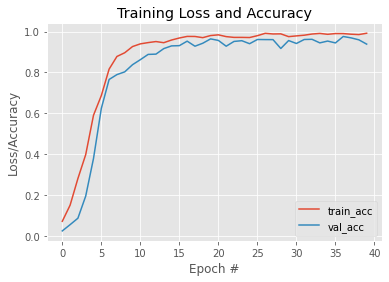

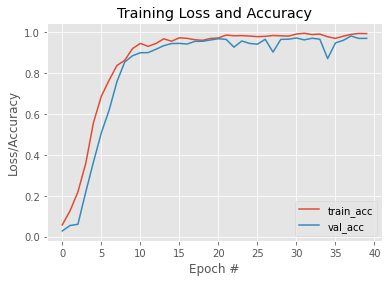

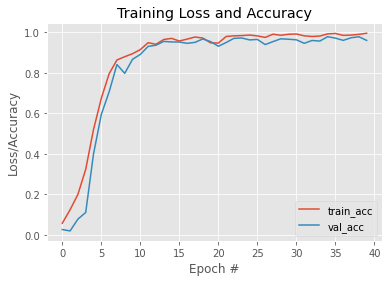

In [ ]:
for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = VGGNet16.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 40
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

#### VGG19

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class VGGNet19:
    def build(height, width, depth, classes):
        model = Sequential(name = 'VGGNet19')
        
        # conv 1
        model.add(Conv2D(64, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 2
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 3
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 4
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 5
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 6
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 7
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 8
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 9
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 10
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 11
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 12
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 13
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 14
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 15
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 16
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        # fc 17
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 18
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 19
        model.add(Dense(1000))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

[INFO] training network...
Epoch 1/40
79/79 [==============================] - 8s 96ms/step - loss: 4.3941 - accuracy: 0.0479 - val_loss: 15.0275 - val_accuracy: 0.0068
Epoch 2/40
79/79 [==============================] - 7s 92ms/step - loss: 3.4793 - accuracy: 0.0981 - val_loss: 3.8776 - val_accuracy: 0.0188
Epoch 3/40
79/79 [==============================] - 7s 92ms/step - loss: 2.9146 - accuracy: 0.1556 - val_loss: 3.9420 - val_accuracy: 0.0653
Epoch 4/40
79/79 [==============================] - 7s 93ms/step - loss: 2.6612 - accuracy: 0.1936 - val_loss: 3.3283 - val_accuracy: 0.1553
Epoch 5/40
79/79 [==============================] - 7s 92ms/step - loss: 2.3077 - accuracy: 0.2695 - val_loss: 3.4623 - val_accuracy: 0.1413
Epoch 6/40
79/79 [==============================] - 7s 92ms/step - loss: 1.9496 - accuracy: 0.3667 - val_loss: 3.0451 - val_accuracy: 0.2186
Epoch 7/40
79/79 [==============================] - 7s 92ms/step - loss: 1.6429 - accuracy: 0.4592 - val_loss: 1.9560 - val_ac

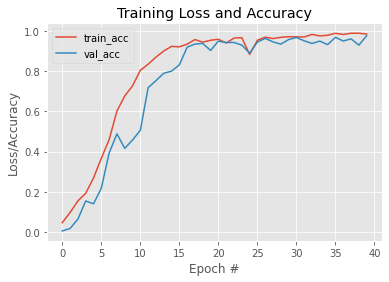

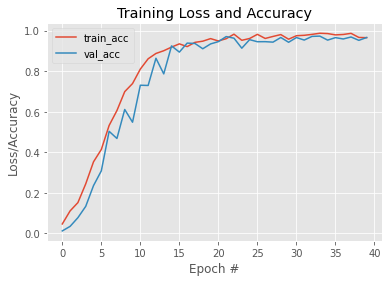

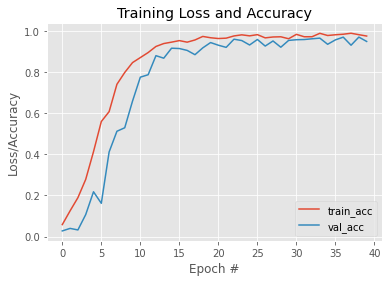

In [ ]:
for itr in range(0,3,1):

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = VGGNet19.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 40
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

### MiniGoogLeNet

In [ ]:

class MiniGoogLeNet:
    def convolution_module(x, K, kX, kY, stride, channelsDim, padding="same"):
        # create a CONV -> BN -> RELU sequence
        x = Conv2D(K, (kX, kY), strides = stride, padding = padding)(x)
        x = BatchNormalization(axis = channelsDim)(x)
        x = Activation('relu')(x)
        
        # return the output
        return x
    
    def inception_module(x, numberOf1x1Kernels, numberOf3x3Kernels, channelsDim):
        # define two "parallel" convolutions of size 1x1 and 3x3 concatenated across the channels dimension
        convolution_1x1 = MiniGoogLeNet.convolution_module(x, numberOf1x1Kernels, 1, 1, (1, 1), channelsDim)
        convolution_3x3 = MiniGoogLeNet.convolution_module(x, numberOf3x3Kernels, 3, 3, (1, 1), channelsDim)
        x = concatenate([convolution_1x1, convolution_3x3], axis = channelsDim)
        
        return x
        
    def downsample_module(x, K, channelsDim):
        # define a CONV and POOL and then concatenate across the channels dimension
        convolution_3x3 = MiniGoogLeNet.convolution_module(x, K, 3, 3, (2, 2), channelsDim, padding = 'valid')
        pool = MaxPooling2D((3, 3), strides = (2, 2))(x)
        x = concatenate([convolution_3x3, pool], axis = channelsDim)
        
        return x
    
    def build(width, height, depth, classes):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == "channels_first":
            inputShape = (depth, height, width)
            channelsDim = 1
        
        # define the model input and first CONV module
        inputs = Input(shape = inputShape)
        x = MiniGoogLeNet.convolution_module(inputs, 96, 3, 3, (1, 1), channelsDim)
        
        # two inception modules followed by a downsample module
        x = MiniGoogLeNet.inception_module(x, 32, 32, channelsDim)
        x = MiniGoogLeNet.inception_module(x, 32, 48, channelsDim)
        x = MiniGoogLeNet.downsample_module(x, 80, channelsDim)
        
        # four inception modules followed by a downsample module
        x = MiniGoogLeNet.inception_module(x, 112, 48, channelsDim)
        x = MiniGoogLeNet.inception_module(x, 96, 64, channelsDim)
        x = MiniGoogLeNet.inception_module(x, 80, 80, channelsDim)
        x = MiniGoogLeNet.inception_module(x, 48, 96, channelsDim)
        x = MiniGoogLeNet.downsample_module(x, 96, channelsDim)
        
        # two inception modules followed by global POOL and dropout
        x = MiniGoogLeNet.inception_module(x, 176, 160, channelsDim)
        x = MiniGoogLeNet.inception_module(x, 176, 160, channelsDim)
        x = AveragePooling2D((7, 7))(x)
        x = Dropout(0.5)(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes)(x)
        x = Activation('softmax')(x)
        
        # create a model
        model = Model(inputs, x, name='MiniGoogLeNet')
        
        # return the model
        return model


Test: 0
/n[INFO] compiling model...
Model: "MiniGoogLeNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_92 (Conv2D)              (None, 32, 32, 96)   2688        input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 32, 32, 96)   384         conv2d_92[0][0]                  
__________________________________________________________________________________________________
activation_100 (Activation)     (None, 32, 32, 96)   0           batch_normalization_95[0][0]     
_________________________________________________

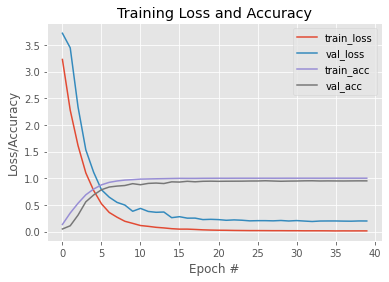

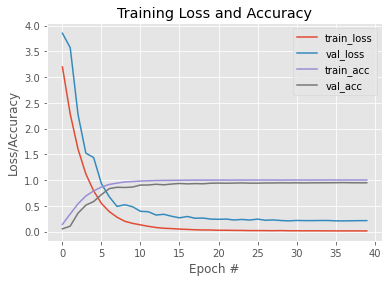

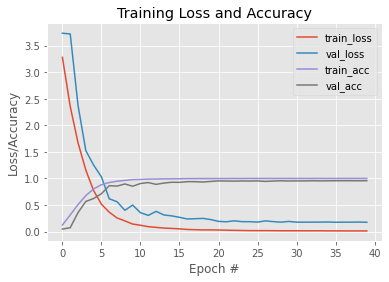

In [ ]:

numberOfEpochs = 40
initialLearningRate = 0.005

def polynomial_decay(epoch):
    maxEpochs = numberOfEpochs
    baseLearningRate = initialLearningRate
    power = 1.0
    
    alpha = baseLearningRate * (1 - (epoch / float(numberOfEpochs))) ** power
    
    # return the learning rate
    return alpha


# use mean subtraction
# mean = np.mean(train_images, axis = 0)
# train_images -= mean
# valid_images -= mean
# test_images -= mean

for i in range(0,3,1):
    print('\nTest: ' + str(i))

    # convert labels to one-hot
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    callbacks = [LearningRateScheduler(polynomial_decay)]

    print('/n[INFO] compiling model...')
    opt = SGD(lr = initialLearningRate, momentum=0.9)
    model = MiniGoogLeNet.build(width = 32, height = 32, depth = 3, classes = NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=["accuracy"])

    # print a model summary
    print(model.summary())

    # train the network
    print("[INFO] training network...")
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data = (valid_images, valid_labels), batch_size = 64, epochs = numberOfEpochs,
                callbacks = callbacks, verbose = 1)

    # save the network to disk
    #print("[INFO] serializing network...")
    #model.save('output/MiniGoogLeNet_cifar10.hdf5')

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY, digits=4))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, numberOfEpochs), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, numberOfEpochs), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, numberOfEpochs), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, numberOfEpochs), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()


Test: 0
/n[INFO] compiling model...
Model: "MiniGoogLeNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_339 (Conv2D)             (None, 32, 32, 96)   2688        input_18[0][0]                   
__________________________________________________________________________________________________
batch_normalization_342 (BatchN (None, 32, 32, 96)   384         conv2d_339[0][0]                 
__________________________________________________________________________________________________
activation_360 (Activation)     (None, 32, 32, 96)   0           batch_normalization_342[0][0]    
_________________________________________________

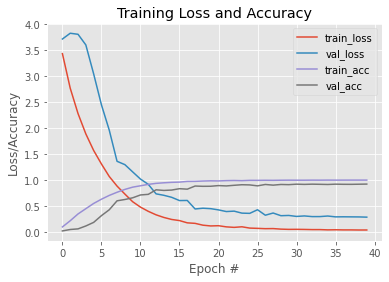

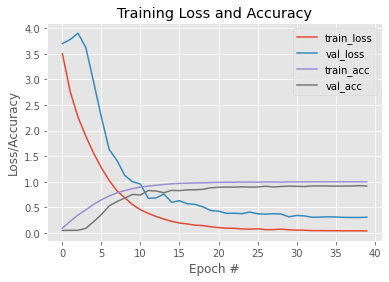

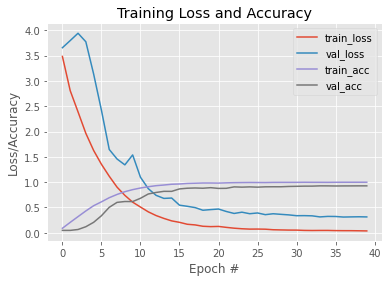

In [ ]:

numberOfEpochs = 40
initialLearningRate = 0.005

def polynomial_decay(epoch):
    maxEpochs = numberOfEpochs
    baseLearningRate = initialLearningRate
    power = 1.0
    
    alpha = baseLearningRate * (1 - (epoch / float(numberOfEpochs))) ** power
    
    # return the learning rate
    return alpha


# use mean subtraction
# mean = np.mean(train_images, axis = 0)
# train_images -= mean
# valid_images -= mean
# test_images -= mean

for i in range(0,3,1):
    print('\nTest: ' + str(i))

    # convert labels to one-hot
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    callbacks = [LearningRateScheduler(polynomial_decay)]

    print('/n[INFO] compiling model...')
    opt = SGD(lr = initialLearningRate, momentum=0.9)
    model = MiniGoogLeNet.build(width = 32, height = 32, depth = 3, classes = NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=["accuracy"])

    # print a model summary
    print(model.summary())

    # train the network
    print("[INFO] training network...")
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data = (valid_images, valid_labels), batch_size = BATCH_SIZE, epochs = numberOfEpochs,
                callbacks = callbacks, verbose = 1)

    # save the network to disk
    #print("[INFO] serializing network...")
    #model.save('output/MiniGoogLeNet_cifar10.hdf5')

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY, digits=4))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, numberOfEpochs), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, numberOfEpochs), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, numberOfEpochs), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, numberOfEpochs), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

/n[INFO] compiling model...
Model: "MiniGoogLeNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_434 (Conv2D)             (None, 32, 32, 96)   2688        input_23[0][0]                   
__________________________________________________________________________________________________
batch_normalization_437 (BatchN (None, 32, 32, 96)   384         conv2d_434[0][0]                 
__________________________________________________________________________________________________
activation_460 (Activation)     (None, 32, 32, 96)   0           batch_normalization_437[0][0]    
__________________________________________________________

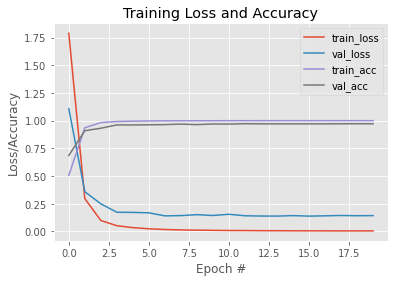

In [ ]:

numberOfEpochs = 20
initialLearningRate = 0.005

def polynomial_decay(epoch):
    maxEpochs = numberOfEpochs
    baseLearningRate = initialLearningRate
    power = 1.0
    
    alpha = baseLearningRate * (1 - (epoch / float(numberOfEpochs))) ** power
    
    # return the learning rate
    return alpha


# use mean subtraction
# mean = np.mean(train_images, axis = 0)
# train_images -= mean
# valid_images -= mean
# test_images -= mean

# convert labels to one-hot
lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

callbacks = [LearningRateScheduler(polynomial_decay)]

print('/n[INFO] compiling model...')
opt = SGD(lr = initialLearningRate, momentum=0.9)
model = MiniGoogLeNet.build(width = 32, height = 32, depth = 3, classes = NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=["accuracy"])

# print a model summary
print(model.summary())

# train the network
print("[INFO] training network...")
H = model.fit(train_images, train_labels, validation_data = (valid_images, valid_labels), batch_size = BATCH_SIZE, epochs = numberOfEpochs,
            callbacks = callbacks, verbose = 1)

# save the network to disk
#print("[INFO] serializing network...")
#model.save('output/MiniGoogLeNet_cifar10.hdf5')

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, numberOfEpochs), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, numberOfEpochs), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, numberOfEpochs), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, numberOfEpochs), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### ResNet

In [ ]:
class ResNet:
    def residual_module(data, K, stride, channelsDim, reduce = False, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9):
        shortcut = data
        
        # 1x1 CONVs
        bn1 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(data)
        act1 = Activation('relu')(bn1)
        conv1 = Conv2D(int(K * 0.25), (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act1)
        
        # 3x3 CONVs
        bn2 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv1)
        act2 = Activation('relu')(bn2)
        conv2 = Conv2D(int(K * 0.25), (3, 3), strides = stride, padding = 'same', use_bias = False, kernel_regularizer = l2(reg))(act2)
        
        # 1x1 CONVs
        bn3 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv2)
        act3 = Activation('relu')(bn3)
        conv3 = Conv2D(K, (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act3)
        
        # if we reduce the spatial size, apply a CONV layer to the shortcut
        if reduce:
            shortcut = Conv2D(K, (1, 1), strides = stride, use_bias = False, kernel_regularizer = l2(reg))(act1)
            
        # add the shortcut and the final CONV
        x = add([conv3, shortcut])
        
        return x
    
    def build(width, height, depth, classes, stages, filters, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9, dataset='cifar'):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == 'channels_first':
            inputShape = (depth, height, width)
            channelsDim = 1
            
        # set the input and apply BN
        inputs = Input(shape = inputShape)
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(inputs)
        
        if dataset == 'cifar':
            # apply a single CONV layer
            x = Conv2D(filters[0], (3, 3), use_bias = False, padding = 'same',
                       kernel_regularizer = l2(reg))(x)
        
        # loop over the number of stages
        for counter in range(0, len(stages)):
            # initialize the stride
            if counter == 0:
                stride = (1, 1)
            else:
                stride = (2, 2)
                    
            # apply a residual module to reduce the spatial dimension of the image volume
            x = ResNet.residual_module(x, filters[counter + 1], stride, channelsDim, reduce = True, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
            
            # loop over the number of layers in the current stage
            for j in range(0, stages[counter] - 1):
                # apply a residual module
                x = ResNet.residual_module(x, filters[counter + 1], (1, 1), channelsDim, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
                    
        # apply BN -> ACT -> POOL
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(x)
        x = Activation('relu')(x)
        x = AveragePooling2D((8, 8))(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes, kernel_regularizer = l2(reg))(x)
        x = Activation('softmax')(x)
        
        # create the model
        model = Model(inputs, x, name = 'ResNet')
        
        # return the model
        return model

[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_788 (BatchN (None, 32, 32, 3)    12          input_28[0][0]                   
__________________________________________________________________________________________________
conv2d_793 (Conv2D)             (None, 32, 32, 64)   1728        batch_normalization_788[0][0]    
__________________________________________________________________________________________________
batch_normalization_789 (BatchN (None, 32, 32, 64)   256         conv2d_793[0][0]                 
___________________________________________________________________

ValueError: ignored

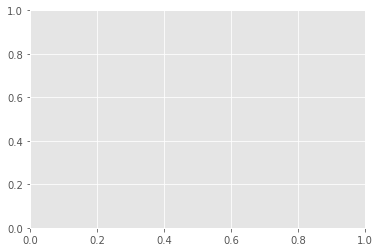

In [ ]:

# apply mean subtraction to the data
# mean = np.mean(train_images, axis = 0)
# train_images -= mean
# valid_images -= mean
# test_images -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)


aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")

print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = ResNet.build(32, 32, 3, NUM_CLASSES, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size=BATCH_SIZE), validation_data = (valid_images, valid_labels),
              steps_per_epoch=len(train_images[:10000]) // BATCH_SIZE, epochs=60, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 100), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, 100), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 100), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 100), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### ResNet50 (w & w/o Transfer Learning)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from os import makedirs
from os.path import join, exists, expanduser
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input
from keras.applications.imagenet_utils import decode_predictions

from keras.applications.resnet50 import ResNet50

In [ ]:
# Printing all the layer names

def printLayerNames(include_top = True):
    # load ResNet50 pre-trained on ImageNet
    print('Loading network...')
    model = ResNet50(weights = 'imagenet', include_top = include_top)
    
    # loop over the layers and display them
    for (i, layer) in enumerate(model.layers):
        print('{}\t{}'.format(i, layer.__class__.__name__))
print('Layer names with the head')
printLayerNames()

print('\nLayer names without the head')
printLayerNames(include_top = False)

Layer names with the head
Loading network...
102973440/102967424 [==============================] - 1s 0us/step
0	InputLayer
1	ZeroPadding2D
2	Conv2D
3	BatchNormalization
4	Activation
5	ZeroPadding2D
6	MaxPooling2D
7	Conv2D
8	BatchNormalization
9	Activation
10	Conv2D
11	BatchNormalization
12	Activation
13	Conv2D
14	Conv2D
15	BatchNormalization
16	BatchNormalization
17	Add
18	Activation
19	Conv2D
20	BatchNormalization
21	Activation
22	Conv2D
23	BatchNormalization
24	Activation
25	Conv2D
26	BatchNormalization
27	Add
28	Activation
29	Conv2D
30	BatchNormalization
31	Activation
32	Conv2D
33	BatchNormalization
34	Activation
35	Conv2D
36	BatchNormalization
37	Add
38	Activation
39	Conv2D
40	BatchNormalization
41	Activation
42	Conv2D
43	BatchNormalization
44	Activation
45	Conv2D
46	Conv2D
47	BatchNormalization
48	BatchNormalization
49	Add
50	Activation
51	Conv2D
52	BatchNormalization
53	Activation
54	Conv2D
55	BatchNormalization
56	Activation
57	Conv2D
58	BatchNormalization
59	Add
60	Activation

In [ ]:
class FCHeadNet:
    def build(baseModel, classes, D):
        # initialize the head model and add a fully-connected layer
        headModel = baseModel.output
        headModel = Flatten(name = 'flatten')(headModel)
        headModel = Dense(D, activation = 'relu')(headModel)
        headModel = Dropout(0.5)(headModel)
        
        # add a softmax layer
        headModel = Dense(classes, activation = 'softmax')(headModel)
        
        # return the model
        return headModel

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):

    models = 5
    initialLearningRate = 0.001
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha


Following cell implements Transfer Learning.

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load ResNet50 net without the head
    baseModel = ResNet50(weights = 'imagenet', include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'ResNet50_1.model')

Compiling model...
Training head...
Epoch 1/25
312/312 [==============================] - 8s 27ms/step - loss: 3.8211 - accuracy: 0.0226 - val_loss: 3.7731 - val_accuracy: 0.0166
Epoch 2/25
312/312 [==============================] - 7s 24ms/step - loss: 3.7511 - accuracy: 0.0306 - val_loss: 3.7578 - val_accuracy: 0.0261
Epoch 3/25
312/312 [==============================] - 7s 24ms/step - loss: 3.7356 - accuracy: 0.0321 - val_loss: 3.7863 - val_accuracy: 0.0068
Epoch 4/25
312/312 [==============================] - 7s 24ms/step - loss: 3.7287 - accuracy: 0.0313 - val_loss: 3.7590 - val_accuracy: 0.0268
Epoch 5/25
312/312 [==============================] - 7s 23ms/step - loss: 3.7184 - accuracy: 0.0332 - val_loss: 3.7578 - val_accuracy: 0.0202
Epoch 6/25
312/312 [==============================] - 7s 24ms/step - loss: 3.7025 - accuracy: 0.0380 - val_loss: 3.7379 - val_accuracy: 0.0206
Epoch 7/25
312/312 [==============================] - 7s 23ms/step - loss: 3.6974 - accuracy: 0.0388 - val

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.15      0.04      0.06       720
                              Speed limit (50km/h)       0.08      0.08      0.08       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.02      0.02      0.02       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.03      0.01      0.01       450
                             Speed limit (120km/h)       0.05      0.04      0.05       450
                                        No passing       0.00      0.00      0.

Following cell implements random weight initialization.

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load ResNet50 net without the head
    baseModel = ResNet50(weights = None, include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 50, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(train_images[:10000], train_labels[:10000], batch_size = 32, validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'ResNet50_2.model')

Compiling model...
Training head...
Epoch 1/50
312/312 [==============================] - 9s 28ms/step - loss: 3.7536 - accuracy: 0.0268 - val_loss: 3.7515 - val_accuracy: 0.0247
Epoch 2/50
312/312 [==============================] - 8s 25ms/step - loss: 3.7235 - accuracy: 0.0346 - val_loss: 3.7429 - val_accuracy: 0.0170
Epoch 3/50
312/312 [==============================] - 8s 26ms/step - loss: 3.7027 - accuracy: 0.0418 - val_loss: 3.7469 - val_accuracy: 0.0170
Epoch 4/50
312/312 [==============================] - 8s 25ms/step - loss: 3.6835 - accuracy: 0.0463 - val_loss: 3.7324 - val_accuracy: 0.0220
Epoch 5/50
312/312 [==============================] - 8s 25ms/step - loss: 3.6626 - accuracy: 0.0484 - val_loss: 3.7166 - val_accuracy: 0.0209
Epoch 6/50
312/312 [==============================] - 8s 26ms/step - loss: 3.6497 - accuracy: 0.0521 - val_loss: 3.7066 - val_accuracy: 0.0347
Epoch 7/50
312/312 [==============================] - 8s 26ms/step - loss: 3.6299 - accuracy: 0.0577 - val

KeyboardInterrupt: ignored

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load ResNet50 net without the head
    baseModel = ResNet50(weights = None, include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
    
    callbacks = [LearningRateScheduler(shiftedCosineLearning)]

    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // 32, callbacks = callbacks, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(train_images[:10000], train_labels[:10000], batch_size = 32, validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // 32, callbacks = callbacks, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'ResNet50_3.model')

Compiling model...
Training head...
Epoch 1/25
312/312 [==============================] - 9s 28ms/step - loss: 3.7553 - accuracy: 0.0266 - val_loss: 3.7548 - val_accuracy: 0.0261
Epoch 2/25
312/312 [==============================] - 8s 25ms/step - loss: 3.7360 - accuracy: 0.0378 - val_loss: 3.7496 - val_accuracy: 0.0206
Epoch 3/25
312/312 [==============================] - 8s 25ms/step - loss: 3.6957 - accuracy: 0.0487 - val_loss: 3.7494 - val_accuracy: 0.0059
Epoch 4/25
312/312 [==============================] - 8s 25ms/step - loss: 3.6599 - accuracy: 0.0528 - val_loss: 3.7351 - val_accuracy: 0.0184
Epoch 5/25
312/312 [==============================] - 8s 25ms/step - loss: 3.6471 - accuracy: 0.0529 - val_loss: 3.7282 - val_accuracy: 0.0261
Epoch 6/25
312/312 [==============================] - 8s 25ms/step - loss: 3.6326 - accuracy: 0.0559 - val_loss: 3.7158 - val_accuracy: 0.0184
Epoch 7/25
312/312 [==============================] - 8s 25ms/step - loss: 3.6023 - accuracy: 0.0607 - val

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.01      0.12      0.01        60
                              Speed limit (30km/h)       0.33      0.01      0.01       720
                              Speed limit (50km/h)       0.29      0.06      0.10       750
                              Speed limit (60km/h)       0.10      0.09      0.10       450
                              Speed limit (70km/h)       0.13      0.02      0.03       660
                              Speed limit (80km/h)       0.23      0.00      0.01       630
                       End of speed limit (80km/h)       0.04      0.08      0.05       150
                             Speed limit (100km/h)       0.06      0.02      0.03       450
                             Speed limit (120km/h)       0.09      0.13      0.11       450
                                        No passing       0.04      0.01      0.

### ResNet101 (Transfer Learning)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from os import makedirs
from os.path import join, exists, expanduser
from keras.preprocessing import image
from keras.applications.resnet import ResNet101
from keras.applications.resnet import preprocess_input
from keras.applications.imagenet_utils import decode_predictions


In [ ]:
# Printing all the layer names

def printLayerNames(include_top = True):
    # load ResNet50 pre-trained on ImageNet
    print('Loading network...')
    model = ResNet101(weights = 'imagenet', include_top = include_top)
    
    # loop over the layers and display them
    for (i, layer) in enumerate(model.layers):
        print('{}\t{}'.format(i, layer.__class__.__name__))
print('Layer names with the head')
printLayerNames()

print('\nLayer names without the head')
printLayerNames(include_top = False)

Layer names with the head
Loading network...
0	InputLayer
1	ZeroPadding2D
2	Conv2D
3	BatchNormalization
4	Activation
5	ZeroPadding2D
6	MaxPooling2D
7	Conv2D
8	BatchNormalization
9	Activation
10	Conv2D
11	BatchNormalization
12	Activation
13	Conv2D
14	Conv2D
15	BatchNormalization
16	BatchNormalization
17	Add
18	Activation
19	Conv2D
20	BatchNormalization
21	Activation
22	Conv2D
23	BatchNormalization
24	Activation
25	Conv2D
26	BatchNormalization
27	Add
28	Activation
29	Conv2D
30	BatchNormalization
31	Activation
32	Conv2D
33	BatchNormalization
34	Activation
35	Conv2D
36	BatchNormalization
37	Add
38	Activation
39	Conv2D
40	BatchNormalization
41	Activation
42	Conv2D
43	BatchNormalization
44	Activation
45	Conv2D
46	Conv2D
47	BatchNormalization
48	BatchNormalization
49	Add
50	Activation
51	Conv2D
52	BatchNormalization
53	Activation
54	Conv2D
55	BatchNormalization
56	Activation
57	Conv2D
58	BatchNormalization
59	Add
60	Activation
61	Conv2D
62	BatchNormalization
63	Activation
64	Conv2D
65	BatchNo

In [ ]:
class FCHeadNet:
    def build(baseModel, classes, D):
        # initialize the head model and add a fully-connected layer
        headModel = baseModel.output
        headModel = Flatten(name = 'flatten')(headModel)
        headModel = Dense(D, activation = 'relu')(headModel)
        headModel = Dropout(0.5)(headModel)
        
        # add a softmax layer
        headModel = Dense(classes, activation = 'softmax')(headModel)
        
        # return the model
        return headModel

Following cell implements Transfer Learning.

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load ResNet50 net without the head
    baseModel = ResNet101(weights = 'imagenet', include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'ResNet101_1.model')

Compiling model...
Training head...
Epoch 1/25
312/312 [==============================] - 11s 34ms/step - loss: 3.7813 - accuracy: 0.0241 - val_loss: 3.7816 - val_accuracy: 9.0703e-04
Epoch 2/25
312/312 [==============================] - 9s 30ms/step - loss: 3.7405 - accuracy: 0.0324 - val_loss: 3.7274 - val_accuracy: 0.0537
Epoch 3/25
312/312 [==============================] - 9s 29ms/step - loss: 3.7190 - accuracy: 0.0368 - val_loss: 3.7115 - val_accuracy: 0.0585
Epoch 4/25
312/312 [==============================] - 9s 29ms/step - loss: 3.7009 - accuracy: 0.0409 - val_loss: 3.6864 - val_accuracy: 0.0576
Epoch 5/25
312/312 [==============================] - 9s 29ms/step - loss: 3.6809 - accuracy: 0.0430 - val_loss: 3.7082 - val_accuracy: 0.0354
Epoch 6/25
312/312 [==============================] - 9s 30ms/step - loss: 3.6678 - accuracy: 0.0487 - val_loss: 3.6610 - val_accuracy: 0.0630
Epoch 7/25
312/312 [==============================] - 9s 30ms/step - loss: 3.6389 - accuracy: 0.0523 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.01      0.22      0.02        60
                              Speed limit (30km/h)       0.06      0.01      0.02       720
                              Speed limit (50km/h)       0.16      0.29      0.21       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.06      0.00      0.00       660
                              Speed limit (80km/h)       0.07      0.13      0.09       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.08      0.06      0.07       450
                             Speed limit (120km/h)       0.08      0.01      0.02       450
                                        No passing       0.07      0.05      0.

### DenseNet121 (Transfer Learning)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from os import makedirs
from os.path import join, exists, expanduser
from keras.preprocessing import image
from keras.applications.densenet import DenseNet121
from keras.applications.densenet import preprocess_input
from keras.applications.imagenet_utils import decode_predictions

In [ ]:
# Printing all the layer names

def printLayerNames(include_top = True):
    # load DenseNet pre-trained on ImageNet
    print('Loading network...')
    model = DenseNet121(weights = 'imagenet', include_top = include_top)
    
    # loop over the layers and display them
    for (i, layer) in enumerate(model.layers):
        print('{}\t{}'.format(i, layer.__class__.__name__))
print('Layer names with the head')
printLayerNames()

print('\nLayer names without the head')
printLayerNames(include_top = False)

Layer names with the head
Loading network...
33193984/33188688 [==============================] - 0s 0us/step
0	InputLayer
1	ZeroPadding2D
2	Conv2D
3	BatchNormalization
4	Activation
5	ZeroPadding2D
6	MaxPooling2D
7	BatchNormalization
8	Activation
9	Conv2D
10	BatchNormalization
11	Activation
12	Conv2D
13	Concatenate
14	BatchNormalization
15	Activation
16	Conv2D
17	BatchNormalization
18	Activation
19	Conv2D
20	Concatenate
21	BatchNormalization
22	Activation
23	Conv2D
24	BatchNormalization
25	Activation
26	Conv2D
27	Concatenate
28	BatchNormalization
29	Activation
30	Conv2D
31	BatchNormalization
32	Activation
33	Conv2D
34	Concatenate
35	BatchNormalization
36	Activation
37	Conv2D
38	BatchNormalization
39	Activation
40	Conv2D
41	Concatenate
42	BatchNormalization
43	Activation
44	Conv2D
45	BatchNormalization
46	Activation
47	Conv2D
48	Concatenate
49	BatchNormalization
50	Activation
51	Conv2D
52	AveragePooling2D
53	BatchNormalization
54	Activation
55	Conv2D
56	BatchNormalization
57	Activation


In [ ]:
class FCHeadNet:
    def build(baseModel, classes, D):
        # initialize the head model and add a fully-connected layer
        headModel = baseModel.output
        headModel = Flatten(name = 'flatten')(headModel)
        headModel = Dense(D, activation = 'relu')(headModel)
        headModel = Dropout(0.5)(headModel)
        
        # add a softmax layer
        headModel = Dense(classes, activation = 'softmax')(headModel)
        
        # return the model
        return headModel

Following cell implements Transfer Learning.

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load DenseNet121 net without the head
    baseModel = DenseNet121(weights = 'imagenet', include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = 32), validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // 32, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'DenseNet121_1.model')

Compiling model...
Training head...
Epoch 1/25
312/312 [==============================] - 11s 37ms/step - loss: 2.8226 - accuracy: 0.2219 - val_loss: 2.2133 - val_accuracy: 0.3082
Epoch 2/25
312/312 [==============================] - 9s 27ms/step - loss: 2.1032 - accuracy: 0.3599 - val_loss: 2.0044 - val_accuracy: 0.3478
Epoch 3/25
312/312 [==============================] - 8s 27ms/step - loss: 1.8946 - accuracy: 0.4058 - val_loss: 1.9510 - val_accuracy: 0.3546
Epoch 4/25
312/312 [==============================] - 8s 27ms/step - loss: 1.7693 - accuracy: 0.4428 - val_loss: 1.9252 - val_accuracy: 0.3653
Epoch 5/25
312/312 [==============================] - 8s 27ms/step - loss: 1.6844 - accuracy: 0.4660 - val_loss: 1.9228 - val_accuracy: 0.3914
Epoch 6/25
312/312 [==============================] - 8s 27ms/step - loss: 1.6361 - accuracy: 0.4847 - val_loss: 1.8681 - val_accuracy: 0.3991
Epoch 7/25
312/312 [==============================] - 8s 27ms/step - loss: 1.5948 - accuracy: 0.4994 - va

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load DenseNet121 net without the head
    baseModel = DenseNet121(weights = 'imagenet', include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE), validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'DenseNet121_1.model')

Compiling model...
Training head...
Epoch 1/25
78/78 [==============================] - 8s 105ms/step - loss: 3.0420 - accuracy: 0.1829 - val_loss: 2.4478 - val_accuracy: 0.2447
Epoch 2/25
78/78 [==============================] - 6s 82ms/step - loss: 2.3248 - accuracy: 0.3159 - val_loss: 2.1646 - val_accuracy: 0.3397
Epoch 3/25
78/78 [==============================] - 6s 81ms/step - loss: 2.0418 - accuracy: 0.3828 - val_loss: 2.0565 - val_accuracy: 0.3268
Epoch 4/25
78/78 [==============================] - 6s 81ms/step - loss: 1.8784 - accuracy: 0.4243 - val_loss: 1.9962 - val_accuracy: 0.3585
Epoch 5/25
78/78 [==============================] - 7s 86ms/step - loss: 1.7668 - accuracy: 0.4553 - val_loss: 1.9514 - val_accuracy: 0.3551
Epoch 6/25
78/78 [==============================] - 6s 82ms/step - loss: 1.6632 - accuracy: 0.4757 - val_loss: 1.9050 - val_accuracy: 0.3739
Epoch 7/25
78/78 [==============================] - 7s 85ms/step - loss: 1.5926 - accuracy: 0.4941 - val_loss: 1.8579

### DenseNet201 (Transfer Learning)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from os import makedirs
from os.path import join, exists, expanduser
from keras.preprocessing import image
from keras.applications.densenet import DenseNet201
from keras.applications.densenet import preprocess_input
from keras.applications.imagenet_utils import decode_predictions

In [ ]:
# Printing all the layer names

def printLayerNames(include_top = True):
    # load DenseNet pre-trained on ImageNet
    print('Loading network...')
    model = DenseNet201(weights = 'imagenet', include_top = include_top)
    
    # loop over the layers and display them
    for (i, layer) in enumerate(model.layers):
        print('{}\t{}'.format(i, layer.__class__.__name__))
print('Layer names with the head')
printLayerNames()

print('\nLayer names without the head')
printLayerNames(include_top = False)

Layer names with the head
Loading network...
82526208/82524592 [==============================] - 3s 0us/step
0	InputLayer
1	ZeroPadding2D
2	Conv2D
3	BatchNormalization
4	Activation
5	ZeroPadding2D
6	MaxPooling2D
7	BatchNormalization
8	Activation
9	Conv2D
10	BatchNormalization
11	Activation
12	Conv2D
13	Concatenate
14	BatchNormalization
15	Activation
16	Conv2D
17	BatchNormalization
18	Activation
19	Conv2D
20	Concatenate
21	BatchNormalization
22	Activation
23	Conv2D
24	BatchNormalization
25	Activation
26	Conv2D
27	Concatenate
28	BatchNormalization
29	Activation
30	Conv2D
31	BatchNormalization
32	Activation
33	Conv2D
34	Concatenate
35	BatchNormalization
36	Activation
37	Conv2D
38	BatchNormalization
39	Activation
40	Conv2D
41	Concatenate
42	BatchNormalization
43	Activation
44	Conv2D
45	BatchNormalization
46	Activation
47	Conv2D
48	Concatenate
49	BatchNormalization
50	Activation
51	Conv2D
52	AveragePooling2D
53	BatchNormalization
54	Activation
55	Conv2D
56	BatchNormalization
57	Activation


In [ ]:
class FCHeadNet:
    def build(baseModel, classes, D):
        # initialize the head model and add a fully-connected layer
        headModel = baseModel.output
        headModel = Flatten(name = 'flatten')(headModel)
        headModel = Dense(D, activation = 'relu')(headModel)
        headModel = Dropout(0.5)(headModel)
        
        # add a softmax layer
        headModel = Dense(classes, activation = 'softmax')(headModel)
        
        # return the model
        return headModel

Following cell implements Transfer Learning.

In [ ]:
def fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
             test_labels, modelPath):
    # initialize an image generator for data augmentation
    aug = ImageDataGenerator(rotation_range = 30, width_shift_range = 0.1, height_shift_range = 0.1,
                             shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True,
                             fill_mode = 'nearest')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # load DenseNet121 net without the head
    baseModel = DenseNet201(weights = 'imagenet', include_top = False,
                      input_tensor = Input(shape = (32, 32, 3)))
    
    # initialize the new head
    headModel = FCHeadNet.build(baseModel, len(labels['SignName']), 256)
    
    # build the model with the new head
    model = Model(inputs = baseModel.input, outputs = headModel)
    
    # loop over the layers of the base model and "freeze" them so they are not
    # updated during training
    for layer in baseModel.layers:
        layer.trainable = False
        
    # compile the model with a small learning rate
    print('Compiling model...')
    opt = RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the head of the network for a few iterations to initialize it a little better
    # than randomly
    print('Training head...')
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE), validation_data = (valid_images, valid_labels),
              epochs = 25, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # evaluate the net after this "smart" initialization
    print('Evaluating after initialization...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    # unfreeze the final set of convolutional layers
    for layer in baseModel.layers[15:]:
        layer.trainable = True
        
    # recompile the model
    print('Re-compiling model...')
    # opt = SGD(lr = 0.001)
    opt = 'adam'
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model again, fine-tuning the last few convolutional layers plus the head
    model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE), validation_data = (valid_images, valid_labels),
              epochs = 100, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # evaluate the net
    print('Evaluating after fine-tuning...')
    predictions = model.predict(test_images, batch_size = 32)
    print(classification_report(test_labels.argmax(axis = 1), predictions.argmax(axis = 1),
                                target_names = labels['SignName']))
    
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    
    # save the model
    print('Saving the model to disk...')
    model.save(modelPath)

In [ ]:
fineTune(train_images, train_labels, valid_images, valid_labels, test_images,
         test_labels,'DenseNet201_1.model')

Compiling model...
Training head...
Epoch 1/25
78/78 [==============================] - 13s 169ms/step - loss: 2.8577 - accuracy: 0.2276 - val_loss: 2.3461 - val_accuracy: 0.3175
Epoch 2/25
78/78 [==============================] - 8s 107ms/step - loss: 2.1947 - accuracy: 0.3531 - val_loss: 2.0653 - val_accuracy: 0.3805
Epoch 3/25
78/78 [==============================] - 8s 108ms/step - loss: 1.9379 - accuracy: 0.4130 - val_loss: 2.0232 - val_accuracy: 0.3769
Epoch 4/25
78/78 [==============================] - 8s 107ms/step - loss: 1.7729 - accuracy: 0.4564 - val_loss: 1.9877 - val_accuracy: 0.3751
Epoch 5/25
78/78 [==============================] - 8s 106ms/step - loss: 1.6531 - accuracy: 0.4854 - val_loss: 1.9004 - val_accuracy: 0.3968
Epoch 6/25
78/78 [==============================] - 8s 105ms/step - loss: 1.5619 - accuracy: 0.5121 - val_loss: 1.8648 - val_accuracy: 0.4188
Epoch 7/25
78/78 [==============================] - 8s 105ms/step - loss: 1.4946 - accuracy: 0.5297 - val_loss:

### Ensemble (model averaging)

Following three ensembles tested below for the miniVGG Net with different input data.

1.   Using data from Augment 1
2.   Using original train set (unaugmented), and not normalized
3.   Using original train set (unaugmented), and 255 normalized







In [ ]:
# 1) Ensemble training using Augment 1 data
tf.keras.backend.clear_session()

aug = ImageDataGenerator()

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('MiniVGGNet', i, 'is being trained...')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['miniVGGs', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['miniVGGs','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['miniVGGs','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/20
78/78 [==============================] - 2s 21ms/step - loss: 2.0797 - accuracy: 0.4720 - val_loss: 3.6223 - val_accuracy: 0.1048
Epoch 2/20
78/78 [==============================] - 1s 18ms/step - loss: 0.4381 - accuracy: 0.8728 - val_loss: 3.8141 - val_accuracy: 0.1512
Epoch 3/20
78/78 [==============================] - 1s 18ms/step - loss: 0.1979 - accuracy: 0.9434 - val_loss: 3.7158 - val_accuracy: 0.1939
Epoch 4/20
78/78 [==============================] - 1s 17ms/step - loss: 0.1204 - accuracy: 0.9673 - val_loss: 3.4556 - val_accuracy: 0.2710
Epoch 5/20
78/78 [==============================] - 1s 17ms/step - loss: 0.0718 - accuracy: 0.9828 - val_loss: 2.1613 - val_accuracy: 0.5331
Epoch 6/20
78/78 [==============================] - 1s 17ms/step - loss: 0.0633 - accuracy: 0.9843 - val_loss: 1.1362 - val_accuracy: 0.7347
Epoch 7/20
78/78 [==============================] - 1s 18ms/step - loss: 0.0433 - accuracy: 0.9898 - val_loss: 0.4956 - v

In [ ]:

# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['miniVGGs', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.98      0.92      0.95        60
                              Speed limit (30km/h)       0.99      0.98      0.99       720
                              Speed limit (50km/h)       0.97      1.00      0.98       750
                              Speed limit (60km/h)       0.98      0.96      0.97       450
                              Speed limit (70km/h)       0.98      0.98      0.98       660
                              Speed limit (80km/h)       0.95      0.97      0.96       630
                       End of speed limit (80km/h)       1.00      0.85      0.92       150
                             Speed limit (100km/h)       0.99      0.93      0.96       450
                             Speed limit (120km/h)       0

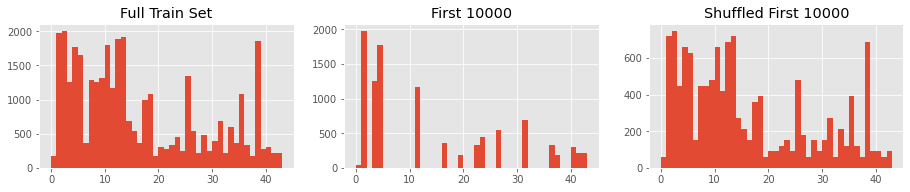

In [ ]:
# 2) Using unaugmented and unnormalized data

train = pickle.load(open(DATA_DIR + 'train.pickle', 'rb'))
valid = pickle.load(open(DATA_DIR + 'valid.pickle', 'rb'))
test = pickle.load(open(DATA_DIR + 'test.pickle', 'rb'))
# labels = pickle.load(open(DATA_DIR + 'labels.pickle', 'rb'))
labels = pd.read_csv(DATA_DIR + 'label_names.csv')

# Extract image and label sets
train_images = train['features']
train_labels = train['labels']
valid_images = valid['features']
valid_labels = valid['labels']
test_images = test['features']
test_labels = test['labels']

train_coords = train['coords']
train_size = train['sizes']

# Shuffle
# train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
valid_images ,valid_labels = shuffle(valid_images, valid_labels, random_state=147865452)
test_images ,test_labels = shuffle(test_images, test_labels, random_state=147865452)

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(train_labels, bins) 
ax[0].set_title('Full Train Set')
ax[1].hist(train_labels[:10000], bins) 
ax[1].set_title('First 10000')
# Shuffle
train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
ax[2].hist(test_labels, bins) 
ax[2].set_title('Shuffled First 10000')
pass

In [ ]:
# Ensemble training using while performing Augment 1 like data generation

aug = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('MiniVGGNet', i, 'is being trained...')
    tf.keras.backend.clear_session()
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['miniVGG2s', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['miniVGG2s','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['miniVGG2s','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 86ms/step - loss: 1.9703 - accuracy: 0.4928 - val_loss: 1.9451 - val_accuracy: 0.4937
Epoch 2/20
78/78 [==============================] - 6s 83ms/step - loss: 0.6211 - accuracy: 0.8112 - val_loss: 0.8260 - val_accuracy: 0.7796
Epoch 3/20
78/78 [==============================] - 6s 82ms/step - loss: 0.3210 - accuracy: 0.9005 - val_loss: 0.3729 - val_accuracy: 0.9043
Epoch 4/20
78/78 [==============================] - 6s 82ms/step - loss: 0.2166 - accuracy: 0.9350 - val_loss: 0.2634 - val_accuracy: 0.9252
Epoch 5/20
78/78 [==============================] - 7s 84ms/step - loss: 0.1516 - accuracy: 0.9555 - val_loss: 0.3080 - val_accuracy: 0.9054
Epoch 6/20
78/78 [==============================] - 7s 85ms/step - loss: 0.1308 - accuracy: 0.9630 - val_loss: 0.2450 - val_accuracy: 0.9354
Epoch 7/20
78/78 [==============================] - 6s 83ms/step - loss: 0.1073 - accuracy: 0.9680 - val_loss: 0.1576 - v

In [ ]:


# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['miniVGG2s', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       1.00      0.98      0.99        60
                              Speed limit (30km/h)       0.96      0.99      0.98       720
                              Speed limit (50km/h)       0.97      0.99      0.98       750
                              Speed limit (60km/h)       0.96      0.95      0.95       450
                              Speed limit (70km/h)       0.99      0.98      0.98       660
                              Speed limit (80km/h)       0.95      0.95      0.95       630
                       End of speed limit (80km/h)       1.00      0.84      0.91       150
                             Speed limit (100km/h)       0.97      0.90      0.93       450
                             Speed limit (120km/h)       0

In [ ]:
# 3) Using unaugmented and 255 normalized data
# Ensemble training using while performing Augment 1 like data generation

train_images = preprocess_data(train_images,norm_255=True)
valid_images = preprocess_data(valid_images,norm_255=True)
test_images = preprocess_data(test_images,norm_255=True)

aug = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('MiniVGGNet', i, 'is being trained...')
    tf.keras.backend.clear_session()
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['miniVGG3s', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['miniVGG3s','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['miniVGG3s','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 85ms/step - loss: 2.1388 - accuracy: 0.4574 - val_loss: 3.7360 - val_accuracy: 0.0544
Epoch 2/20
78/78 [==============================] - 7s 85ms/step - loss: 0.6337 - accuracy: 0.8032 - val_loss: 3.7788 - val_accuracy: 0.0136
Epoch 3/20
78/78 [==============================] - 6s 83ms/step - loss: 0.3590 - accuracy: 0.8930 - val_loss: 3.7732 - val_accuracy: 0.0476
Epoch 4/20
78/78 [==============================] - 6s 82ms/step - loss: 0.2182 - accuracy: 0.9328 - val_loss: 4.0028 - val_accuracy: 0.0476
Epoch 5/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1580 - accuracy: 0.9530 - val_loss: 5.3321 - val_accuracy: 0.0476
Epoch 6/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1290 - accuracy: 0.9593 - val_loss: 5.5979 - val_accuracy: 0.0517
Epoch 7/20
78/78 [==============================] - 6s 83ms/step - loss: 0.0938 - accuracy: 0.9741 - val_loss: 3.8804 - v

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MiniVGGNet 1 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 86ms/step - loss: 2.0660 - accuracy: 0.4769 - val_loss: 3.9255 - val_accuracy: 0.0476
Epoch 2/20
78/78 [==============================] - 6s 82ms/step - loss: 0.6029 - accuracy: 0.8198 - val_loss: 4.3530 - val_accuracy: 0.0476
Epoch 3/20
78/78 [==============================] - 6s 81ms/step - loss: 0.3299 - accuracy: 0.8997 - val_loss: 4.9527 - val_accuracy: 0.0476
Epoch 4/20
78/78 [==============================] - 6s 81ms/step - loss: 0.2175 - accuracy: 0.9345 - val_loss: 5.7038 - val_accuracy: 0.0476
Epoch 5/20
78/78 [==============================] - 6s 81ms/step - loss: 0.1586 - accuracy: 0.9549 - val_loss: 5.0612 - val_accuracy: 0.0476
Epoch 6/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1142 - accuracy: 0.9659 - val_loss: 10.1576 - val_accuracy: 0.0068
Epoch 7/20
78/78 [==============================] - 6s 81ms/step - loss: 0.1001 - accuracy: 0.9700 - val_loss: 5.1737 - 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MiniVGGNet 2 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 85ms/step - loss: 1.9926 - accuracy: 0.4943 - val_loss: 3.8136 - val_accuracy: 0.0476
Epoch 2/20
78/78 [==============================] - 6s 80ms/step - loss: 0.5517 - accuracy: 0.8304 - val_loss: 4.5527 - val_accuracy: 0.0476
Epoch 3/20
78/78 [==============================] - 6s 81ms/step - loss: 0.3064 - accuracy: 0.9089 - val_loss: 5.2771 - val_accuracy: 0.0476
Epoch 4/20
78/78 [==============================] - 6s 80ms/step - loss: 0.2536 - accuracy: 0.9238 - val_loss: 7.1755 - val_accuracy: 0.0476
Epoch 5/20
78/78 [==============================] - 6s 81ms/step - loss: 0.1756 - accuracy: 0.9470 - val_loss: 5.8796 - val_accuracy: 0.0476
Epoch 6/20
78/78 [==============================] - 6s 81ms/step - loss: 0.1219 - accuracy: 0.9622 - val_loss: 4.3646 - val_accuracy: 0.0476
Epoch 7/20
78/78 [==============================] - 6s 81ms/step - loss: 0.0844 - accuracy: 0.9756 - val_loss: 3.9680 - v

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MiniVGGNet 3 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 89ms/step - loss: 2.1281 - accuracy: 0.4628 - val_loss: 3.9852 - val_accuracy: 0.0136
Epoch 2/20
78/78 [==============================] - 6s 83ms/step - loss: 0.6757 - accuracy: 0.7933 - val_loss: 3.8791 - val_accuracy: 0.0293
Epoch 3/20
78/78 [==============================] - 6s 83ms/step - loss: 0.3568 - accuracy: 0.8925 - val_loss: 4.0145 - val_accuracy: 0.0476
Epoch 4/20
78/78 [==============================] - 6s 83ms/step - loss: 0.2403 - accuracy: 0.9290 - val_loss: 4.4698 - val_accuracy: 0.0476
Epoch 5/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1681 - accuracy: 0.9510 - val_loss: 4.1943 - val_accuracy: 0.0476
Epoch 6/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1247 - accuracy: 0.9631 - val_loss: 3.9163 - val_accuracy: 0.0705
Epoch 7/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1093 - accuracy: 0.9678 - val_loss: 4.2605 - v

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MiniVGGNet 4 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 85ms/step - loss: 2.1366 - accuracy: 0.4566 - val_loss: 3.7522 - val_accuracy: 0.0798
Epoch 2/20
78/78 [==============================] - 6s 82ms/step - loss: 0.7053 - accuracy: 0.7826 - val_loss: 3.8419 - val_accuracy: 0.0921
Epoch 3/20
78/78 [==============================] - 6s 82ms/step - loss: 0.3534 - accuracy: 0.8908 - val_loss: 4.1186 - val_accuracy: 0.0476
Epoch 4/20
78/78 [==============================] - 6s 81ms/step - loss: 0.2380 - accuracy: 0.9274 - val_loss: 4.3834 - val_accuracy: 0.0476
Epoch 5/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1649 - accuracy: 0.9506 - val_loss: 4.6569 - val_accuracy: 0.0762
Epoch 6/20
78/78 [==============================] - 6s 83ms/step - loss: 0.1351 - accuracy: 0.9618 - val_loss: 4.8672 - val_accuracy: 0.0385
Epoch 7/20
78/78 [==============================] - 6s 82ms/step - loss: 0.1011 - accuracy: 0.9687 - val_loss: 4.7851 - v

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:

# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['miniVGG3s', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.03      0.03      0.03       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.05      0.97      0.10       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


The three ensembles are tested below for the LeNet Net with different input data.

1.   Using data from Augment 1
2.   Using original train set (unaugmented), and not normalized
3.   Using original train set (unaugmented), and 255 normalized







In [ ]:
# 1) Ensemble training using Augment 1 data
tf.keras.backend.clear_session()

aug = ImageDataGenerator()

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('LeNet', i, 'is being trained...')
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['LeNet1', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['LeNet1','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['LeNet1','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

LeNet 0 is being trained...
Epoch 1/20
78/78 [==============================] - 1s 17ms/step - loss: 2.9355 - accuracy: 0.2089 - val_loss: 1.9464 - val_accuracy: 0.4789
Epoch 2/20
78/78 [==============================] - 1s 14ms/step - loss: 1.1920 - accuracy: 0.6461 - val_loss: 1.0042 - val_accuracy: 0.7118
Epoch 3/20
78/78 [==============================] - 1s 14ms/step - loss: 0.5685 - accuracy: 0.8268 - val_loss: 0.6882 - val_accuracy: 0.8054
Epoch 4/20
78/78 [==============================] - 1s 14ms/step - loss: 0.3400 - accuracy: 0.8960 - val_loss: 0.6260 - val_accuracy: 0.8238
Epoch 5/20
78/78 [==============================] - 1s 14ms/step - loss: 0.2236 - accuracy: 0.9330 - val_loss: 0.6558 - val_accuracy: 0.8043
Epoch 6/20
78/78 [==============================] - 1s 14ms/step - loss: 0.1782 - accuracy: 0.9468 - val_loss: 0.4702 - val_accuracy: 0.8760
Epoch 7/20
78/78 [==============================] - 1s 14ms/step - loss: 0.1350 - accuracy: 0.9589 - val_loss: 0.4952 - val_ac

In [ ]:

# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['LeNet1', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.82      0.70      0.76        60
                              Speed limit (30km/h)       0.95      0.93      0.94       720
                              Speed limit (50km/h)       0.90      0.97      0.93       750
                              Speed limit (60km/h)       0.85      0.94      0.89       450
                              Speed limit (70km/h)       0.94      0.93      0.93       660
                              Speed limit (80km/h)       0.88      0.87      0.88       630
                       End of speed limit (80km/h)       0.98      0.75      0.85       150
                             Speed limit (100km/h)       0.94      0.79      0.86       450
                             Speed limit (120km/h)       0

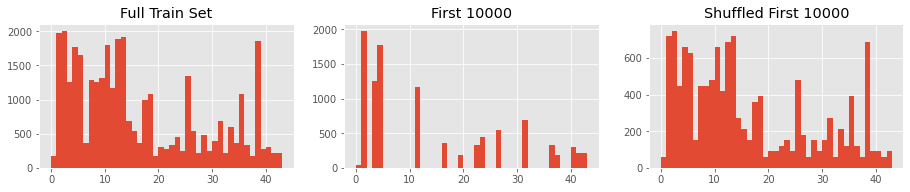

In [ ]:
# 2) Using unaugmented and unnormalized data

train = pickle.load(open(DATA_DIR + 'train.pickle', 'rb'))
valid = pickle.load(open(DATA_DIR + 'valid.pickle', 'rb'))
test = pickle.load(open(DATA_DIR + 'test.pickle', 'rb'))
# labels = pickle.load(open(DATA_DIR + 'labels.pickle', 'rb'))
labels = pd.read_csv(DATA_DIR + 'label_names.csv')

# Extract image and label sets
train_images = train['features']
train_labels = train['labels']
valid_images = valid['features']
valid_labels = valid['labels']
test_images = test['features']
test_labels = test['labels']

train_coords = train['coords']
train_size = train['sizes']

# Shuffle
# train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
valid_images ,valid_labels = shuffle(valid_images, valid_labels, random_state=147865452)
test_images ,test_labels = shuffle(test_images, test_labels, random_state=147865452)

import matplotlib.pyplot as plt
bins = []
for i in range(0,44,1):
    bins.append(i)

# Plot histogram of class distribution in sets

f,ax = plt.subplots(1,3) 
f.subplots_adjust(0,0,2,0.5)

ax[0].hist(train_labels, bins) 
ax[0].set_title('Full Train Set')
ax[1].hist(train_labels[:10000], bins) 
ax[1].set_title('First 10000')
# Shuffle
train_images ,train_labels = shuffle(train_images, train_labels, random_state=147865452)
ax[2].hist(test_labels, bins) 
ax[2].set_title('Shuffled First 10000')
pass

In [ ]:
# Ensemble training using while performing Augment 1 like data generation

aug = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('LeNet2', i, 'is being trained...')
    tf.keras.backend.clear_session()
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['LeNet2', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['LeNet2','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['LeNet2','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

LeNet2 0 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 85ms/step - loss: 4.3785 - accuracy: 0.3302 - val_loss: 1.7496 - val_accuracy: 0.5671
Epoch 2/20
78/78 [==============================] - 6s 82ms/step - loss: 1.1275 - accuracy: 0.7009 - val_loss: 1.0184 - val_accuracy: 0.7388
Epoch 3/20
78/78 [==============================] - 7s 84ms/step - loss: 0.6928 - accuracy: 0.8140 - val_loss: 1.0136 - val_accuracy: 0.7653
Epoch 4/20
78/78 [==============================] - 6s 83ms/step - loss: 0.5278 - accuracy: 0.8593 - val_loss: 0.8834 - val_accuracy: 0.7671
Epoch 5/20
78/78 [==============================] - 6s 82ms/step - loss: 0.4193 - accuracy: 0.8897 - val_loss: 0.6072 - val_accuracy: 0.8478
Epoch 6/20
78/78 [==============================] - 6s 82ms/step - loss: 0.3190 - accuracy: 0.9124 - val_loss: 0.6382 - val_accuracy: 0.8478
Epoch 7/20
78/78 [==============================] - 6s 81ms/step - loss: 0.3083 - accuracy: 0.9177 - val_loss: 0.5979 - val_a

In [ ]:


# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['LeNet2', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.97      0.48      0.64        60
                              Speed limit (30km/h)       0.83      0.99      0.90       720
                              Speed limit (50km/h)       0.99      0.90      0.94       750
                              Speed limit (60km/h)       0.85      0.87      0.86       450
                              Speed limit (70km/h)       0.95      0.92      0.94       660
                              Speed limit (80km/h)       0.85      0.91      0.88       630
                       End of speed limit (80km/h)       1.00      0.82      0.90       150
                             Speed limit (100km/h)       0.96      0.82      0.88       450
                             Speed limit (120km/h)       0

In [ ]:
# 3) Using unaugmented and 255 normalized data
# Ensemble training using while performing Augment 1 like data generation

train_images = preprocess_data(train_images,norm_255=True)
valid_images = preprocess_data(valid_images,norm_255=True)
test_images = preprocess_data(test_images,norm_255=True)

aug = ImageDataGenerator(rotation_range=13,brightness_range=[0.2,1.8])

numberOfModels = 5
epochs = 20

for i in range(numberOfModels):
    print('LeNet3', i, 'is being trained...')
    tf.keras.backend.clear_session()
    
    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = LeNetReg.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(train_images[:10000], train_labels[:10000], batch_size = BATCH_SIZE),
                  validation_data = (valid_images, valid_labels), epochs = epochs, 
                  steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)
    
    # save the model
    p = ['LeNet3', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(test_images, batch_size=BATCH_SIZE)
    report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])
    
    # save the classification report to file
    p = ['LeNet3','outputs', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['LeNet3','outputs', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

LeNet3 0 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 86ms/step - loss: 3.6294 - accuracy: 0.3759 - val_loss: 3.6574 - val_accuracy: 0.0932
Epoch 2/20
78/78 [==============================] - 7s 85ms/step - loss: 1.0198 - accuracy: 0.7327 - val_loss: 3.5603 - val_accuracy: 0.1032
Epoch 3/20
78/78 [==============================] - 7s 85ms/step - loss: 0.5980 - accuracy: 0.8364 - val_loss: 3.4711 - val_accuracy: 0.1138
Epoch 4/20
78/78 [==============================] - 7s 85ms/step - loss: 0.4740 - accuracy: 0.8759 - val_loss: 3.4383 - val_accuracy: 0.0769
Epoch 5/20
78/78 [==============================] - 7s 83ms/step - loss: 0.3802 - accuracy: 0.8986 - val_loss: 3.3839 - val_accuracy: 0.1689
Epoch 6/20
78/78 [==============================] - 6s 83ms/step - loss: 0.2614 - accuracy: 0.9279 - val_loss: 3.3702 - val_accuracy: 0.1181
Epoch 7/20
78/78 [==============================] - 6s 80ms/step - loss: 0.2613 - accuracy: 0.9317 - val_loss: 3.4513 - val_a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


LeNet3 1 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 84ms/step - loss: 3.6322 - accuracy: 0.3481 - val_loss: 3.6814 - val_accuracy: 0.1295
Epoch 2/20
78/78 [==============================] - 6s 81ms/step - loss: 1.1524 - accuracy: 0.6884 - val_loss: 3.5879 - val_accuracy: 0.0680
Epoch 3/20
78/78 [==============================] - 6s 81ms/step - loss: 0.6987 - accuracy: 0.8087 - val_loss: 3.5047 - val_accuracy: 0.1401
Epoch 4/20
78/78 [==============================] - 6s 81ms/step - loss: 0.4850 - accuracy: 0.8678 - val_loss: 3.4603 - val_accuracy: 0.0821
Epoch 5/20
78/78 [==============================] - 6s 81ms/step - loss: 0.3791 - accuracy: 0.8970 - val_loss: 3.3893 - val_accuracy: 0.0941
Epoch 6/20
78/78 [==============================] - 6s 82ms/step - loss: 0.2961 - accuracy: 0.9202 - val_loss: 3.5008 - val_accuracy: 0.1179
Epoch 7/20
78/78 [==============================] - 6s 81ms/step - loss: 0.2485 - accuracy: 0.9350 - val_loss: 3.6122 - val_a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


LeNet3 2 is being trained...
Epoch 1/20
78/78 [==============================] - 7s 84ms/step - loss: 4.0248 - accuracy: 0.3430 - val_loss: 3.6772 - val_accuracy: 0.1444
Epoch 2/20
78/78 [==============================] - 6s 81ms/step - loss: 1.1501 - accuracy: 0.6988 - val_loss: 3.5787 - val_accuracy: 0.0898
Epoch 3/20
78/78 [==============================] - 6s 80ms/step - loss: 0.6898 - accuracy: 0.8103 - val_loss: 3.5493 - val_accuracy: 0.1152
Epoch 4/20
78/78 [==============================] - 6s 80ms/step - loss: 0.4649 - accuracy: 0.8763 - val_loss: 3.5053 - val_accuracy: 0.0828
Epoch 5/20
78/78 [==============================] - 6s 80ms/step - loss: 0.3461 - accuracy: 0.9037 - val_loss: 3.4657 - val_accuracy: 0.1075
Epoch 6/20
78/78 [==============================] - 6s 80ms/step - loss: 0.2663 - accuracy: 0.9260 - val_loss: 3.4660 - val_accuracy: 0.1263
Epoch 7/20
78/78 [==============================] - 6s 80ms/step - loss: 0.2173 - accuracy: 0.9400 - val_loss: 3.4689 - val_a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


LeNet3 3 is being trained...
Epoch 1/20
78/78 [==============================] - 6s 81ms/step - loss: 4.0407 - accuracy: 0.3228 - val_loss: 3.6917 - val_accuracy: 0.1966
Epoch 2/20
78/78 [==============================] - 6s 79ms/step - loss: 1.2153 - accuracy: 0.6676 - val_loss: 3.6312 - val_accuracy: 0.1497
Epoch 3/20
78/78 [==============================] - 6s 79ms/step - loss: 0.7079 - accuracy: 0.8108 - val_loss: 3.5605 - val_accuracy: 0.0905
Epoch 4/20
78/78 [==============================] - 6s 80ms/step - loss: 0.4803 - accuracy: 0.8671 - val_loss: 3.4879 - val_accuracy: 0.0744
Epoch 5/20
78/78 [==============================] - 6s 80ms/step - loss: 0.3681 - accuracy: 0.8974 - val_loss: 3.4261 - val_accuracy: 0.1422
Epoch 6/20
78/78 [==============================] - 6s 80ms/step - loss: 0.2886 - accuracy: 0.9226 - val_loss: 3.4584 - val_accuracy: 0.1664
Epoch 7/20
78/78 [==============================] - 6s 79ms/step - loss: 0.2675 - accuracy: 0.9249 - val_loss: 3.4021 - val_a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


LeNet3 4 is being trained...
Epoch 1/20
78/78 [==============================] - 6s 79ms/step - loss: 4.2355 - accuracy: 0.3053 - val_loss: 3.6716 - val_accuracy: 0.1882
Epoch 2/20
78/78 [==============================] - 6s 79ms/step - loss: 1.2635 - accuracy: 0.6573 - val_loss: 3.5700 - val_accuracy: 0.0490
Epoch 3/20
78/78 [==============================] - 6s 80ms/step - loss: 0.7325 - accuracy: 0.7967 - val_loss: 3.5715 - val_accuracy: 0.0340
Epoch 4/20
78/78 [==============================] - 6s 79ms/step - loss: 0.5502 - accuracy: 0.8454 - val_loss: 3.7005 - val_accuracy: 0.0410
Epoch 5/20
78/78 [==============================] - 6s 78ms/step - loss: 0.3624 - accuracy: 0.9003 - val_loss: 3.8920 - val_accuracy: 0.0340
Epoch 6/20
78/78 [==============================] - 6s 77ms/step - loss: 0.3028 - accuracy: 0.9162 - val_loss: 3.8124 - val_accuracy: 0.0549
Epoch 7/20
78/78 [==============================] - 6s 77ms/step - loss: 0.2429 - accuracy: 0.9320 - val_loss: 4.5301 - val_a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:

# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['LeNet3', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(test_images, batch_size=BATCH_SIZE))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName']))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.04      1.00      0.07       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.09      0.11      0.10       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


||Ensemble|Model 1 (Train, Validation)|Model 2|Model 3|Model 4|Model 5|Test|
|---|---|---|---|---|---|---|---|
||1|99.35, 90.09|99.34, 92.40|99.45, 91.13|99.21, 91.75|99.51, 92.00|93|
|LeNET|2|96.77, 85.28|97.37, 90.48|96.80, 91.32|96.83, 85.74|97.78, 88.71|93|
||3|95.80,  7.94|97.29,  4.24|97.41,  4.04|97.85,  4.99|97.03,  8.71|05|
||1|99.89, 96.33|99.80, 97.26|99.50, 97.28|99.80, 96.17|99.79, 96.58|97|
|MiniVGGNET|2|98.74, 96.39|99.07, 96.87|98.84, 94.13|99.30, 96.94|99.00, 94.83|97|
||3|98.92,  7.55|98.75,  3.47|99.18,  9.68|98.71,  4.76|98.47,  7.39|06|


### Snapshot Ensemble

In [ ]:
tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, brightness_range=[0.2,1.8],fill_mode = 'nearest')

train_labels = to_categorical(train_labels, 43)
valid_labels = to_categorical(valid_labels, 43)
test_labels = to_categorical(test_labels, 43)

models = 3
initialLearningRate = 0.2
epochs = 60

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
opt = SGD(lr = initialLearningRate)
#pt = Adam()
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=64)
report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

Epoch 1/60
78/78 [==============================] - 1s 18ms/step - loss: 4.9444 - accuracy: 0.0360 - val_loss: 3.8467 - val_accuracy: 0.0068
Epoch 2/60
78/78 [==============================] - 1s 14ms/step - loss: 2.3683 - accuracy: 0.4166 - val_loss: 1.7849 - val_accuracy: 0.5120
Epoch 3/60
78/78 [==============================] - 1s 14ms/step - loss: 0.5256 - accuracy: 0.8357 - val_loss: 0.7183 - val_accuracy: 0.7819
Epoch 4/60
78/78 [==============================] - 1s 14ms/step - loss: 0.2434 - accuracy: 0.9240 - val_loss: 0.4605 - val_accuracy: 0.8544
Epoch 5/60
78/78 [==============================] - 1s 14ms/step - loss: 0.1572 - accuracy: 0.9532 - val_loss: 0.3042 - val_accuracy: 0.9079
Epoch 6/60
78/78 [==============================] - 1s 14ms/step - loss: 0.1081 - accuracy: 0.9685 - val_loss: 0.2428 - val_accuracy: 0.9252
Epoch 7/60
78/78 [==============================] - 1s 14ms/step - loss: 0.0786 - accuracy: 0.9773 - val_loss: 0.1919 - val_accuracy: 0.9370
Epoch 8/60
78

Snapshot ensemble did not seem to help find a better minima. I'll retry this snapshot ensemble on finalmodel onnce hyperparameter tunning has been performed.

# Hyperparameter tunning

* Optimizer
* Weight Initialization
* Activation Functions
* Kernel Sizes
* Convolution Layer Sizes
* Loss Functions
* Dense layer Size
* Pool Sizes
* Dropouts
* L1/L2 Regularization

In [ ]:
from keras.initializers import random_normal
from keras.initializers import random_uniform
from keras.initializers import truncated_normal
from keras.initializers import zeros
from keras.initializers import ones
from keras.initializers import glorot_normal
from keras.initializers import glorot_uniform
from keras.initializers import orthogonal
from keras.initializers import variance_scaling
from keras.losses import BinaryCrossentropy

In [ ]:
optimizers = ['Adam', 'SGD', 'RMSprop', 'Adadelta', 'Adagrad', 'Adamax']
activations = ['relu', 'softmax', 'sigmoid', 'tanh']
initializers = [random_normal(seed=5468), random_uniform(seed=5468), 
                truncated_normal(seed=5468), zeros, ones, glorot_normal(seed=5468),
                glorot_uniform(seed=5468), orthogonal(seed=5468), 
                variance_scaling(seed=5468)]
kernels = [(3,3), (5,5), (7,7), (9,9),(11,11)]
convSizes = [32, 64, 128, 256, 512]
poolSizes = [(2,2), (3,3), (4,4)]
strides = [(1,1), (2,2), (3,3), (4,4)]
# denseLayer = [64, 100, 128, 175, 225, 256, 300, 450, 500, 512, 600, 750, 1024]
denseLayer = [64, 100, 128, 175, 225, 256, 300, 450, 500, 512, 600]
denseDropouts = [0, 0.2, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
poolDropouts = [0, 0.1, 0.25, 0.35, 0.5, 0.6, 0.75, 0.8, 0.9]
lambda1s = [0, 0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]
lambda2s = [0, 0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]
lossList = ['mean_squared_error', 'categorical_crossentropy', BinaryCrossentropy()]

In [ ]:
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

### MiniVGGNet Class

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes):
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        return model

### Optimizers



Test for MiniVGGNet with Adam optimizer
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 18ms/step - loss: 1.8983 - accuracy: 0.5017 - val_loss: 3.5761 - val_accuracy: 0.0741
Epoch 2/20
79/79 [==============================] - 1s 14ms/step - loss: 0.3854 - accuracy: 0.8864 - val_loss: 4.2201 - val_accuracy: 0.0893
Epoch 3/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1867 - accuracy: 0.9466 - val_loss: 3.5652 - val_accuracy: 0.2184
Epoch 4/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1099 - accuracy: 0.9704 - val_loss: 3.0677 - val_accuracy: 0.3408
Epoch 5/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0710 - accuracy: 0.9823 - val_loss: 1.3940 - val_accuracy: 0.6612
Epoch 6/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0547 - accuracy: 0.9872 - val_loss: 0.9050 - val_accuracy: 0.7553
Epoch 7/20
79/79 [==============================] - 1s 14ms/step - loss: 0.0497 - acc

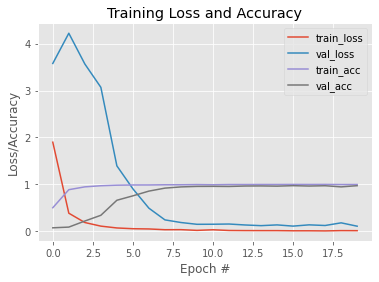

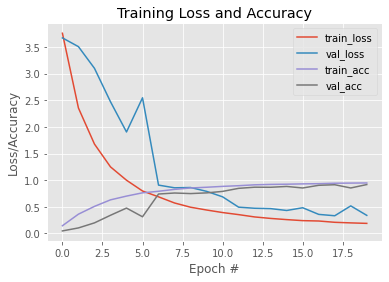

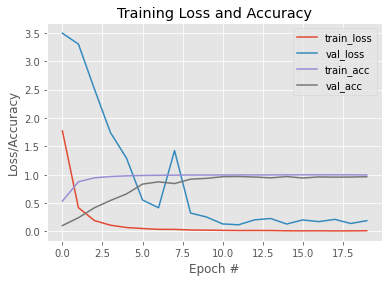

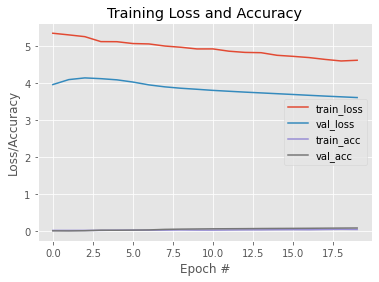

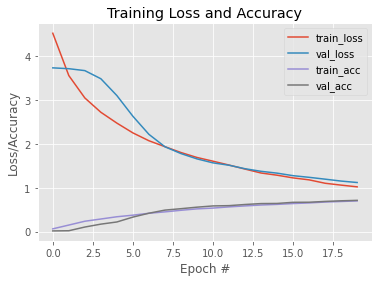

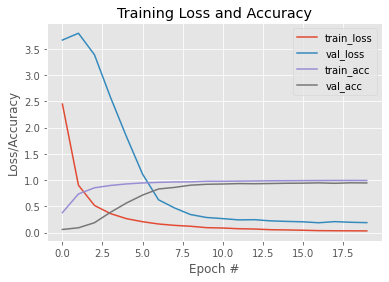

In [ ]:
for opt in optimizers:

    print('\n\nTest for MiniVGGNet with ' + opt + ' optimizer')

    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

|Optimizers|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|Adam|99.66|97.19|96|
|SGD(0.01)|94.73|91.75|91|
|RMSprop|99.54|96.39|95|
|Adadelta|05.04|09.07|06|
|Adagrad|69.96|71.20|70|
|Adamax|99.32|94.60|94|


### Weight Initialization

The default weight initializer in tf.keras.layers.conv2d and tf.keras.layers.dense is glorot uniform.
(Source code:
https://github.com/tensorflow/tensorflow/blob/v2.3.1/tensorflow/python/keras/layers/convolutional.py#L512-L664,
https://github.com/tensorflow/tensorflow/blob/v2.3.1/tensorflow/python/keras/layers/core.py#L1067-L1233 
)


In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, initializer):
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with following weight initialization
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 18ms/step - loss: 2.4447 - accuracy: 0.3598 - val_loss: 3.7091 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 1s 15ms/step - loss: 0.7311 - accuracy: 0.7838 - val_loss: 3.4758 - val_accuracy: 0.1349
Epoch 3/20
79/79 [==============================] - 1s 15ms/step - loss: 0.3894 - accuracy: 0.8860 - val_loss: 2.8504 - val_accuracy: 0.3211
Epoch 4/20
79/79 [==============================] - 1s 14ms/step - loss: 0.1908 - accuracy: 0.9463 - val_loss: 2.3573 - val_accuracy: 0.3966
Epoch 5/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1286 - accuracy: 0.9665 - val_loss: 1.6154 - val_accuracy: 0.5837
Epoch 6/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0935 - accuracy: 0.9750 - val_loss: 0.9409 - val_accuracy: 0.7447
Epoch 7/20
79/79 [==============================] - 1s 15ms/step - l

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.11      0.04      0.06       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.17      0.07      0.10       450
                                        No passing       0.07      0.00      0.

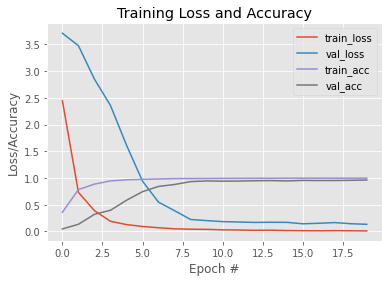

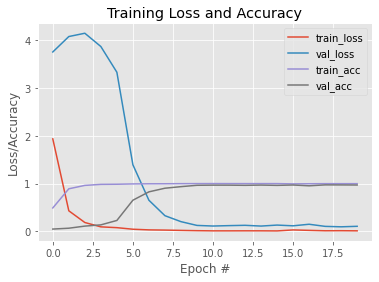

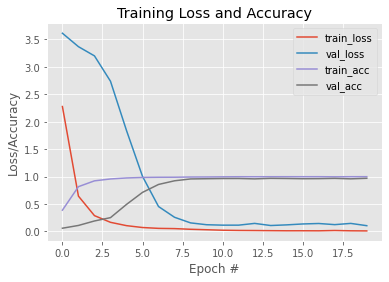

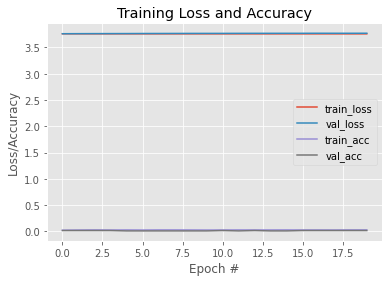

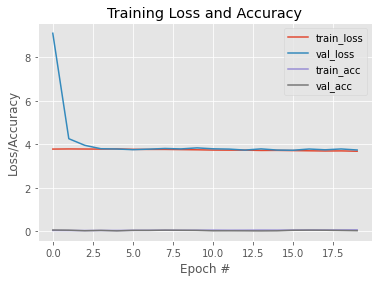

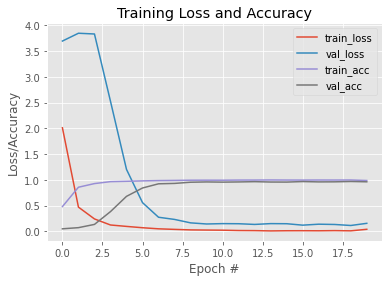

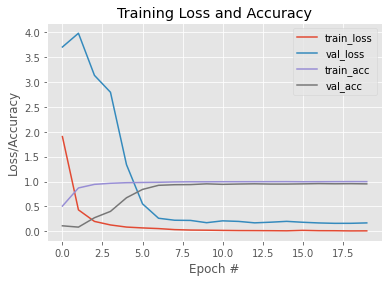

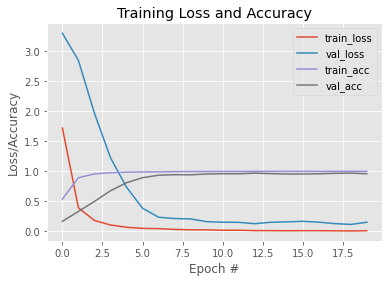

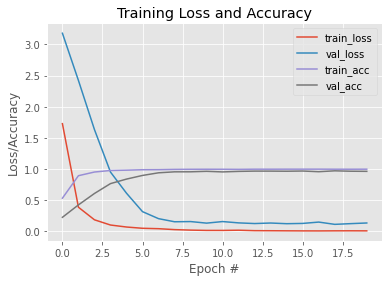

In [ ]:
for initializer in initializers:

    print('\n\nTest for MiniVGGNet with following weight initialization')
    print(initializer)

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, initializer=initializer)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()



Test for MiniVGGNet with following weight initialization
<class 'tensorflow.python.keras.initializers.initializers_v2.RandomUniform'>
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 18ms/step - loss: 1.9104 - accuracy: 0.5008 - val_loss: 3.8018 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 1s 14ms/step - loss: 0.4263 - accuracy: 0.8944 - val_loss: 4.3200 - val_accuracy: 0.0476
Epoch 3/20
79/79 [==============================] - 1s 14ms/step - loss: 0.1802 - accuracy: 0.9608 - val_loss: 4.5689 - val_accuracy: 0.0476
Epoch 4/20
79/79 [==============================] - 1s 14ms/step - loss: 0.1005 - accuracy: 0.9804 - val_loss: 4.0659 - val_accuracy: 0.0746
Epoch 5/20
79/79 [==============================] - 1s 14ms/step - loss: 0.0625 - accuracy: 0.9886 - val_loss: 3.8405 - val_accuracy: 0.1730
Epoch 6/20
79/79 [==============================] - 1s 14ms/step - loss: 0.0445 - accuracy: 0.9915 - val_loss: 2.4697 - val_accuracy

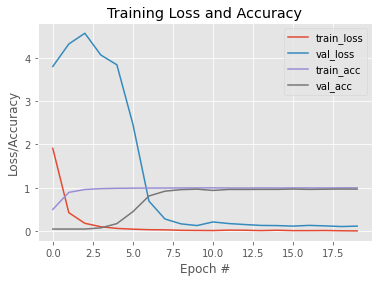

In [ ]:

print('\n\nTest for MiniVGGNet with following weight initialization')
print(random_uniform)

tf.keras.backend.clear_session()

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, initializer=random_uniform(seed=5468))
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
print(model.summary())

print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.show()

|Initializers|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|Random Normal|99.8|96.26|96|
|Random Uniform|99.72|96.92|96|
|Truncated Normal|99.81|96.87|96|
|Zeros|2.63|1.36|1|
|Ones|5.8|2.2|0.02|
|Glorot Normal|98.76|96.26|95|
|Glorot Uniform|99.79|95.31|96|
|Orthogonal|99.90|95.85|96|
|Variance Scaling|99.84|96.37|95|

### Activation Functions

Final layer activation change.

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, activation):
        initializer = random_uniform(seed=5468)
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation(activation))
        
        return model



For final layer activation: relu
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 17ms/step - loss: 7.1514 - accuracy: 0.0597 - val_loss: 6.4690 - val_accuracy: 0.0272
Epoch 2/20
79/79 [==============================] - 1s 14ms/step - loss: 4.9894 - accuracy: 0.1127 - val_loss: 5.9420 - val_accuracy: 0.0272
Epoch 3/20
79/79 [==============================] - 1s 14ms/step - loss: 4.0108 - accuracy: 0.1444 - val_loss: 5.8686 - val_accuracy: 0.0476
Epoch 4/20
79/79 [==============================] - 1s 14ms/step - loss: 3.4614 - accuracy: 0.1608 - val_loss: 6.5374 - val_accuracy: 0.0635
Epoch 5/20
79/79 [==============================] - 1s 14ms/step - loss: 4.5119 - accuracy: 0.1020 - val_loss: 8.6257 - val_accuracy: 0.0615
Epoch 6/20
79/79 [==============================] - 1s 14ms/step - loss: 3.8619 - accuracy: 0.1298 - val_loss: 12.2169 - val_accuracy: 0.0234
Epoch 7/20
79/79 [==============================] - 1s 14ms/step - loss: 4.2022 - accuracy:

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.08      0.48      0.14        60
                              Speed limit (30km/h)       0.54      0.06      0.11       720
                              Speed limit (50km/h)       0.18      0.08      0.11       750
                              Speed limit (60km/h)       0.19      0.03      0.06       450
                              Speed limit (70km/h)       0.28      0.01      0.03       660
                              Speed limit (80km/h)       0.19      0.09      0.12       630
                       End of speed limit (80km/h)       0.14      0.13      0.13       150
                             Speed limit (100km/h)       0.11      0.36      0.17       450
                             Speed limit (120km/h)       0.22      0.39      0.28       450
                                        No passing       0.10      0.29      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


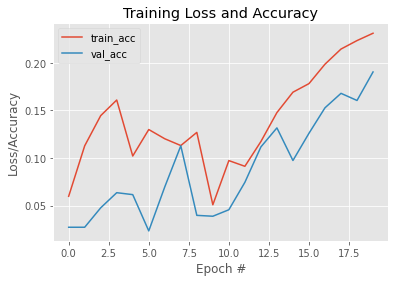

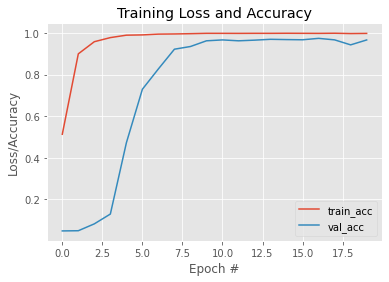

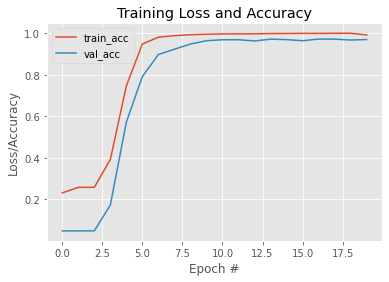

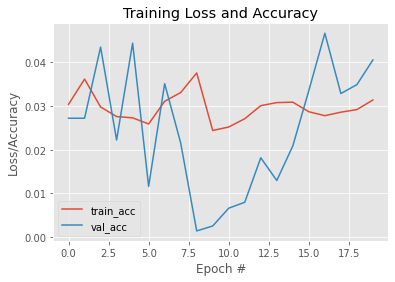

In [ ]:
for activation in activations:

    print('\n\nFor final layer activation: ' + activation)
    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, activation=activation)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

All layer activation change.

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, activation):
        initializer = random_uniform(seed=5468)
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation(activation))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation(activation))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation(activation))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3, 3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation(activation))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation(activation))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation(activation))
        
        return model



For activation in all layer: relu
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 17ms/step - loss: 5.6305 - accuracy: 0.1101 - val_loss: 7.9517 - val_accuracy: 0.0340
Epoch 2/20
79/79 [==============================] - 1s 14ms/step - loss: 3.1250 - accuracy: 0.2077 - val_loss: 8.5470 - val_accuracy: 0.0692
Epoch 3/20
79/79 [==============================] - 1s 14ms/step - loss: 2.6238 - accuracy: 0.2731 - val_loss: 7.6935 - val_accuracy: 0.1170
Epoch 4/20
79/79 [==============================] - 1s 14ms/step - loss: 2.2668 - accuracy: 0.4187 - val_loss: 6.5347 - val_accuracy: 0.1202
Epoch 5/20
79/79 [==============================] - 1s 14ms/step - loss: 2.1593 - accuracy: 0.4795 - val_loss: 5.1702 - val_accuracy: 0.1615
Epoch 6/20
79/79 [==============================] - 1s 14ms/step - loss: 1.9371 - accuracy: 0.5672 - val_loss: 2.8454 - val_accuracy: 0.3800
Epoch 7/20
79/79 [==============================] - 1s 14ms/step - loss: 1.8332 - accuracy:

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


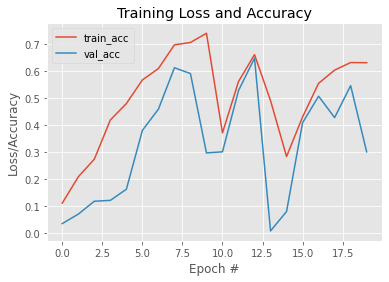

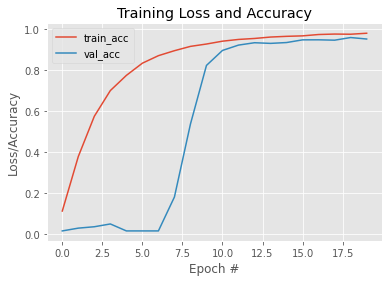

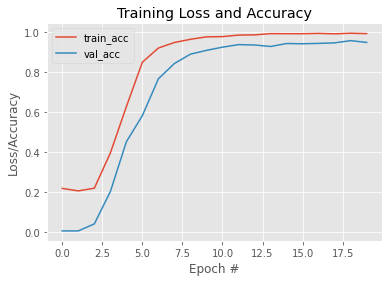

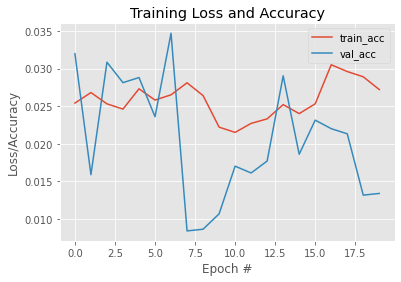

In [ ]:
for activation in activations:

    print('\n\nFor activation in all layer: ' + activation)
    tf.keras.backend.clear_session()
    train_labels = to_categorical(train_labels, 43)
    valid_labels = to_categorical(valid_labels, 43)
    test_labels = to_categorical(test_labels, 43)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, activation=activation)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

### Kernel Sizes

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, k1, k2, k3, k4):

        initializer = random_uniform(seed=5468)
        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, k1, padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, k2, padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, k3, padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, k4, padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model

In [ ]:
def kernel_test(k1,k2,k3,k4, train_images = train_images, train_labels = train_labels,
                valid_images = valid_images, valid_labels = valid_labels,
                test_images = test_images, test_labels = test_labels):
    print('\n\nTest for MiniVGGNet with following kernel combination initialization')
    print(str([k1,k2,k3,k4]))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, k1=k1,k2=k2,k3=k3,k4=k4)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

Testing a combination of these kernel sizes: [(3, 3), (5, 5), (7, 7), (9, 9), (11, 11)]


Test for MiniVGGNet with following kernel combination initialization
[(3, 3), (3, 3), (3, 3), (3, 3)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 1s 18ms/step - loss: 2.0000 - accuracy: 0.4671 - val_loss: 3.7276 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 1s 15ms/step - loss: 0.4584 - accuracy: 0.8876 - val_loss: 3.9104 - val_accuracy: 0.0478
Epoch 3/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1855 - accuracy: 0.9616 - val_loss: 4.2411 - val_accuracy: 0.0478
Epoch 4/20
79/79 [==============================] - 1s 15ms/step - loss: 0.1038 - accuracy: 0.9788 - val_loss: 3.7685 - val_accuracy: 0.0893
Epoch 5/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0661 - accuracy: 0.9869 - val_loss: 2.8554 - val_accuracy: 0.2868
Epoch 6/20
79/79 [==============================] - 1s 15ms/step - loss: 0.0

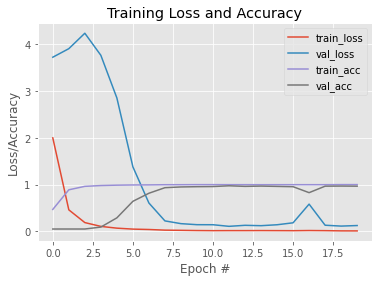

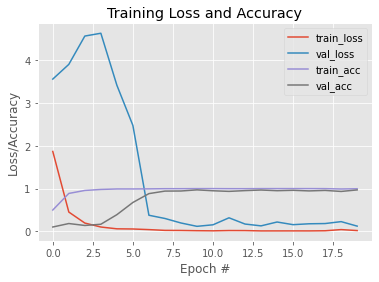

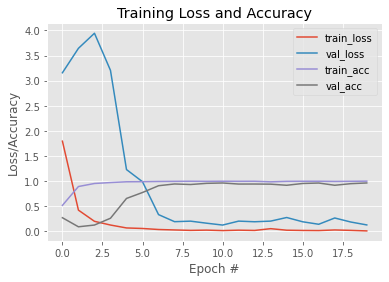

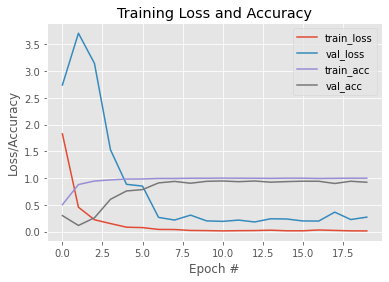

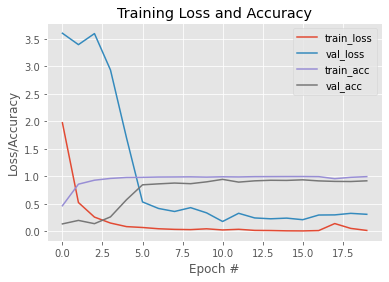

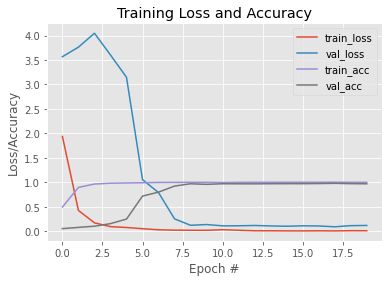

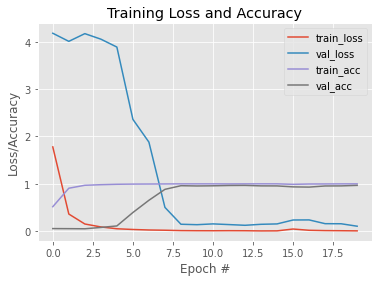

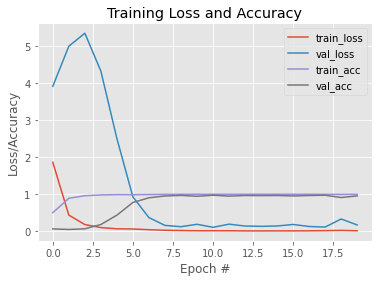

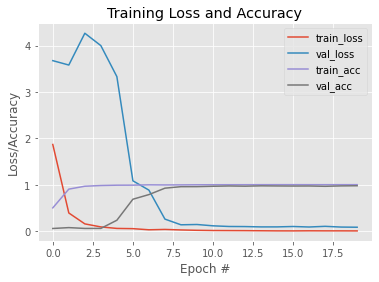

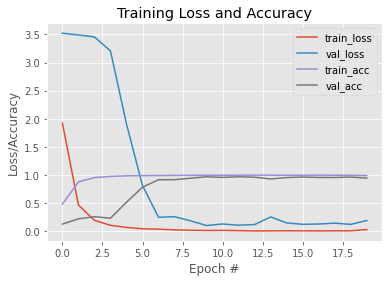

In [ ]:
print('Testing a combination of these kernel sizes: ' + str(kernels))

# All 3,3
kernel_test(kernels[0],kernels[0],kernels[0],kernels[0])
# All 5,5
kernel_test(kernels[1],kernels[1],kernels[1],kernels[1])
# All 7,7
kernel_test(kernels[2],kernels[2],kernels[2],kernels[2])
# All 9,9
kernel_test(kernels[3],kernels[3],kernels[3],kernels[3])
# All 11,11
kernel_test(kernels[4],kernels[4],kernels[4],kernels[4])

# k1=(3,3) , k2=(5,5) ,k3=(5,5) ,k4=(5,5)
kernel_test(kernels[0],kernels[1],kernels[1],kernels[1])
# k1=(3,3) , k2=(5,5) ,k3=(7,7) ,k4=(11,11)
kernel_test(kernels[0],kernels[1],kernels[2],kernels[4])
# k1=(5,5) , k2=(5,5) ,k3=(3,3) ,k4=(3,3)
kernel_test(kernels[1],kernels[1],kernels[0],kernels[0])
# k1=(3,3) , k2=(5,5) ,k3=(5,5) ,k4=(7,7)
kernel_test(kernels[0],kernels[1],kernels[1],kernels[2])
# k1=(5,5) , k2=(7,7) ,k3=(5,5) ,k4=(3,3)
kernel_test(kernels[1],kernels[2],kernels[1],kernels[0])



plt.show()




Test for MiniVGGNet with following kernel combination initialization
[(3, 3), (5, 5), (3, 3), (3, 3)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 2s 23ms/step - loss: 1.9805 - accuracy: 0.4752 - val_loss: 3.8489 - val_accuracy: 0.0465
Epoch 2/20
79/79 [==============================] - 2s 20ms/step - loss: 0.4308 - accuracy: 0.8946 - val_loss: 4.6753 - val_accuracy: 0.0685
Epoch 3/20
79/79 [==============================] - 2s 20ms/step - loss: 0.1769 - accuracy: 0.9602 - val_loss: 4.9735 - val_accuracy: 0.0542
Epoch 4/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0962 - accuracy: 0.9819 - val_loss: 5.3845 - val_accuracy: 0.0800
Epoch 5/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0728 - accuracy: 0.9851 - val_loss: 3.5364 - val_accuracy: 0.3018
Epoch 6/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0419 - accuracy: 0.9923 - val_loss: 2.6121 - val_accuracy: 0.5630
Epoch 7/20
79/79 [=====

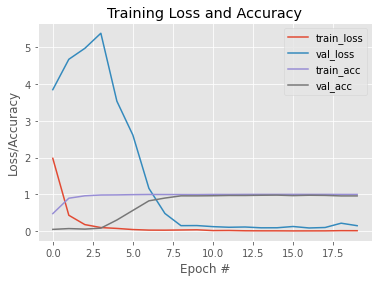

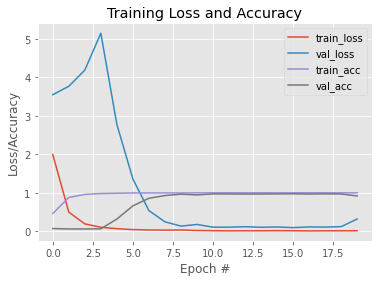

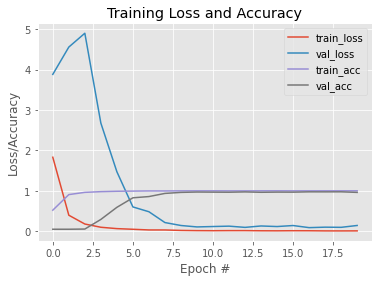

In [ ]:
# k1=(3,3) , k2=(5,5) ,k3=(3,3) ,k4=(3,3)
kernel_test(kernels[0],kernels[1],kernels[0],kernels[0])
# k1=(3,3) , k2=(5,5) ,k3=(5,5) ,k4=(3,3)
kernel_test(kernels[0],kernels[1],kernels[1],kernels[0])
# k1=(5,5) , k2=(3,3) ,k3=(3,3) ,k4=(3,3)
kernel_test(kernels[1],kernels[0],kernels[0],kernels[0])



Test for MiniVGGNet with following kernel combination initialization
[(3, 3), (5, 5), (3, 3), (3, 3)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 2s 23ms/step - loss: 2.0511 - accuracy: 0.4470 - val_loss: 3.8175 - val_accuracy: 0.0637
Epoch 2/20
79/79 [==============================] - 2s 20ms/step - loss: 0.4516 - accuracy: 0.8893 - val_loss: 4.2572 - val_accuracy: 0.0476
Epoch 3/20
79/79 [==============================] - 2s 20ms/step - loss: 0.1729 - accuracy: 0.9620 - val_loss: 4.3919 - val_accuracy: 0.0907
Epoch 4/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0968 - accuracy: 0.9798 - val_loss: 4.0436 - val_accuracy: 0.0975
Epoch 5/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0596 - accuracy: 0.9881 - val_loss: 2.8193 - val_accuracy: 0.3306
Epoch 6/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0403 - accuracy: 0.9934 - val_loss: 2.7037 - val_accuracy: 0.4673
Epoch 7/20
79/79 [=====

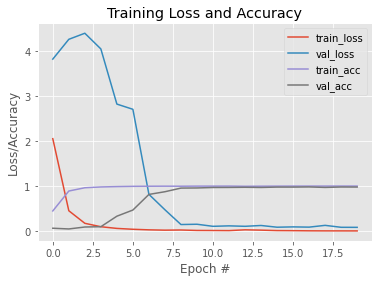

In [ ]:
# k1=(3,3) , k2=(5,5) ,k3=(3,3) ,k4=(3,3)
kernel_test(kernels[0],kernels[1],kernels[0],kernels[0])



Test for MiniVGGNet with following kernel combination initialization
[(3, 3), (5, 5), (5, 5), (3, 3)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 2s 24ms/step - loss: 1.9110 - accuracy: 0.4907 - val_loss: 3.6071 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 2s 20ms/step - loss: 0.4342 - accuracy: 0.8884 - val_loss: 3.9048 - val_accuracy: 0.0535
Epoch 3/20
79/79 [==============================] - 2s 20ms/step - loss: 0.1762 - accuracy: 0.9598 - val_loss: 4.3837 - val_accuracy: 0.0492
Epoch 4/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0927 - accuracy: 0.9805 - val_loss: 4.3307 - val_accuracy: 0.0651
Epoch 5/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0557 - accuracy: 0.9901 - val_loss: 3.1042 - val_accuracy: 0.2381
Epoch 6/20
79/79 [==============================] - 2s 20ms/step - loss: 0.0398 - accuracy: 0.9926 - val_loss: 1.9619 - val_accuracy: 0.4624
Epoch 7/20
79/79 [=====

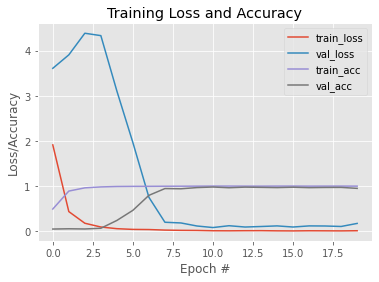

In [ ]:
# k1=(3,3) , k2=(5,5) ,k3=(5,5) ,k4=(3,3)
kernel_test(kernels[0],kernels[1],kernels[1],kernels[0])

|Kernel Sizes|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|All (3,3)|99.90|96.53|97|
|All (5,5)|99.50|96.78|95|
|All (7,7)|99.83|96.26|95|
|All (9,9)|99.75|92.09|92|
|All (11,11)|99.63|92|91|
|(3, 3), (5, 5), (5, 5), (5, 5)|99.81|96.8|95|
|(3, 3), (5, 5), (7, 7), (11, 11)|99.92|96.69|96|
|(5, 5), (5, 5), (3, 3), (3, 3)|99.60|95.35|95|
|(3, 3), (5, 5), (5, 5), (7, 7)|99.99|97.6|96|
|(5, 5), (7, 7), (5, 5), (3, 3)|99.18|94.72|94|
|(3, 3), (5, 5), (3, 3), (3, 3)|99.92|97.78|96|
|(3, 3), (5, 5), (5, 5), (3, 3)|99.77|91.70|91|
|(5, 5), (3, 3), (3, 3), (3, 3)|99.86|95.94|96|

### Convolution layer size

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, s1, s2, s3, s4):

        initializer = random_uniform(seed=5468)

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(s1, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(s2, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(s3, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(s4, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model

In [ ]:
def test_conv_size(s1,s2,s3,s4, train_images = train_images, train_labels = train_labels,
                valid_images = valid_images, valid_labels = valid_labels,
                test_images = test_images, test_labels = test_labels):
    print('\n\nTest for MiniVGGNet with following convolution layer size combination')
    print(str([s1,s2,s3,s4]))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, s1=s1, s2=s2, s3=s3, s4=s4)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()





Test for MiniVGGNet with following convolution layer size combination
[32, 32, 32, 32]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 2s 20ms/step - loss: 2.0619 - accuracy: 0.4573 - val_loss: 3.7071 - val_accuracy: 0.0583
Epoch 2/20
79/79 [==============================] - 1s 17ms/step - loss: 0.4976 - accuracy: 0.8715 - val_loss: 4.0941 - val_accuracy: 0.0739
Epoch 3/20
79/79 [==============================] - 1s 17ms/step - loss: 0.2218 - accuracy: 0.9489 - val_loss: 4.1930 - val_accuracy: 0.0483
Epoch 4/20
79/79 [==============================] - 1s 17ms/step - loss: 0.1377 - accuracy: 0.9669 - val_loss: 3.4054 - val_accuracy: 0.1585
Epoch 5/20
79/79 [==============================] - 1s 17ms/step - loss: 0.0880 - accuracy: 0.9826 - val_loss: 2.3697 - val_accuracy: 0.3347
Epoch 6/20
79/79 [==============================] - 1s 17ms/step - loss: 0.0628 - accuracy: 0.9854 - val_loss: 1.1468 - val_accuracy: 0.6569
Epoch 7/20
79/79 [====================

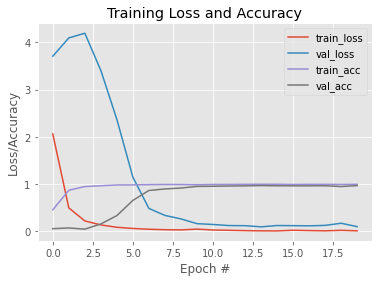

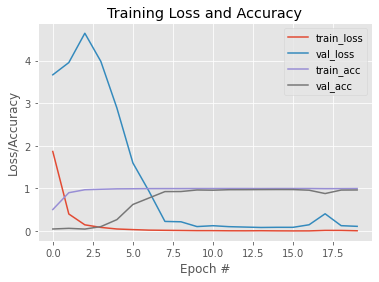

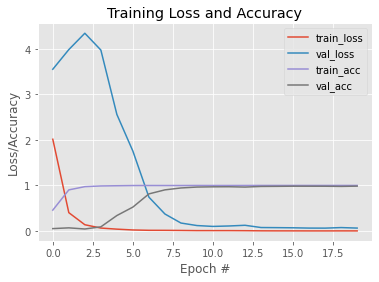

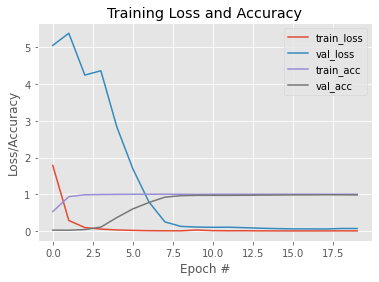

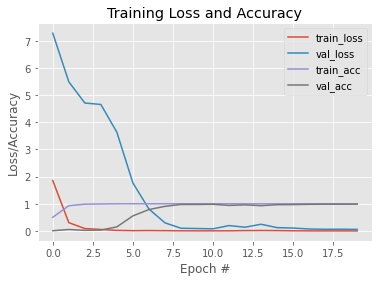

...

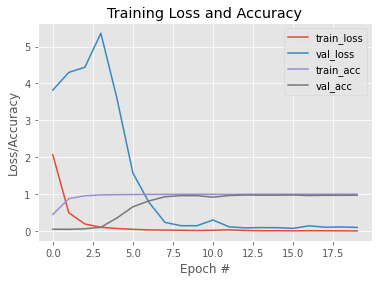

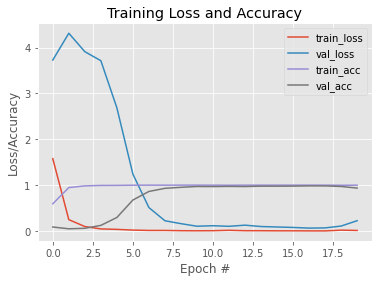

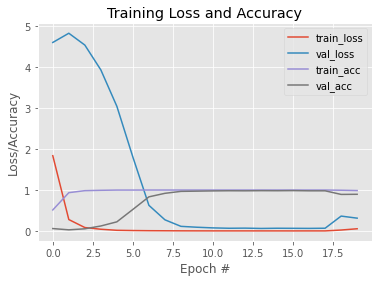

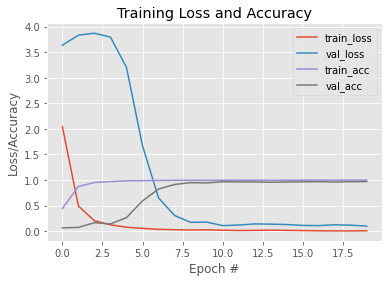

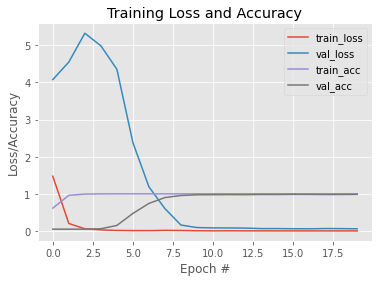

In [ ]:
convSizes
# [32, 64, 128, 256, 512]

# All 32
test_conv_size(convSizes[0],convSizes[0],convSizes[0],convSizes[0])
# All 64
test_conv_size(convSizes[1],convSizes[1],convSizes[1],convSizes[1])
# All 128
test_conv_size(convSizes[2],convSizes[2],convSizes[2],convSizes[2])
# All 256
test_conv_size(convSizes[3],convSizes[3],convSizes[3],convSizes[3])
# All 512
test_conv_size(convSizes[4],convSizes[4],convSizes[4],convSizes[4])

# [32, 32, 64, 32]
test_conv_size(convSizes[0],convSizes[0],convSizes[1],convSizes[0])
# [32, 32, 64, 64]
test_conv_size(convSizes[0],convSizes[0],convSizes[1],convSizes[1])
# [32, 64, 128, 256]
test_conv_size(convSizes[0],convSizes[1],convSizes[2],convSizes[3])
# [128, 256, 512, 512]
test_conv_size(convSizes[2],convSizes[3],convSizes[4],convSizes[4])
# [64, 64, 32, 32]
test_conv_size(convSizes[1],convSizes[1],convSizes[0],convSizes[0])
# [64, 128, 256, 512]
test_conv_size(convSizes[1],convSizes[2],convSizes[3],convSizes[4])

plt.show()



Test for MiniVGGNet with following convolution layer size combination
[32, 64, 128, 256]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 3s 36ms/step - loss: 1.5899 - accuracy: 0.5880 - val_loss: 3.8687 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 3s 33ms/step - loss: 0.2564 - accuracy: 0.9450 - val_loss: 3.8309 - val_accuracy: 0.0655
Epoch 3/20
79/79 [==============================] - 3s 33ms/step - loss: 0.0913 - accuracy: 0.9855 - val_loss: 3.6631 - val_accuracy: 0.0898
Epoch 4/20
79/79 [==============================] - 3s 33ms/step - loss: 0.0494 - accuracy: 0.9933 - val_loss: 3.4183 - val_accuracy: 0.1363
Epoch 5/20
79/79 [==============================] - 3s 33ms/step - loss: 0.0242 - accuracy: 0.9967 - val_loss: 2.7952 - val_accuracy: 0.2789
Epoch 6/20
79/79 [==============================] - 3s 33ms/step - loss: 0.0153 - accuracy: 0.9988 - val_loss: 1.2548 - val_accuracy: 0.7200
Epoch 7/20
79/79 [==================

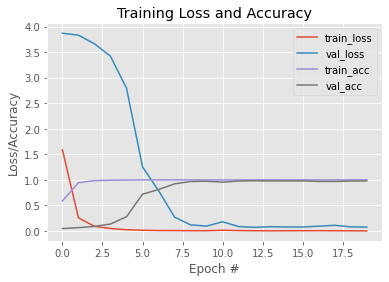

In [ ]:
# [32, 64, 128, 256]
test_conv_size(convSizes[0],convSizes[1],convSizes[2],convSizes[3])



Test for MiniVGGNet with following convolution layer size combination
[512, 512, 512, 512]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 29s 366ms/step - loss: 2.0038 - accuracy: 0.4612 - val_loss: 8.0086 - val_accuracy: 0.0204
Epoch 2/20
79/79 [==============================] - 30s 375ms/step - loss: 0.4006 - accuracy: 0.9021 - val_loss: 8.1402 - val_accuracy: 0.0204
Epoch 3/20
79/79 [==============================] - 30s 386ms/step - loss: 0.1095 - accuracy: 0.9800 - val_loss: 6.3141 - val_accuracy: 0.0324
Epoch 4/20
79/79 [==============================] - 31s 394ms/step - loss: 0.0491 - accuracy: 0.9935 - val_loss: 4.7061 - val_accuracy: 0.0719
Epoch 5/20
79/79 [==============================] - 31s 398ms/step - loss: 0.0240 - accuracy: 0.9976 - val_loss: 4.0630 - val_accuracy: 0.1696
Epoch 6/20
79/79 [==============================] - 32s 404ms/step - loss: 0.0112 - accuracy: 0.9997 - val_loss: 2.2424 - val_accuracy: 0.4948
Epoch 7/20
79/79 [====

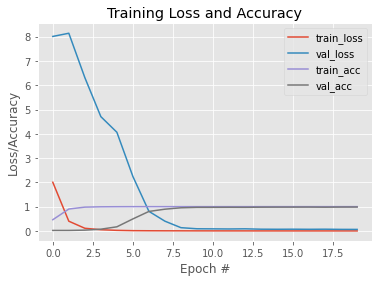

In [ ]:
# All 512
test_conv_size(convSizes[4],convSizes[4],convSizes[4],convSizes[4])



Test for MiniVGGNet with following convolution layer size combination
[32, 64, 128, 128]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 3s 33ms/step - loss: 1.7164 - accuracy: 0.5474 - val_loss: 3.8719 - val_accuracy: 0.0272
Epoch 2/20
79/79 [==============================] - 2s 29ms/step - loss: 0.2953 - accuracy: 0.9316 - val_loss: 4.3481 - val_accuracy: 0.0272
Epoch 3/20
79/79 [==============================] - 2s 29ms/step - loss: 0.1097 - accuracy: 0.9786 - val_loss: 4.6683 - val_accuracy: 0.0499
Epoch 4/20
79/79 [==============================] - 2s 29ms/step - loss: 0.0525 - accuracy: 0.9926 - val_loss: 3.8762 - val_accuracy: 0.0728
Epoch 5/20
79/79 [==============================] - 2s 29ms/step - loss: 0.0329 - accuracy: 0.9954 - val_loss: 3.7761 - val_accuracy: 0.1880
Epoch 6/20
79/79 [==============================] - 2s 29ms/step - loss: 0.0281 - accuracy: 0.9962 - val_loss: 1.9680 - val_accuracy: 0.5506
Epoch 7/20
79/79 [==================

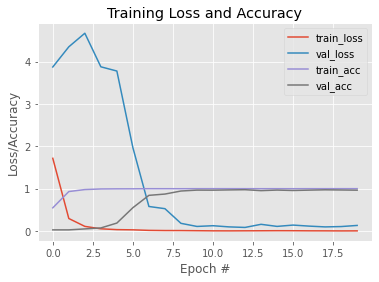

In [ ]:
# [32, 64, 128, 128]
test_conv_size(convSizes[0],convSizes[1],convSizes[2],convSizes[2])

|Covolution Layer Sizes|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|All 32|99.66|97.01|96|
|All 64|99.86|96.51|97|
|All 128|100.00|98.46|97|
|All 256|99.99|98.14|97|
|32, 32, 64, 32|99.78|97.10|96|
|32, 32, 64, 64|99.91|97.23|97|
|32, 64, 128, 256|100.00|98.03|97|
|128, 256, 512, 512|98.73|89.61|89|
|64, 64, 32, 32|99.83|97.01|96|
|64, 128, 256, 512|100.00|98.53|97|

### Loss funtion

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes):

        initializer = random_uniform(seed=5468)

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(512, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with loss mean_squared_error
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 21s 264ms/step - loss: 0.0140 - accuracy: 0.5080 - val_loss: 0.0249 - val_accuracy: 0.0721
Epoch 2/20
79/79 [==============================] - 21s 262ms/step - loss: 0.0021 - accuracy: 0.9516 - val_loss: 0.0287 - val_accuracy: 0.0481
Epoch 3/20
79/79 [==============================] - 21s 267ms/step - loss: 5.8293e-04 - accuracy: 0.9883 - val_loss: 0.0392 - val_accuracy: 0.0179
Epoch 4/20
79/79 [==============================] - 21s 271ms/step - loss: 3.8423e-04 - accuracy: 0.9927 - val_loss: 0.0305 - val_accuracy: 0.1381
Epoch 5/20
79/79 [==============================] - 22s 280ms/step - loss: 1.7563e-04 - accuracy: 0.9976 - val_loss: 0.0209 - val_accuracy: 0.4077
Epoch 6/20
79/79 [==============================] - 22s 284ms/step - loss: 1.3475e-04 - accuracy: 0.9978 - val_loss: 0.0150 - val_accuracy: 0.6156
Epoch 7/20
79/79 [==============================

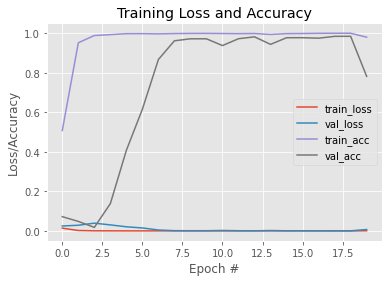

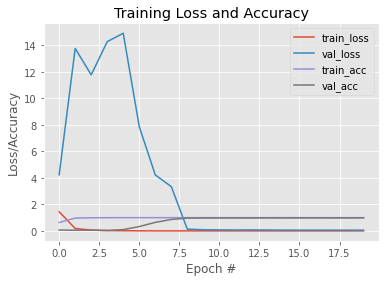

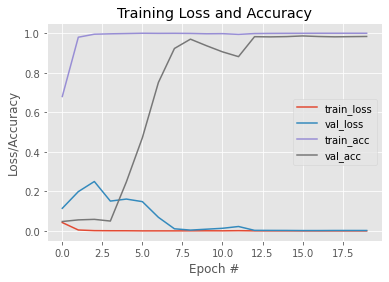

In [ ]:
for loss in lossList:

    print('\n\nTest for MiniVGGNet with loss ' + str(loss))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
    model.compile(loss = loss, optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()

|Loss Function|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|Mean Squared Error|97.99|78.19|78|
|Categorical Crossentropy|100.00|98.53|98|
|Binary Crossentropy|100.00|98.37|98|

### Dense layer size

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, dense):

        initializer = random_uniform(seed=5468)

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with dense layer size 64
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 6s 71ms/step - loss: 2.8333 - accuracy: 0.3878 - val_loss: 3.7499 - val_accuracy: 0.0440
Epoch 2/20
79/79 [==============================] - 5s 69ms/step - loss: 1.3062 - accuracy: 0.8496 - val_loss: 4.1686 - val_accuracy: 0.0068
Epoch 3/20
79/79 [==============================] - 5s 68ms/step - loss: 0.5339 - accuracy: 0.9634 - val_loss: 4.3595 - val_accuracy: 0.0082
Epoch 4/20
79/79 [==============================] - 5s 68ms/step - loss: 0.2465 - accuracy: 0.9895 - val_loss: 4.4112 - val_accuracy: 0.0358
Epoch 5/20
79/79 [==============================] - 5s 68ms/step - loss: 0.1347 - accuracy: 0.9956 - val_loss: 4.9044 - val_accuracy: 0.0161
Epoch 6/20
79/79 [==============================] - 5s 69ms/step - loss: 0.0895 - accuracy: 0.9974 - val_loss: 4.1715 - val_accuracy: 0.2365
Epoch 7/20
79/79 [==============================] - 5s 69ms/step - loss: 0.0555 

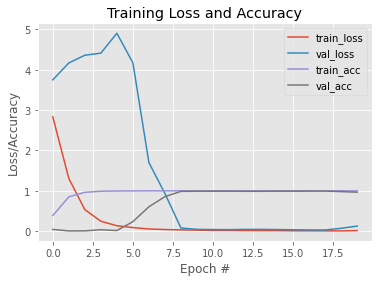

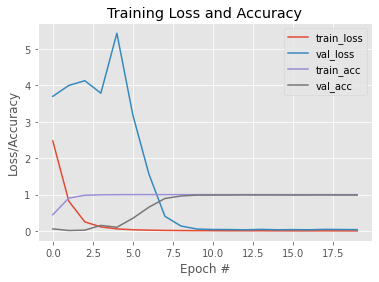

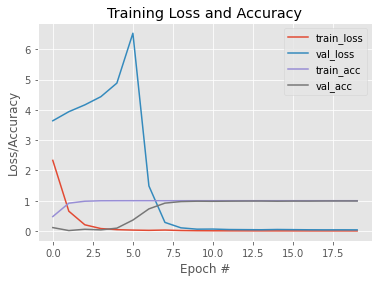

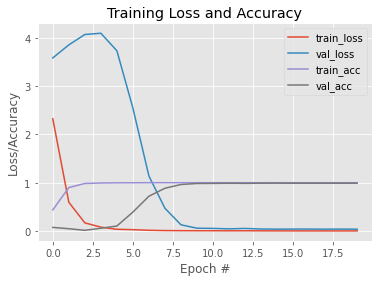

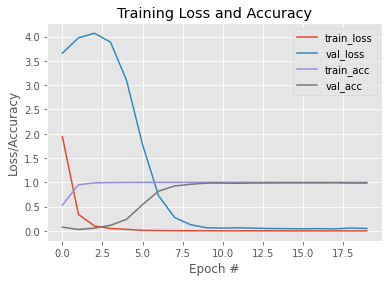

...

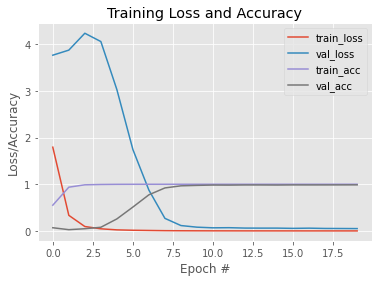

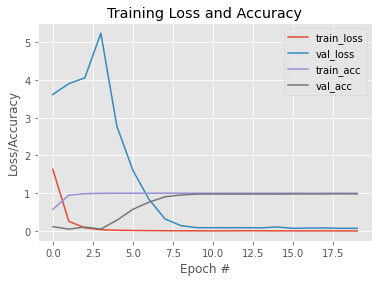

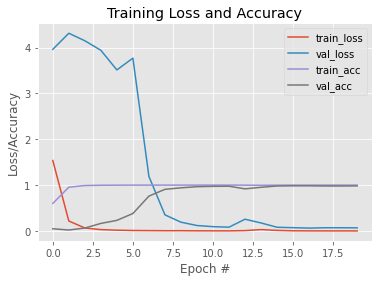

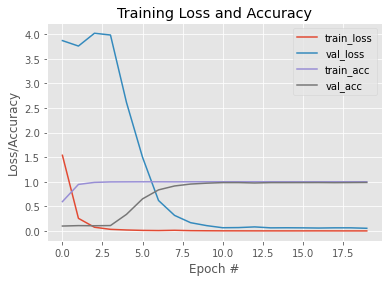

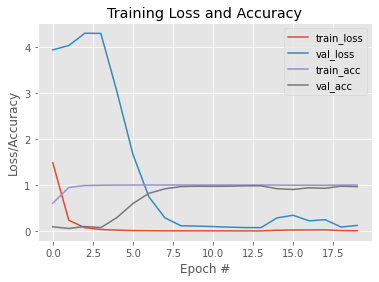

In [ ]:
for dense in denseLayer:

    print('\n\nTest for MiniVGGNet with dense layer size ' + str(dense))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, dense=dense)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()



Test for MiniVGGNet with dense layer size 64
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 6s 71ms/step - loss: 2.8555 - accuracy: 0.3478 - val_loss: 3.6570 - val_accuracy: 0.0837
Epoch 2/20
79/79 [==============================] - 5s 69ms/step - loss: 1.2993 - accuracy: 0.8307 - val_loss: 3.9633 - val_accuracy: 0.0218
Epoch 3/20
79/79 [==============================] - 5s 68ms/step - loss: 0.4959 - accuracy: 0.9617 - val_loss: 4.4970 - val_accuracy: 0.0476
Epoch 4/20
79/79 [==============================] - 6s 70ms/step - loss: 0.2200 - accuracy: 0.9877 - val_loss: 3.7672 - val_accuracy: 0.0844
Epoch 5/20
79/79 [==============================] - 6s 70ms/step - loss: 0.1147 - accuracy: 0.9949 - val_loss: 7.0946 - val_accuracy: 0.0204
Epoch 6/20
79/79 [==============================] - 6s 71ms/step - loss: 0.0721 - accuracy: 0.9984 - val_loss: 3.3848 - val_accuracy: 0.3231
Epoch 7/20
79/79 [==============================] - 6s 71ms/step - loss: 0.0465 

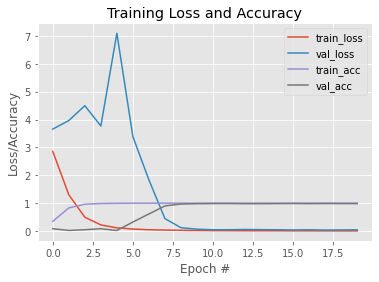

In [ ]:
dense = denseLayer[0]

print('\n\nTest for MiniVGGNet with dense layer size ' + str(dense))

tf.keras.backend.clear_session()

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, dense=dense)
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
print(model.summary())

print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.show()

|Dense Layer|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|64|100.00|98.39|99|98.73|
|100|100.00|98.87|99|99.07|
|128|100.00|99.05|99|99.07|
|175|100.00|99.07|98|99.07|
|225|99.98|98.62|98|99.07|
|256|100.00|98.50|98|98.59|
|300|100.00|98.73|98|98.73|
|450|100.00|98.14|97|98.37|
|500|100.00|98.28|98|98.28|
|512|100.00|98.66|97|9.66|
|600|99.94|96.39|97|97.35|


### Pool and stride

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, p1, p2, s1, s2):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = p1, strides = s1))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = p2, strides = s2))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model

In [ ]:
def pool_test(p1,p2,s1,s2, train_images = train_images, train_labels = train_labels,
                valid_images = valid_images, valid_labels = valid_labels,
                test_images = test_images, test_labels = test_labels):
    print('\n\nTest for MiniVGGNet with following kernel combination initialization')
    print('[p1,p2,s1,s2] = ' + str([p1,p2,s1,s2]))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, p1=p1,p2=p2,s1=s1,s2=s2)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

Testing a combination of these pool and stride sizes: 
Pool sizes: [(2, 2), (3, 3), (4, 4)]
Strides : [(1, 1), (2, 2), (3, 3), (4, 4)]


Test for MiniVGGNet with following kernel combination initialization
[p1,p2,s1,s2] = [(2, 2), (2, 2), (1, 1), (1, 1)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 18s 230ms/step - loss: 2.2516 - accuracy: 0.5289 - val_loss: 3.6279 - val_accuracy: 0.0717
Epoch 2/20
79/79 [==============================] - 18s 228ms/step - loss: 0.5677 - accuracy: 0.9439 - val_loss: 3.9919 - val_accuracy: 0.0263
Epoch 3/20
79/79 [==============================] - 19s 237ms/step - loss: 0.1607 - accuracy: 0.9903 - val_loss: 14.9878 - val_accuracy: 0.0345
Epoch 4/20
79/79 [==============================] - 19s 236ms/step - loss: 0.0669 - accuracy: 0.9982 - val_loss: 4.7758 - val_accuracy: 0.0810
Epoch 5/20
79/79 [==============================] - 18s 227ms/step - loss: 0.0328 - accuracy: 0.9991 - val_loss: 4.8771 - val_accuracy: 0.1218
Ep

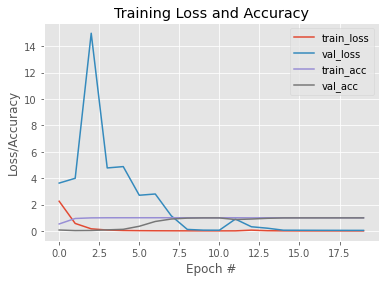

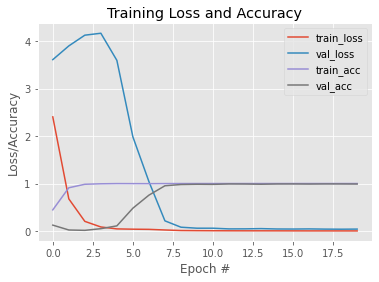

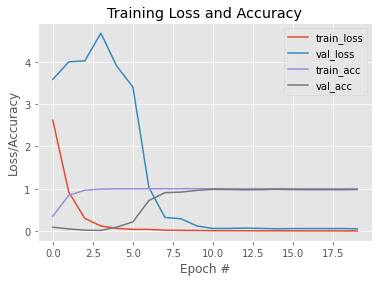

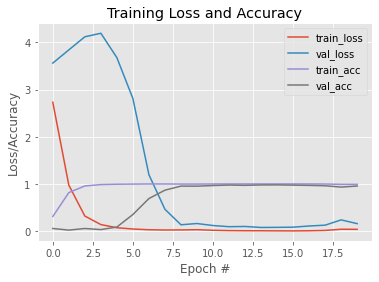

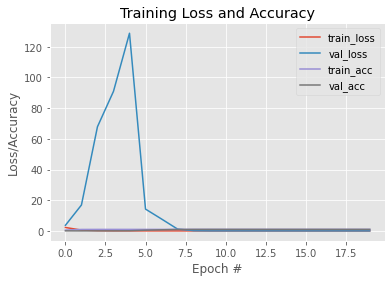

...

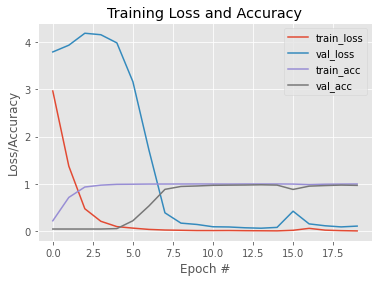

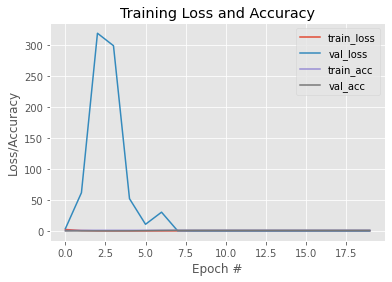

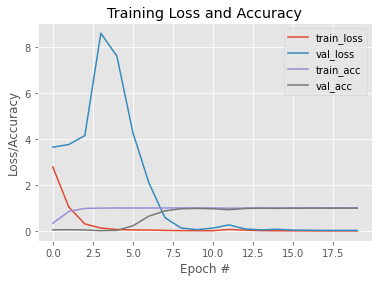

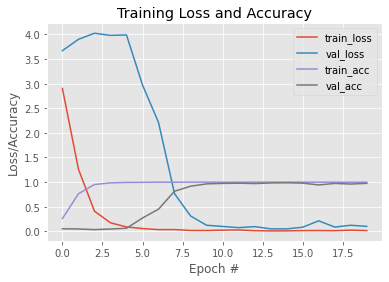

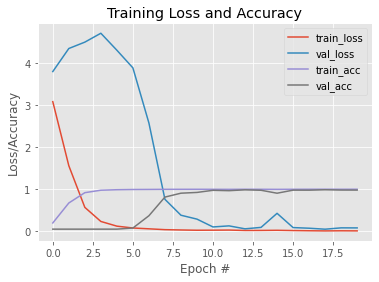

In [ ]:
print('Testing a combination of these pool and stride sizes: ')
print('Pool sizes: ' + str(poolSizes))
print('Strides : ' + str(strides))

for i in range(0,3):
    for j in range(0,4):
        pool_test(poolSizes[i],poolSizes[i],strides[j],strides[j])

plt.show()


Initial Test results:

|[P1,P2,S1,S2]|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|[(2, 2), (2, 2), (1, 1), (1, 1)]|100.00|98.87|99|98.87|
|[(2, 2), (2, 2), (2, 2), (2, 2)]|100.00|98.98|98|99.18|
|[(2, 2), (2, 2), (3, 3), (3, 3)]|100.00|98.16|98|98.64|
|[(2, 2), (2, 2), (4, 4), (4, 4)]|99.09|95.51|93|97.96|
|[(3, 3), (3, 3), (1, 1), (1, 1)]|100.00|99.23|99|99.23|
|[(3, 3), (3, 3), (2, 2), (2, 2)]|100.00|99.52|99|99.52|
|[(3, 3), (3, 3), (3, 3), (3, 3)]|99.88|94.97|95|99.05|
|[(3, 3), (3, 3), (4, 4), (4, 4)]|99.95|96.98|97|97.57|
|[(4, 4), (4, 4), (1, 1), (1, 1)]|100.00|99.32|99|99.39|
|[(4, 4), (4, 4), (2, 2), (2, 2)]|100.00|99.14|99|99.27|
|[(4, 4), (4, 4), (3, 3), (3, 3)]|99.75|97.44|97|98.62|
|[(4, 4), (4, 4), (4, 4), (4, 4)]|99.96|95.98|95|98.75|





Test for MiniVGGNet with following kernel combination initialization
[p1,p2,s1,s2] = [(2, 2), (2, 2), (4, 4), (4, 4)]
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 3s 41ms/step - loss: 2.8270 - accuracy: 0.2776 - val_loss: 3.7216 - val_accuracy: 0.0576
Epoch 2/20
79/79 [==============================] - 3s 38ms/step - loss: 1.0961 - accuracy: 0.7819 - val_loss: 3.9662 - val_accuracy: 0.0204
Epoch 3/20
79/79 [==============================] - 3s 38ms/step - loss: 0.3610 - accuracy: 0.9465 - val_loss: 4.2596 - val_accuracy: 0.0476
Epoch 4/20
79/79 [==============================] - 3s 38ms/step - loss: 0.1574 - accuracy: 0.9817 - val_loss: 4.3768 - val_accuracy: 0.0136
Epoch 5/20
79/79 [==============================] - 3s 38ms/step - loss: 0.0842 - accuracy: 0.9911 - val_loss: 4.0429 - val_accuracy: 0.0741
Epoch 6/20
79/79 [==============================] - 3s 38ms/step - loss: 0.0488 - accuracy: 0.9963 - val_loss: 3.4761 - val_accuracy: 0.2136
Epoch 7

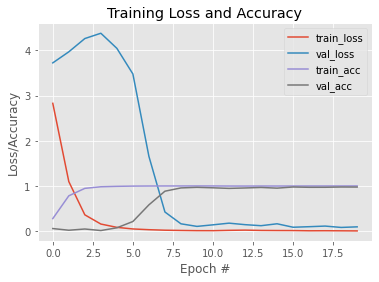

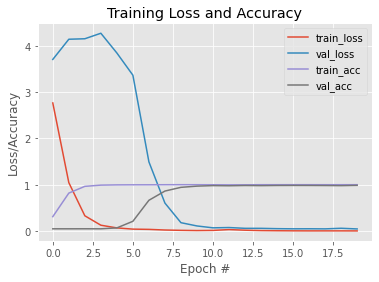

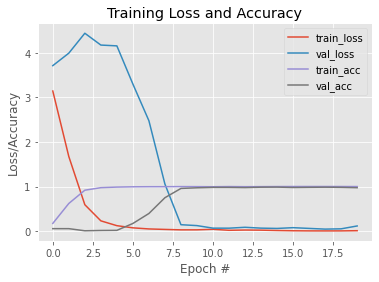

In [ ]:
pool_test((2, 2), (2, 2), (4, 4), (4, 4))
pool_test((3, 3), (3, 3), (3, 3), (3, 3))
pool_test((4, 4), (4, 4), (4, 4), (4, 4))

Final Test Results,

|[P1,P2,S1,S2]|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|[(2, 2), (2, 2), (4, 4), (4, 4)]|99.96|97.53|96|97.64|
|[(3, 3), (3, 3), (3, 3), (3, 3)]|100.00|98.62|98|98.61|
|[(4, 4), (4, 4), (4, 4), (4, 4)]|99.86|98.30|97|98.46|

Picking following pool and stride sizes,
Pool 1: (3,3), Stride 1: (1,1)
Pool 2: (3,3), Stride 2: (1,1)

### Dropout

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, drop):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(drop))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with dense layer dropout value 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 16s 205ms/step - loss: 2.0067 - accuracy: 0.6623 - val_loss: 4.0346 - val_accuracy: 0.0510
Epoch 2/20
79/79 [==============================] - 16s 203ms/step - loss: 0.3215 - accuracy: 0.9844 - val_loss: 41.7939 - val_accuracy: 0.0136
Epoch 3/20
79/79 [==============================] - 16s 204ms/step - loss: 0.0688 - accuracy: 0.9983 - val_loss: 65.8919 - val_accuracy: 0.0340
Epoch 4/20
79/79 [==============================] - 16s 208ms/step - loss: 0.0365 - accuracy: 0.9988 - val_loss: 47.1003 - val_accuracy: 0.0150
Epoch 5/20
79/79 [==============================] - 17s 211ms/step - loss: 0.0137 - accuracy: 1.0000 - val_loss: 48.8602 - val_accuracy: 0.1317
Epoch 6/20
79/79 [==============================] - 17s 212ms/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 41.6897 - val_accuracy: 0.3943
Epoch 7/20
79/79 [==============================] - 17s

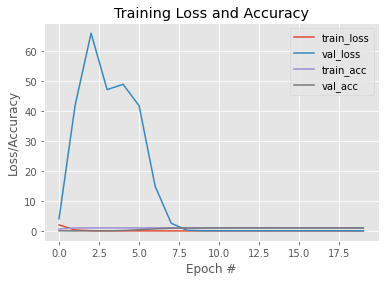

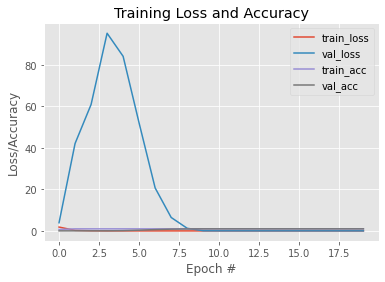

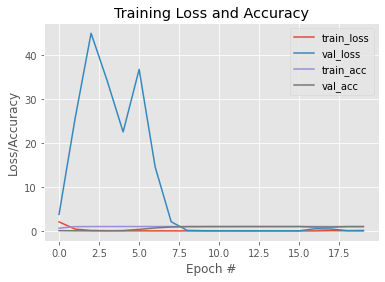

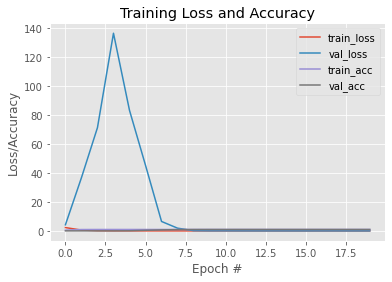

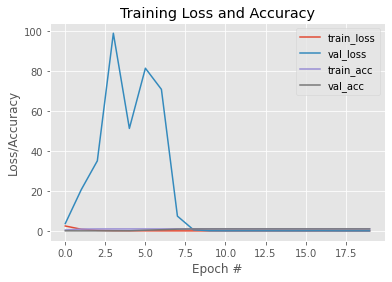

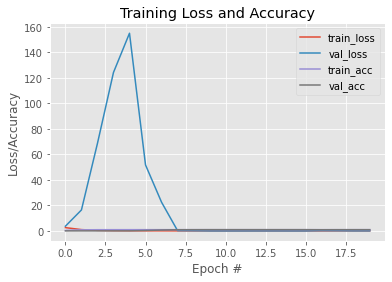

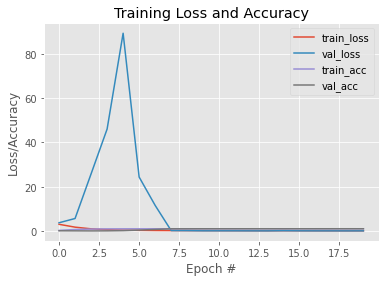

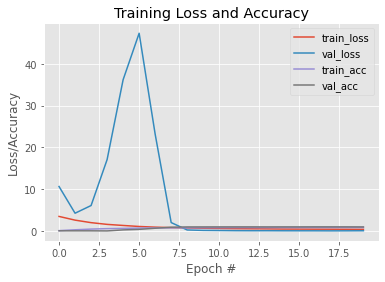

In [ ]:
for drop in denseDropouts:

    print('\n\nTest for MiniVGGNet with dense layer dropout value ' + str(drop))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, drop=drop)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Dropout value|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|0|100.00|98.41|99|98.49|
|0.2|100.00|99.48|99|99.50|
|0.4|99.90|97.87|97|99.18|
|0.5|100.00|99.09|99|99.46|
|0.6|100.00|99.30|99|99.30|
|0.7|99.87|98.03|98|98.21|
|0.8|99.41|98.73|99|99.55|
|0.9|84.29|97.91|98|99.23|




Test for MiniVGGNet with dense layer dropout value 0.4
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 17s 220ms/step - loss: 2.0812 - accuracy: 0.6378 - val_loss: 4.0883 - val_accuracy: 0.0331
Epoch 2/20
79/79 [==============================] - 18s 225ms/step - loss: 0.4406 - accuracy: 0.9766 - val_loss: 68.4047 - val_accuracy: 0.0544
Epoch 3/20
79/79 [==============================] - 18s 231ms/step - loss: 0.1176 - accuracy: 0.9963 - val_loss: 119.4623 - val_accuracy: 0.0340
Epoch 4/20
79/79 [==============================] - 19s 236ms/step - loss: 0.0524 - accuracy: 0.9990 - val_loss: 120.9530 - val_accuracy: 0.0385
Epoch 5/20
79/79 [==============================] - 18s 228ms/step - loss: 0.0261 - accuracy: 0.9999 - val_loss: 166.0332 - val_accuracy: 0.1104
Epoch 6/20
79/79 [==============================] - 18s 226ms/step - loss: 0.0156 - accuracy: 1.0000 - val_loss: 103.9264 - val_accuracy: 0.3404
Epoch 7/20
79/79 [==============================]

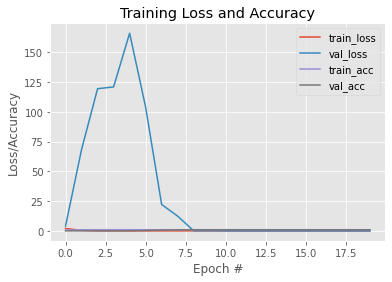

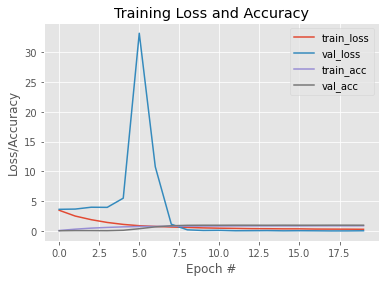

In [ ]:
for drop in [0.4, 0.9]:

    print('\n\nTest for MiniVGGNet with dense layer dropout value ' + str(drop))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, drop=drop)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Dropout value|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|0.4|100.00|99.34|99|99.34|
|0.9|88.59|98.78|98|99.34|




Test for MiniVGGNet with dense layer dropout value 0.4
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 17s 220ms/step - loss: 2.4947 - accuracy: 0.4905 - val_loss: 3.9064 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 18s 226ms/step - loss: 0.7528 - accuracy: 0.9351 - val_loss: 13.9121 - val_accuracy: 0.0136
Epoch 3/20
79/79 [==============================] - 18s 233ms/step - loss: 0.2190 - accuracy: 0.9904 - val_loss: 31.8610 - val_accuracy: 0.0152
Epoch 4/20
79/79 [==============================] - 19s 237ms/step - loss: 0.0888 - accuracy: 0.9972 - val_loss: 26.1912 - val_accuracy: 0.0290
Epoch 5/20
79/79 [==============================] - 18s 228ms/step - loss: 0.0443 - accuracy: 0.9994 - val_loss: 31.2604 - val_accuracy: 0.1263
Epoch 6/20
79/79 [==============================] - 18s 226ms/step - loss: 0.0295 - accuracy: 0.9994 - val_loss: 24.1056 - val_accuracy: 0.3757
Epoch 7/20
79/79 [==============================] - 1

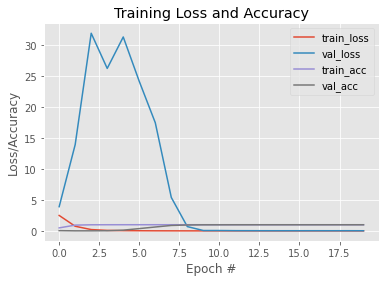

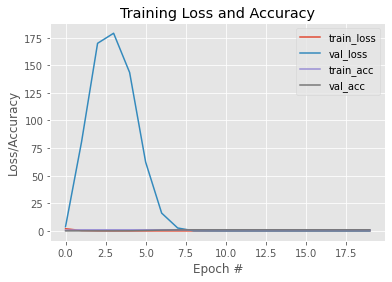

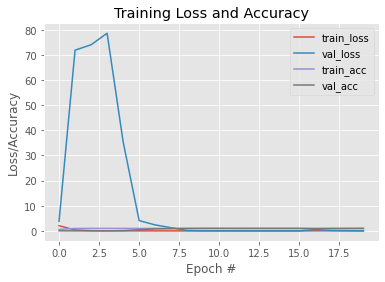

In [ ]:
for i in range(0,3,1):
    
    drop = 0.4
    print('\n\nTest for MiniVGGNet with dense layer dropout value ' + str(drop))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, drop=drop)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Dropout value|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|0.4|100.00|99.30|99|99.34|
|0.4|100.00|99.30|99|99.41|
|0.4|100.00|98.75|98|99.27|

Therefore, picking 0.4 for dense layer dropout

### Pool Dropout

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, drop1=0.25, drop2=0.25):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(drop1))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(drop2))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with pool 1 dropout value 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 16s 205ms/step - loss: 1.8096 - accuracy: 0.6749 - val_loss: 5.4488 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 16s 203ms/step - loss: 0.2525 - accuracy: 0.9873 - val_loss: 26.9842 - val_accuracy: 0.0179
Epoch 3/20
79/79 [==============================] - 16s 203ms/step - loss: 0.0661 - accuracy: 0.9980 - val_loss: 33.5601 - val_accuracy: 0.0438
Epoch 4/20
79/79 [==============================] - 16s 205ms/step - loss: 0.0272 - accuracy: 0.9998 - val_loss: 25.2068 - val_accuracy: 0.0381
Epoch 5/20
79/79 [==============================] - 16s 208ms/step - loss: 0.0129 - accuracy: 1.0000 - val_loss: 4.3060 - val_accuracy: 0.2120
Epoch 6/20
79/79 [==============================] - 17s 209ms/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 2.2855 - val_accuracy: 0.5184
Epoch 7/20
79/79 [==============================] - 17s 211ms/

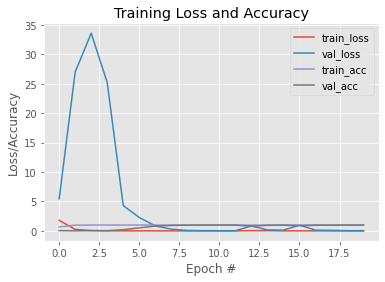

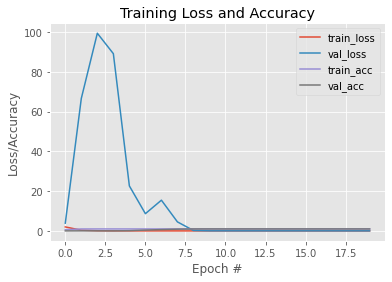

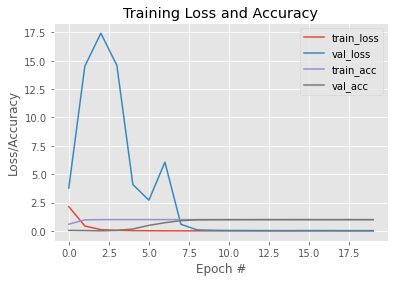

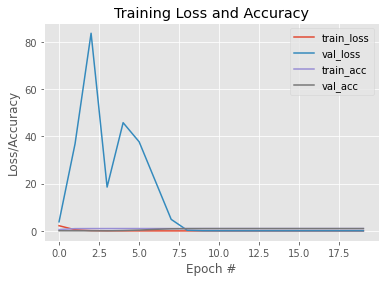

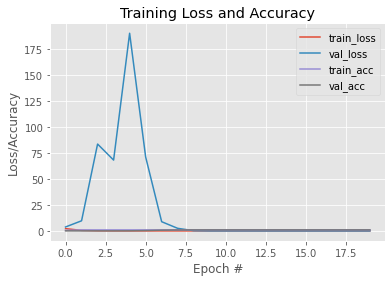

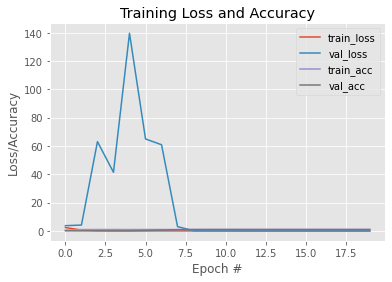

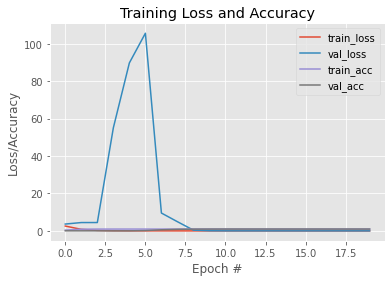

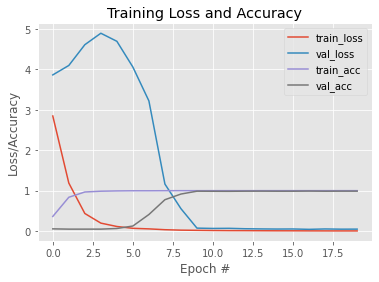

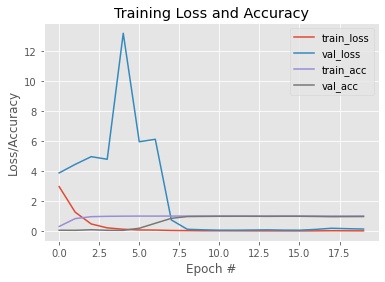

In [ ]:
for drop1 in poolDropouts:

    print('\n\nTest for MiniVGGNet with pool 1 dropout value ' + str(drop1))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, drop1=drop1)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Pool 1 dropout value|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|0|100.00|99.02|99|99.02|
|0.1|100.00|99.30|99|99.37|
|0.25|100.00|99.21|99|99.41|
|0.35|100.00|98.78|99|98.78|
|0.5|100.00|99.34|99|99.34|
|0.6|100.00|99.30|99|99.32|
|0.75|100.00|99.23|99|99.34|
|0.8|100.00|98.78|99|98.80|
|0.9|99.88|96.58|97|98.48|




Test for MiniVGGNet with pool 2 dropout value 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 17s 216ms/step - loss: 2.1536 - accuracy: 0.6163 - val_loss: 5.1022 - val_accuracy: 0.0043
Epoch 2/20
79/79 [==============================] - 17s 213ms/step - loss: 0.4733 - accuracy: 0.9778 - val_loss: 139.9573 - val_accuracy: 0.0340
Epoch 3/20
79/79 [==============================] - 17s 212ms/step - loss: 0.1272 - accuracy: 0.9959 - val_loss: 229.2088 - val_accuracy: 0.0388
Epoch 4/20
79/79 [==============================] - 17s 212ms/step - loss: 0.0558 - accuracy: 0.9989 - val_loss: 285.6719 - val_accuracy: 0.0136
Epoch 5/20
79/79 [==============================] - 17s 212ms/step - loss: 0.0284 - accuracy: 0.9999 - val_loss: 213.9855 - val_accuracy: 0.0447
Epoch 6/20
79/79 [==============================] - 17s 212ms/step - loss: 0.0165 - accuracy: 1.0000 - val_loss: 140.1637 - val_accuracy: 0.2537
Epoch 7/20
79/79 [==============================] - 17s

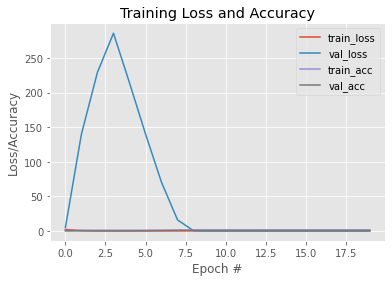

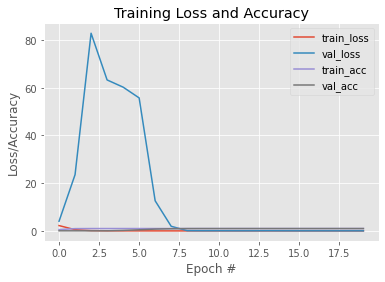

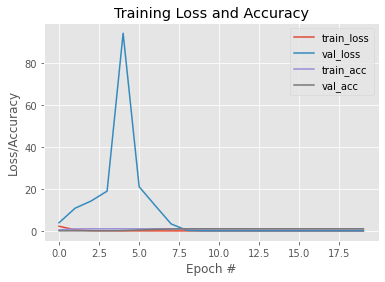

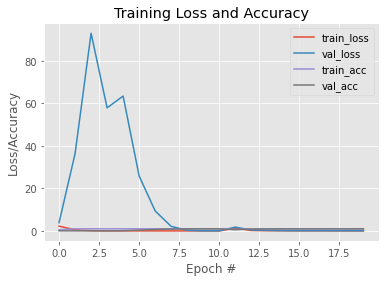

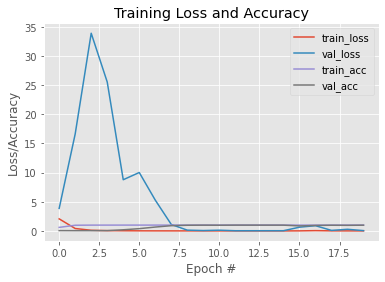

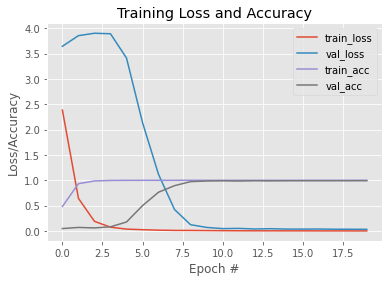

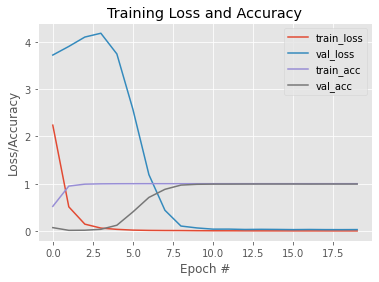

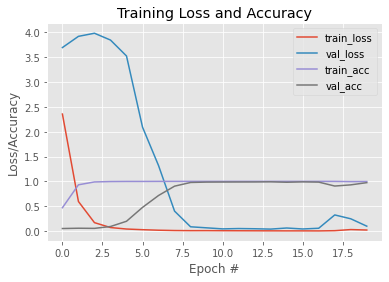

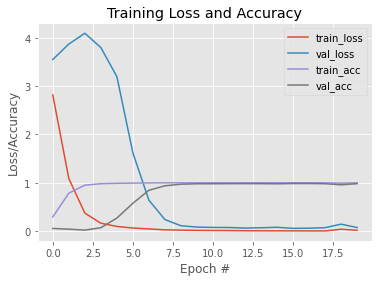

In [ ]:
for drop2 in poolDropouts:

    print('\n\nTest for MiniVGGNet with pool 2 dropout value ' + str(drop2))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, drop2=drop2)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Pool 2 dropout value|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy| Max. Val. Accuracy|
|---|---|---|---|---|
|0|100.00|99.41|99|99.46|
|0.1|100.00|98.89|99|99.00|
|0.25|100.00|99.16|99|99.23|
|0.35|99.76|97.37|97|98.96|
|0.5|100.00|98.55|99|99.34|
|0.6|100.00|99.23|99|99.23|
|0.75|100.00|99.27|99|99.30|
|0.8|99.68|97.44|97|99.12|
|0.9|99.82|98.23|98|98.44|


Droout values on pooling layers do not seem to affect the model significantly. Sticking with initial dropout values for pooling layers.
Pool 1 dropout: 0.25
Pool 2 dropout: 0.25

### Kernel Regularizer

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, lambda1):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer, kernel_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer, kernel_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with L1 parameter 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 19s 235ms/step - loss: 2.1283 - accuracy: 0.5937 - val_loss: 3.8263 - val_accuracy: 0.0651
Epoch 2/20
79/79 [==============================] - 19s 244ms/step - loss: 0.4401 - accuracy: 0.9701 - val_loss: 15.8856 - val_accuracy: 0.0079
Epoch 3/20
79/79 [==============================] - 19s 244ms/step - loss: 0.1187 - accuracy: 0.9945 - val_loss: 57.1505 - val_accuracy: 0.0544
Epoch 4/20
79/79 [==============================] - 19s 235ms/step - loss: 0.0591 - accuracy: 0.9983 - val_loss: 29.4032 - val_accuracy: 0.0181
Epoch 5/20
79/79 [==============================] - 19s 235ms/step - loss: 0.0256 - accuracy: 0.9997 - val_loss: 22.3396 - val_accuracy: 0.1204
Epoch 6/20
79/79 [==============================] - 19s 238ms/step - loss: 0.0174 - accuracy: 0.9999 - val_loss: 16.1898 - val_accuracy: 0.4630
Epoch 7/20
79/79 [==============================] - 19s 239ms/step -

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       1.00      0.10      0.18        60
                              Speed limit (30km/h)       1.00      0.03      0.06       720
                              Speed limit (50km/h)       0.96      0.43      0.59       750
                              Speed limit (60km/h)       0.95      0.04      0.08       450
                              Speed limit (70km/h)       0.27      0.83      0.41       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       1.00      0.14      0.25       150
                             Speed limit (100km/h)       0.80      0.65      0.71       450
                             Speed limit (120km/h)       1.00      0.11      0.20       450
                                        No passing       0.96      0.65      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.13      0.40      0.20        60
                              Speed limit (30km/h)       0.39      0.12      0.18       720
                              Speed limit (50km/h)       0.51      0.25      0.33       750
                              Speed limit (60km/h)       1.00      0.02      0.03       450
                              Speed limit (70km/h)       0.98      0.42      0.59       660
                              Speed limit (80km/h)       0.32      0.01      0.02       630
                       End of speed limit (80km/h)       0.64      0.59      0.62       150
                             Speed limit (100km/h)       1.00      0.00      0.01       450
                             Speed limit (120km/h)       0.86      0.07      0.13       450
                                        No passing       0.92      0.46      0.

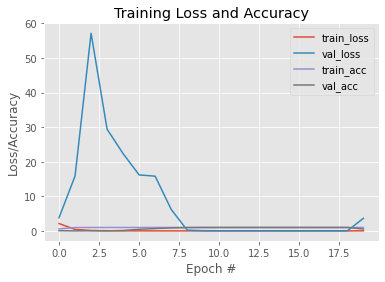

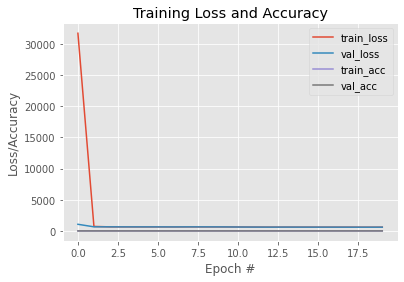

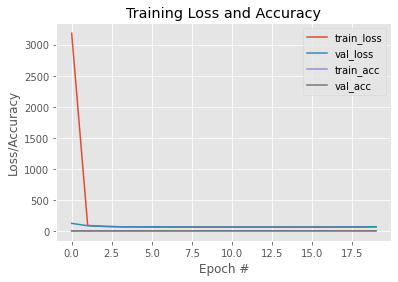

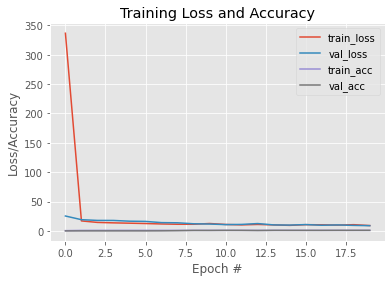

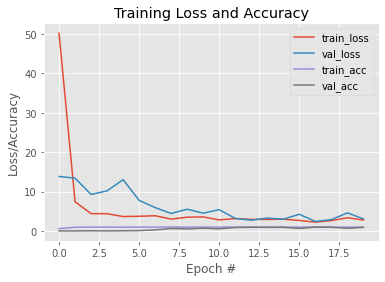

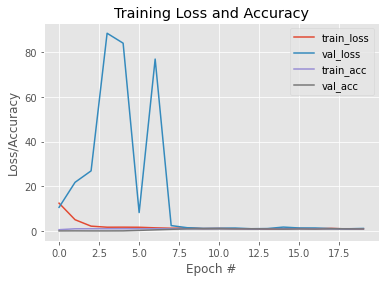

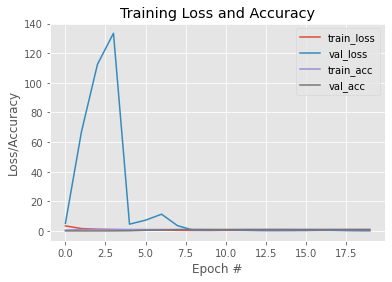

In [ ]:
for lambda1 in lambda1s:

    print('\n\nTest for MiniVGGNet with L1 parameter ' + str(lambda1))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, lambda1=lambda1)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Kernel L1 Reg.|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|0|100.00|99.14|99|
|0.1|66.51|58.28|53|
|0.01|89.35|82.52|-|
|0.001|96.47|96.15|92|
|0.0001|98.42|90.66|87|
|0.00001|99.45|93.40|91|
|0.000001|99.97|98.12|98|


In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, lambda2):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer, kernel_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer, kernel_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer, kernel_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with L2 parameter 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 19s 240ms/step - loss: 2.2520 - accuracy: 0.5816 - val_loss: 3.7150 - val_accuracy: 0.0544
Epoch 2/20
79/79 [==============================] - 19s 237ms/step - loss: 0.5244 - accuracy: 0.9715 - val_loss: 104.0587 - val_accuracy: 0.0340
Epoch 3/20
79/79 [==============================] - 19s 237ms/step - loss: 0.1420 - accuracy: 0.9960 - val_loss: 157.5907 - val_accuracy: 0.0340
Epoch 4/20
79/79 [==============================] - 19s 237ms/step - loss: 0.0593 - accuracy: 0.9982 - val_loss: 249.6704 - val_accuracy: 0.0365
Epoch 5/20
79/79 [==============================] - 19s 236ms/step - loss: 0.0326 - accuracy: 0.9994 - val_loss: 143.1722 - val_accuracy: 0.1261
Epoch 6/20
79/79 [==============================] - 19s 236ms/step - loss: 0.0179 - accuracy: 1.0000 - val_loss: 106.0732 - val_accuracy: 0.3422
Epoch 7/20
79/79 [==============================] - 19s 236ms/s

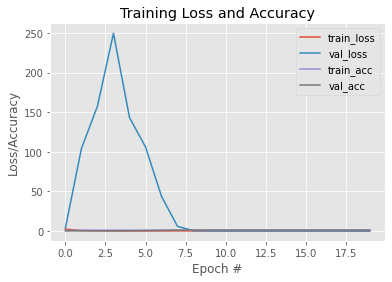

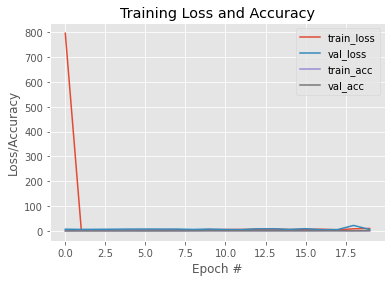

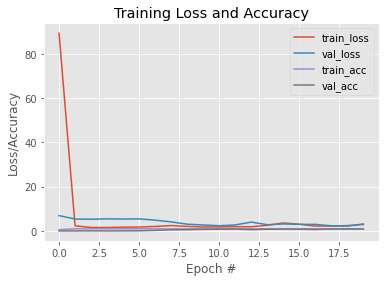

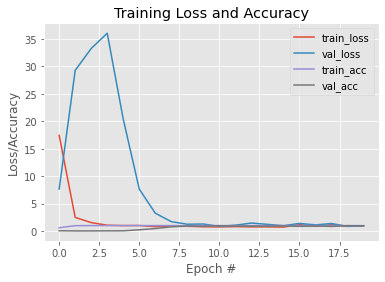

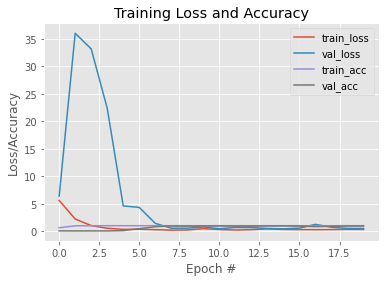

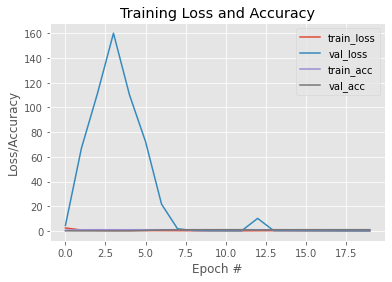

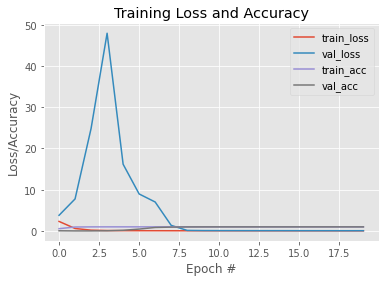

In [ ]:
for lambda2 in lambda2s:

    print('\n\nTest for MiniVGGNet with L2 parameter ' + str(lambda2))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, lambda2=lambda2)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Kernel L2 Reg.|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|0|100.00|98.89|99|
|0.1|89.91|75.22|67|
|0.01|95.81|86.28|81|
|0.001|98.47|94.56|91|
|0.0001|99.46|94.90|98|
|0.00001|100.00|99.00|99|
|0.000001|100.00|99.05|98|


### Activity Regularizer

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, lambda1):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer, activity_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer, activity_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer, activity_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer, activity_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer, activity_regularizer=l1(lambda1)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with L1 parameter 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 21s 263ms/step - loss: 2.1224 - accuracy: 0.6012 - val_loss: 3.7010 - val_accuracy: 0.0590
Epoch 2/20
79/79 [==============================] - 21s 262ms/step - loss: 0.4182 - accuracy: 0.9773 - val_loss: 59.8857 - val_accuracy: 0.0068
Epoch 3/20
79/79 [==============================] - 20s 257ms/step - loss: 0.1079 - accuracy: 0.9964 - val_loss: 152.8144 - val_accuracy: 0.0068
Epoch 4/20
79/79 [==============================] - 20s 254ms/step - loss: 0.0412 - accuracy: 0.9995 - val_loss: 126.9665 - val_accuracy: 0.0068
Epoch 5/20
79/79 [==============================] - 20s 256ms/step - loss: 0.0304 - accuracy: 0.9993 - val_loss: 36.4086 - val_accuracy: 0.2383
Epoch 6/20
79/79 [==============================] - 20s 258ms/step - loss: 0.0164 - accuracy: 0.9997 - val_loss: 35.4555 - val_accuracy: 0.4456
Epoch 7/20
79/79 [==============================] - 20s 257ms/step

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      1.00      0.01        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.01      0.02      0.01        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.09      0.12      0.10        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.04      0.95      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


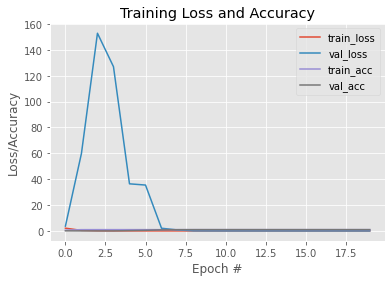

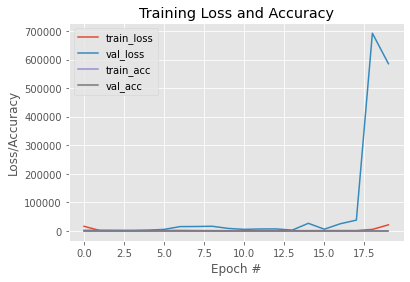

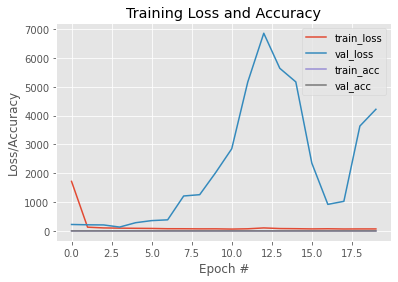

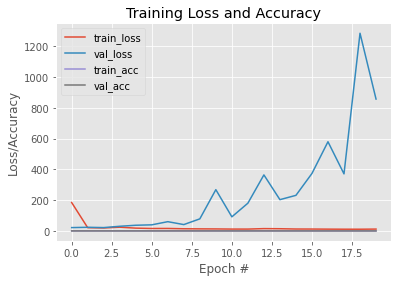

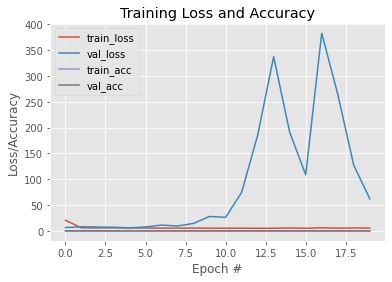

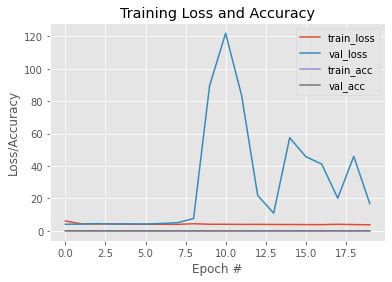

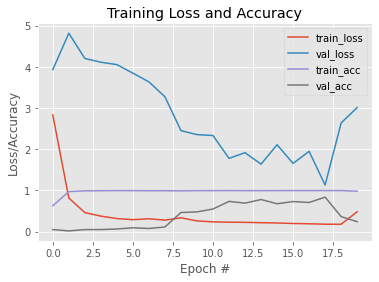

In [ ]:
for lambda1 in lambda1s:

    print('\n\nTest for MiniVGGNet with L1 parameter ' + str(lambda1))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, lambda1=lambda1)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Activity L1 Reg.|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|0|100.00|99.21|99|
|0.1|2.59|0.68|00|
|0.01|2.31|2.06|02|
|0.001|2.86|2.04|02|
|0.0001|2.57|00.68|00|
|0.00001|10.46|3.20|04|
|0.000001|97.88|23.90|23|

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes, lambda2):

        initializer = random_uniform(seed=5468)
        dense = 64

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(32, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer, activity_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(32, (5,5), padding = 'same', kernel_initializer = initializer, activity_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(64, (3,3), padding = 'same', kernel_initializer = initializer, activity_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(64, (3,3), padding = 'same', kernel_initializer = initializer, activity_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer, activity_regularizer=l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model



Test for MiniVGGNet with L2 parameter 0
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 4s 45ms/step - loss: 2.9064 - accuracy: 0.4038 - val_loss: 4.0692 - val_accuracy: 0.0476
Epoch 2/20
79/79 [==============================] - 3s 41ms/step - loss: 1.4738 - accuracy: 0.8212 - val_loss: 4.6040 - val_accuracy: 0.0476
Epoch 3/20
79/79 [==============================] - 3s 41ms/step - loss: 0.6655 - accuracy: 0.9506 - val_loss: 15.9951 - val_accuracy: 0.0100
Epoch 4/20
79/79 [==============================] - 3s 41ms/step - loss: 0.3230 - accuracy: 0.9783 - val_loss: 26.4298 - val_accuracy: 0.0111
Epoch 5/20
79/79 [==============================] - 3s 41ms/step - loss: 0.1802 - accuracy: 0.9912 - val_loss: 11.3834 - val_accuracy: 0.1939
Epoch 6/20
79/79 [==============================] - 3s 41ms/step - loss: 0.1099 - accuracy: 0.9960 - val_loss: 13.6115 - val_accuracy: 0.4347
Epoch 7/20
79/79 [==============================] - 3s 41ms/step - loss: 0.0815 -

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      1.00      0.01        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.00      0.00      0.00       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.00      0.00      0.00       450
                             Speed limit (120km/h)       0.00      0.00      0.00       450
                                        No passing       0.00      0.00      0.

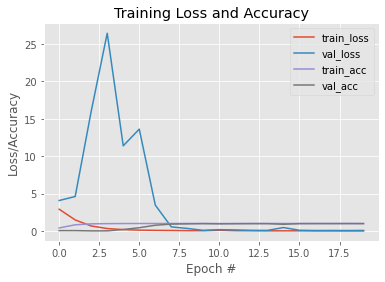

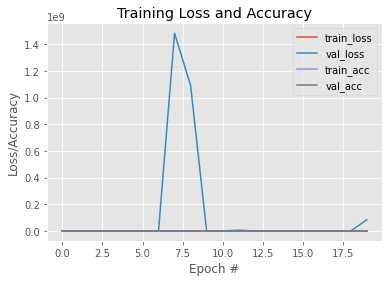

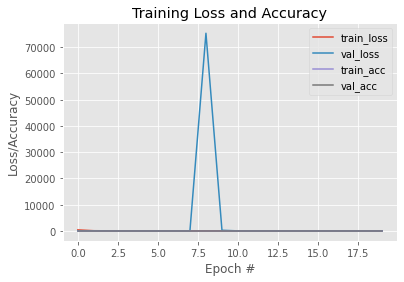

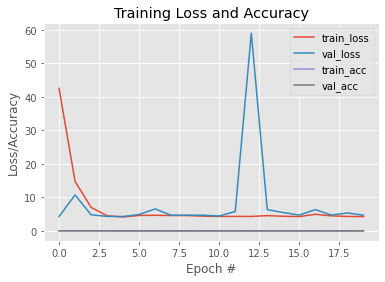

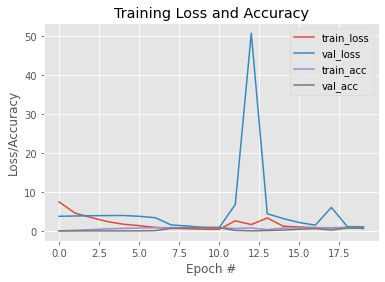

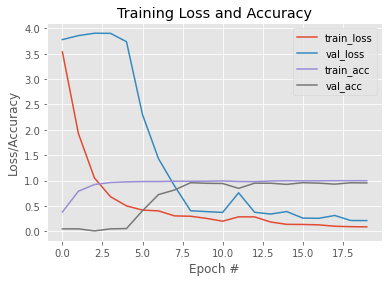

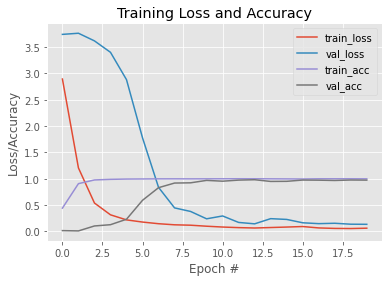

In [ ]:
for lambda2 in lambda2s:

    print('\n\nTest for MiniVGGNet with L2 parameter ' + str(lambda2))

    tf.keras.backend.clear_session()

    lb = LabelBinarizer()
    train_labels = lb.fit_transform(train_labels)
    valid_labels = lb.transform(valid_labels)
    test_labels = lb.transform(test_labels)

    model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES, lambda2=lambda2)
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
    print(model.summary())

    print('\n Test accuracy')
    predictedY = model.predict(test_images)
    predictedY = predictedY.argmax(axis=1)
    train_labels = train_labels.argmax(axis=1)
    valid_labels = valid_labels.argmax(axis=1)
    test_labels = test_labels.argmax(axis=1)
    print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

plt.show()


|Activity L2 Reg.|Train Set Accuracy|Validation Set Accuracy|Test Set Accuracy|
|---|---|---|---|
|0|99.99|98.05|98|
|0.1|2.65|0.68|00|
|0.01|2.89|0.68|01|
|0.001|2.79|0.68|00|
|0.0001|90.14|74.54|67|
|0.00001|99.64|95.24|96|
|0.000001|99.73|97.28|97|

# Snapshot Ensemble

Following ensembles were performed on the final model.

Epoch 1/20
78/78 [==============================] - 18s 229ms/step - loss: 3.0305 - accuracy: 0.3295 - val_loss: 3.8157 - val_accuracy: 0.0075
Epoch 2/20
78/78 [==============================] - 19s 239ms/step - loss: 1.2624 - accuracy: 0.8306 - val_loss: 4.0506 - val_accuracy: 0.0068
Epoch 3/20
78/78 [==============================] - 18s 232ms/step - loss: 0.2532 - accuracy: 0.9831 - val_loss: 4.3571 - val_accuracy: 0.0145
Epoch 4/20
78/78 [==============================] - 18s 224ms/step - loss: 0.0996 - accuracy: 0.9956 - val_loss: 4.1146 - val_accuracy: 0.0592
Epoch 5/20
78/78 [==============================] - 18s 225ms/step - loss: 0.0490 - accuracy: 0.9995 - val_loss: 3.6994 - val_accuracy: 0.1583
Epoch 6/20
78/78 [==============================] - 18s 227ms/step - loss: 0.0392 - accuracy: 0.9995 - val_loss: 2.7845 - val_accuracy: 0.4175
Epoch 7/20
78/78 [==============================] - 18s 229ms/step - loss: 0.0381 - accuracy: 0.9992 - val_loss: 1.5519 - val_accuracy: 0.6599

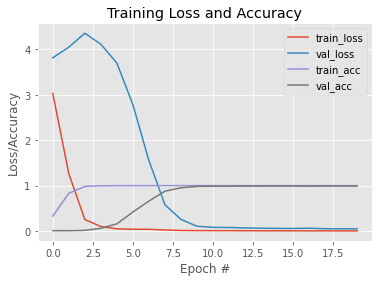

In [ ]:
# Using Adam optimizer with initial lr=0.001


tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
# aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, brightness_range=[0.2,1.8],fill_mode = 'nearest')

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

models = 4
initialLearningRate = 0.001
epochs = 20
maxIt = 20

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
# opt = SGD(lr = initialLearningRate)
opt = Adam(lr = initialLearningRate)
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=BATCH_SIZE)

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

Epoch 1/20
78/78 [==============================] - 18s 228ms/step - loss: 3.8163 - accuracy: 0.0266 - val_loss: 3.8022 - val_accuracy: 0.0132
Epoch 2/20
78/78 [==============================] - 18s 227ms/step - loss: 3.5509 - accuracy: 0.0948 - val_loss: 3.7331 - val_accuracy: 0.0077
Epoch 3/20
78/78 [==============================] - 18s 225ms/step - loss: 3.0998 - accuracy: 0.2235 - val_loss: 3.6522 - val_accuracy: 0.0281
Epoch 4/20
78/78 [==============================] - 18s 225ms/step - loss: 2.8412 - accuracy: 0.2842 - val_loss: 3.5436 - val_accuracy: 0.0732
Epoch 5/20
78/78 [==============================] - 18s 225ms/step - loss: 2.6382 - accuracy: 0.3440 - val_loss: 3.4113 - val_accuracy: 0.1297
Epoch 6/20
78/78 [==============================] - 18s 225ms/step - loss: 2.5616 - accuracy: 0.3614 - val_loss: 3.2507 - val_accuracy: 0.2186
Epoch 7/20
78/78 [==============================] - 18s 225ms/step - loss: 2.4216 - accuracy: 0.3927 - val_loss: 2.8951 - val_accuracy: 0.3503

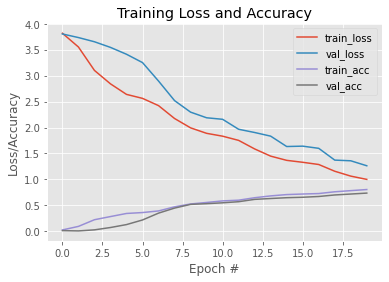

In [ ]:
# Since snapshot ensemble is better suited for SGD
# Using SGD optimizer with initial lr=0.01


tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, brightness_range=[0.2,1.8],fill_mode = 'nearest')

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

models = 4
initialLearningRate = 0.01
epochs = 20
maxIt = 20

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
opt = SGD(lr = initialLearningRate)
# opt = Adam()
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=BATCH_SIZE)

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

Epoch 1/20
78/78 [==============================] - 18s 237ms/step - loss: 3.6030 - accuracy: 0.0792 - val_loss: 3.7364 - val_accuracy: 0.0340
Epoch 2/20
78/78 [==============================] - 18s 230ms/step - loss: 2.4208 - accuracy: 0.3632 - val_loss: 3.3747 - val_accuracy: 0.1395
Epoch 3/20
78/78 [==============================] - 17s 221ms/step - loss: 1.1202 - accuracy: 0.7316 - val_loss: 2.6930 - val_accuracy: 0.2875
Epoch 4/20
78/78 [==============================] - 17s 220ms/step - loss: 0.6170 - accuracy: 0.8649 - val_loss: 1.9565 - val_accuracy: 0.4730
Epoch 5/20
78/78 [==============================] - 18s 224ms/step - loss: 0.4297 - accuracy: 0.9153 - val_loss: 1.2499 - val_accuracy: 0.6649
Epoch 6/20
78/78 [==============================] - 18s 225ms/step - loss: 0.3564 - accuracy: 0.9341 - val_loss: 0.9034 - val_accuracy: 0.7601
Epoch 7/20
78/78 [==============================] - 18s 225ms/step - loss: 0.3366 - accuracy: 0.9288 - val_loss: 0.5554 - val_accuracy: 0.8313

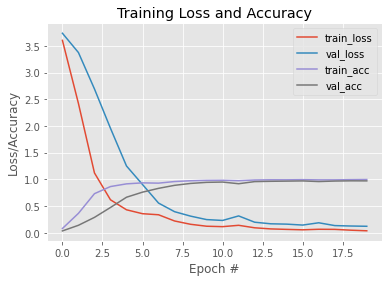

In [ ]:
# Using SGD optimizer with initial lr=0.1

tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, brightness_range=[0.2,1.8],fill_mode = 'nearest')

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

models = 4
initialLearningRate = 0.1
epochs = 20
maxIt = 20

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
opt = SGD(lr = initialLearningRate)
# opt = Adam()
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=BATCH_SIZE)

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

Epoch 1/20
78/78 [==============================] - 17s 219ms/step - loss: 3.0408 - accuracy: 0.2214 - val_loss: 3.6244 - val_accuracy: 0.0544
Epoch 2/20
78/78 [==============================] - 17s 224ms/step - loss: 1.4743 - accuracy: 0.5636 - val_loss: 1.4969 - val_accuracy: 0.5458
Epoch 3/20
78/78 [==============================] - 17s 217ms/step - loss: 0.3356 - accuracy: 0.9071 - val_loss: 0.6390 - val_accuracy: 0.8023
Epoch 4/20
78/78 [==============================] - 17s 214ms/step - loss: 0.1322 - accuracy: 0.9665 - val_loss: 0.3895 - val_accuracy: 0.8698
Epoch 5/20
78/78 [==============================] - 17s 213ms/step - loss: 0.0776 - accuracy: 0.9828 - val_loss: 0.2039 - val_accuracy: 0.9438
Epoch 6/20
78/78 [==============================] - 17s 215ms/step - loss: 0.0563 - accuracy: 0.9894 - val_loss: 0.1585 - val_accuracy: 0.9621
Epoch 7/20
78/78 [==============================] - 17s 216ms/step - loss: 0.1404 - accuracy: 0.9623 - val_loss: 0.1767 - val_accuracy: 0.9492

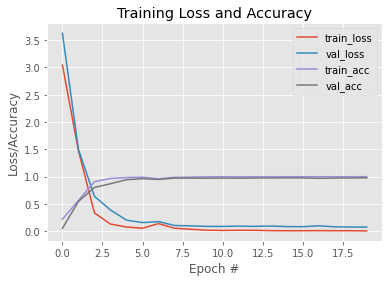

In [ ]:
# Using SGD optimizer with initial lr=0.5

tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator()

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

models = 4
initialLearningRate = 0.5
epochs = 20
maxIt = 20

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
opt = SGD(lr = initialLearningRate)
# opt = Adam()
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=BATCH_SIZE)

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

Epoch 1/20
78/78 [==============================] - 18s 228ms/step - loss: 3.8517 - accuracy: 0.0221 - val_loss: 3.8099 - val_accuracy: 0.0136
Epoch 2/20
78/78 [==============================] - 17s 221ms/step - loss: 2.4626 - accuracy: 0.3263 - val_loss: 2.8210 - val_accuracy: 0.3451
Epoch 3/20
78/78 [==============================] - 17s 213ms/step - loss: 0.9073 - accuracy: 0.7235 - val_loss: 1.3921 - val_accuracy: 0.5760
Epoch 4/20
78/78 [==============================] - 17s 212ms/step - loss: 0.9059 - accuracy: 0.7213 - val_loss: 1.2607 - val_accuracy: 0.6054
Epoch 5/20
78/78 [==============================] - 17s 214ms/step - loss: 0.8849 - accuracy: 0.7262 - val_loss: 1.2088 - val_accuracy: 0.6161
Epoch 6/20
78/78 [==============================] - 17s 217ms/step - loss: 0.9006 - accuracy: 0.7206 - val_loss: 1.1834 - val_accuracy: 0.6229
Epoch 7/20
78/78 [==============================] - 17s 216ms/step - loss: 0.7589 - accuracy: 0.7697 - val_loss: 2.0074 - val_accuracy: 0.4036

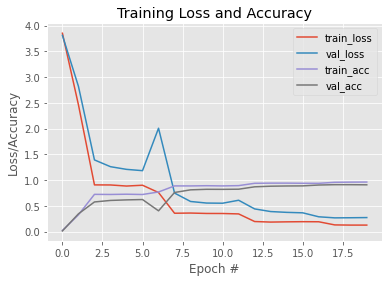

In [ ]:
# Using SGD optimizer with initial lr=1


tf.keras.backend.clear_session()

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator()

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

models = 4
initialLearningRate = 1
epochs = 20
maxIt = 20

# code for a learning rate scheduler
def shiftedCosineLearning(epoch):
    maxEpochs = epochs
    baseLearningRate = initialLearningRate

    alpha = (initialLearningRate/2)*(np.cos(np.pi*np.mod(epoch - 1, np.ceil(epochs/models))/np.ceil(epochs/models)) + 1)
    
    # return the learning rate
    return alpha

callbacks = [LearningRateScheduler(shiftedCosineLearning)]
    
# choose the optimizer
opt = SGD(lr = initialLearningRate)
# opt = Adam()
    
# compile the model
model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
# train the model
checkpoint = ModelCheckpoint('model{epoch:08d}.model', period=np.ceil(epochs/models)) 
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = epochs,
              callbacks = callbacks, steps_per_epoch = len(train_images[:10000]) // BATCH_SIZE, verbose = 1)

# evaluate the network
predictions = model.predict(test_images, batch_size=BATCH_SIZE)

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

report = classification_report(test_labels.argmax(axis=1), predictions.argmax(axis=1), target_names=labels['SignName'])

train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)

As is evident from the two ensembles above; even with a large initial learning rate at the beginning of each learning rate cycle, neither the cost function nor the accuracies change much unless the learning rate is exceptionally high. This possibly indicates that the model potentially has a very wide or flat local/global minima that it tends to stay in.

# Final Model
---

In [ ]:
# Clear Background GPU sessions
tf.keras.backend.clear_session()

class MiniVGGNet:
    def build(height, width, depth, classes):

        initializer = random_uniform(seed=5468)
        dense = 128

        model = Sequential(name = 'MiniVGGNet')
        
        model.add(Conv2D(64, (3,3), padding = 'same', input_shape = (height, width, depth), kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(128, (5,5), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(512, (3,3), padding = 'same', kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (1, 1)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(dense, kernel_initializer = initializer))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Dense(classes, kernel_initializer = initializer))
        model.add(Activation('softmax'))
        
        return model

Training the final model on full Train Set
[INFO] training network...
Epoch 1/20
676/676 [==============================] - 132s 195ms/step - loss: 0.3345 - accuracy: 0.9476 - val_loss: 2.1945 - val_accuracy: 0.9238
Epoch 2/20
676/676 [==============================] - 135s 200ms/step - loss: 0.0653 - accuracy: 0.9857 - val_loss: 0.0853 - val_accuracy: 0.9789
Epoch 3/20
676/676 [==============================] - 135s 200ms/step - loss: 0.0071 - accuracy: 0.9987 - val_loss: 0.0766 - val_accuracy: 0.9757
Epoch 4/20
676/676 [==============================] - 135s 200ms/step - loss: 0.0057 - accuracy: 0.9990 - val_loss: 0.0665 - val_accuracy: 0.9807
Epoch 5/20
676/676 [==============================] - 135s 199ms/step - loss: 0.0067 - accuracy: 0.9986 - val_loss: 0.0508 - val_accuracy: 0.9844
Epoch 6/20
676/676 [==============================] - 135s 199ms/step - loss: 0.0040 - accuracy: 0.9991 - val_loss: 0.0597 - val_accuracy: 0.9864
Epoch 7/20
676/676 [==============================] - 

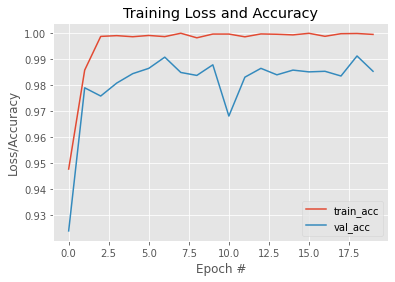

In [ ]:
print('Training the final model on full Train Set')

tf.keras.backend.clear_session()
train_labels = to_categorical(train_labels, 43)
valid_labels = to_categorical(valid_labels, 43)
test_labels = to_categorical(test_labels, 43)

model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model.fit(train_images, train_labels, validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
print(model.summary())

print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.show()



Training for MiniVGGNet
[INFO] training network...
Epoch 1/20
79/79 [==============================] - 18s 232ms/step - loss: 2.0557 - accuracy: 0.6344 - val_loss: 3.7268 - val_accuracy: 0.0204
Epoch 2/20
79/79 [==============================] - 18s 226ms/step - loss: 0.4076 - accuracy: 0.9809 - val_loss: 22.2152 - val_accuracy: 0.0340
Epoch 3/20
79/79 [==============================] - 17s 219ms/step - loss: 0.1104 - accuracy: 0.9966 - val_loss: 134.7511 - val_accuracy: 0.0340
Epoch 4/20
79/79 [==============================] - 17s 218ms/step - loss: 0.0461 - accuracy: 0.9993 - val_loss: 196.7569 - val_accuracy: 0.0338
Epoch 5/20
79/79 [==============================] - 17s 220ms/step - loss: 0.0241 - accuracy: 0.9999 - val_loss: 112.6828 - val_accuracy: 0.0769
Epoch 6/20
79/79 [==============================] - 18s 224ms/step - loss: 0.0168 - accuracy: 0.9998 - val_loss: 1.9708 - val_accuracy: 0.5086
Epoch 7/20
79/79 [==============================] - 17s 221ms/step - loss: 0.0136 

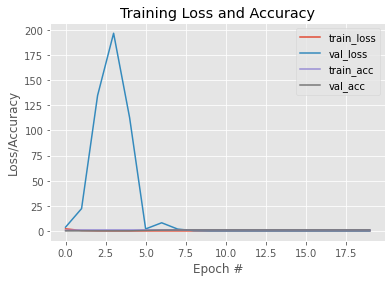

In [ ]:


print('\n\nTraining for MiniVGGNet')

tf.keras.backend.clear_session()

lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)

model = MiniVGGNet.build(32, 32, 3, NUM_CLASSES)
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model.fit(train_images[:10000], train_labels[:10000], validation_data=(valid_images,valid_labels), batch_size = BATCH_SIZE, epochs = maxIt, verbose = 1)
print(model.summary())

print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY,target_names=labels['SignName']))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

plt.show()


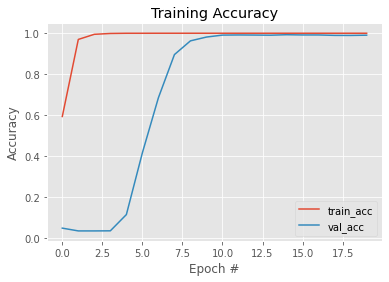

In [ ]:
plt.style.use("ggplot")
plt.figure()
# plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
# plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

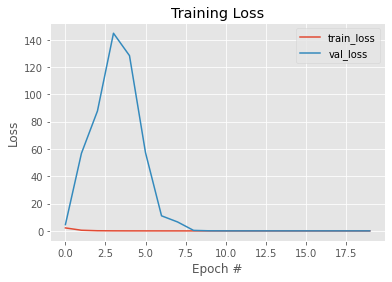

In [ ]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
# plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
# plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [ ]:
lb = LabelBinarizer()
train_labels = lb.fit_transform(train_labels)
valid_labels = lb.transform(valid_labels)
test_labels = lb.transform(test_labels)


print('\n Train accuracy')
predictedY = model.predict(train_images)
predictedY = predictedY.argmax(axis=1)
train_labels = train_labels.argmax(axis=1)
print(classification_report(train_labels, predictedY,target_names=labels['SignName'],digits=4))

print('\n Validation accuracy')
predictedY = model.predict(valid_images)
predictedY = predictedY.argmax(axis=1)
valid_labels = valid_labels.argmax(axis=1)
print(classification_report(valid_labels, predictedY,target_names=labels['SignName'],digits=4))


print('\n Test accuracy')
predictedY = model.predict(test_images)
predictedY = predictedY.argmax(axis=1)
test_labels = test_labels.argmax(axis=1)
print(classification_report(test_labels, predictedY,target_names=labels['SignName'],digits=4))


 Train accuracy
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)     1.0000    1.0000    1.0000      2010
                              Speed limit (30km/h)     1.0000    0.9920    0.9960      2010
                              Speed limit (50km/h)     0.9985    0.9985    0.9985      2010
                              Speed limit (60km/h)     0.9995    0.9945    0.9970      2010
                              Speed limit (70km/h)     0.9980    0.9985    0.9983      2010
                              Speed limit (80km/h)     0.9926    0.9960    0.9943      2010
                       End of speed limit (80km/h)     1.0000    1.0000    1.0000      2010
                             Speed limit (100km/h)     0.9975    1.0000    0.9988      2010
                             Speed limit (120km/h)     0.9950    0.9980    0.9965      2010
                                        No passing     1.0000 

In [ ]:
# Saving model and model weights
model.save_weights(DATA_DIR + 'final_model_weights')
model.save(DATA_DIR + 'final_model')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /content/drive/My Drive/Colab Notebooks (1)/Data/traffic-signs-preprocessed/final_model/assets


Note: Training the final model on only first 10000 of train set (original + augmented) seems to fit the entire dataset much better than training using all 86430 train set images ( ~34000 original + ~52000 augmented images).

This result is backed by the classification report of claddification performed over all ~10000 images (full augmented train + validation + test sets).

Final model classification accuracies;

|Train Set|Validation Set|Test Set|
|---|---|---|
|99.90|99.05|99.07|